In [1]:
import os
from tempfile import tempdir
from time import time
from turtle import color
from unittest.mock import NonCallableMagicMock
import pandas as pd
import numpy as np
import warnings
import math
import re

import seaborn as sns
warnings.filterwarnings("ignore")

import sys
sys.path.append("./")

from pathlib import Path

import tqdm
import importlib

import matplotlib.pyplot as plt
# from PySide2.QtWidgets import QFileDialog, QApplication
# from PySide2.QtCore import Qt
from copy import copy 

from corems.mass_spectra.input import rawFileReader
from corems.molecular_id.factory.classification import HeteroatomsClassification, Labels
from corems.molecular_id.search.priorityAssignment import OxygenPriorityAssignment
from corems.molecular_id.search.molecularFormulaSearch import SearchMolecularFormulas
from corems.encapsulation.factory.parameters import MSParameters
from corems.encapsulation.constant import Atoms
from corems.mass_spectrum.calc.Calibration import MzDomainCalibration

import importlib

import corems.lc_icpms_ftms.calc.lc_icrms_qc_assign as icrms

importlib.reload(icrms)



<module 'corems.lc_icpms_ftms.calc.lc_icrms_qc_assign' from '/Users/christiandewey/CoreMS/corems/lc_icpms_ftms/calc/lc_icrms_qc_assign.py'>

In [2]:
def getParser(file):
    parser = rawFileReader.ImportMassSpectraThermoMSFileReader(file)
    return parser

def assign_formula(parser, interval, timerange, refmasslist=None):
    #Function to build formula assignment lists
    #Retrieve TIC for MS1 scans over the time range between 'timestart' and 'timestop' 

    tic=parser.get_tic(ms_type='MS')[0]
    tic_df=pd.DataFrame({'time': tic.time,'scan': tic.scans})

    times=list(range(timerange[0],timerange[1],interval))

    results=[]
    
    for timestart in times:

        scans=tic_df[tic_df.time.between(timestart,timestart+interval)].scan.tolist()

        mass_spectrum = parser.get_average_mass_spectrum_by_scanlist(scans)    
        mass_spectrum.molecular_search_settings.ion_charge = 1

        #mass_spectrum.mass_spectrum.settings.calib_sn_threshold
        #mass_spectrum.mass_spectrum.settings.calib_pol_order
        #mass_spectrum.recalibrate_mass_spectrum(mass_spectrum, imzmeas, mzrefs, order=2)
        #MzDomainCalibration(mass_spectrum, ref_file_location).run()

        if refmasslist:
            mass_spectrum.settings.min_calib_ppm_error = 10
            mass_spectrum.settings.max_calib_ppm_error = -10
            calfn = MzDomainCalibration(mass_spectrum, refmasslist)
            ref_mass_list_fmt = calfn.load_ref_mass_list(refmasslist)

            imzmeas, mzrefs = calfn.find_calibration_points(mass_spectrum, ref_mass_list_fmt,
                                                        calib_ppm_error_threshold=(0, 2.0),
                                                        calib_snr_threshold=3)

            calfn.recalibrate_mass_spectrum(mass_spectrum, imzmeas, mzrefs, order=2)


        SearchMolecularFormulas(mass_spectrum, first_hit=False).run_worker_mass_spectrum()

        mass_spectrum.percentile_assigned(report_error=True)

        assignments=mass_spectrum.to_dataframe()

        assignments['Time']=timestart

        results.append(assignments)
    
    results=pd.concat(results,ignore_index=True)

    return(results)    

def plot_ms(df1, start_mz, end_mz, tstart, df2=None,df3=None, assignment= None, ax_ms=None, lbls=None, norm=False, labs=False, colors=None):   
    if ax_ms == None:
        f, ax = plt.subplots()
    
    else:
        ax = ax_ms

    if colors is not None:
        cols = colors
    else:
        cols = ['C0', 'C1', 'C2']
    mzrange= end_mz - start_mz
    ms_t_int=df1[df1['Time'] == tstart]
    ms_df = ms_t_int[((ms_t_int['Calibrated m/z']-start_mz)<mzrange) & ((ms_t_int['Calibrated m/z']-start_mz)>0)]

    maxdf1 = max(ms_df['S/N'])

    if norm:
        ms_df['S/N Norm'] = ms_df['S/N'] / maxdf1
    else:
        ms_df['S/N Norm'] = ms_df['S/N'] 

    

    print(ms_df['S/N Norm'])

    if lbls is not None:
        labels = lbls
    else:
        lbls = [None, None, None]

 
    _, stemlines1, _ =ax.stem('Calibrated m/z','S/N Norm',data=ms_df,  markerfmt=' ', basefmt=' ', linefmt=cols[0], label = labels[0])
    
    if df2 is not None:
        ms_t_int2=df2[df2['Time'] == tstart]
        ms_df2 = ms_t_int2[(abs(ms_t_int2['Calibrated m/z']-start_mz)<mzrange)& ((ms_t_int2['Calibrated m/z']-start_mz)>0)]

        maxdf2 = max(ms_df2['S/N'])

        if norm:
            ms_df2['S/N Norm'] = ms_df2['S/N'] / maxdf2
        else:
            ms_df2['S/N Norm'] = ms_df2['S/N'] 
        
        _, stemlines2, _ =ax.stem('Calibrated m/z','S/N Norm',data=ms_df2,  markerfmt=' ', basefmt=' ', linefmt=cols[1], label = labels[1])

    if df3 is not None:
        ms_t_int3=df3[df3['Time'] == tstart]
        ms_df3 = ms_t_int3[(abs(ms_t_int3['Calibrated m/z']-start_mz)<mzrange)& ((ms_t_int3['Calibrated m/z']-start_mz)>0)]

        maxdf3 = max(ms_df3['S/N'])

        if norm:
            ms_df3['S/N Norm'] = ms_df3['S/N'] / maxdf3
        else:
            ms_df3['S/N Norm'] = ms_df3['S/N'] 
        
        _, stemlines3, _ =ax.stem('Calibrated m/z','S/N Norm',data=ms_df3,  markerfmt=' ', basefmt=' ', linefmt=cols[2], label = labels[2])
    
    if df3 is not None:
        ax.set_ylim(0, max([maxdf1, maxdf2, maxdf3]) * 1.1)
    elif df2 is not None:
        ax.set_ylim(0, max([maxdf1, maxdf2]) * 1.1)
    else: 
        ax.set_ylim(0, maxdf1 * 1.1)

    ax.set_xlim(left = start_mz - mzrange*0.1, right = start_mz + mzrange + mzrange*0.1) 

    if labs:
        for mzr,peakr,mf,er in zip(ms_df['Calibrated m/z'], ms_df['S/N Norm'], ms_df['Molecular Formula'],  ms_df['m/z Error (ppm)']):

            #if (mzr- target_mz)  == 0:
            #    mz_text = ' m/z\n%.4f' % (mzr)
            #else:
            #    mz_text = r'$\Delta$' + ' m/z\n%.4f' % (mzr- target_mz)

            mz_text = 'm/z %.4f\n%s\n%.3f ppm' % (mzr,mf,er)
            ax.text(mzr, peakr + 0.02 *max(ms_df['S/N Norm']), mz_text, ha = 'center', fontsize = 'xx-small', weight = 'bold', color=cols[0])

        if df2 is not None:

            for mzr,peakr,mf, er in zip(ms_df2['Calibrated m/z'], ms_df2['S/N Norm'], ms_df2['Molecular Formula'], ms_df2['m/z Error (ppm)']):

            #if (mzr- target_mz)  == 0:
            #    mz_text = ' m/z\n%.4f' % (mzr)
            #else:
            #    mz_text = r'$\Delta$' + ' m/z\n%.4f' % (mzr- target_mz)

                mz_text = 'm/z %.4f\n%s\n%.3f ppm' % (mzr,mf,er)
                ax.text(mzr, peakr + 0.02 *max(ms_df2['S/N Norm']), mz_text, ha = 'center', fontsize = 'xx-small', weight = 'bold', color = cols[1])

        if df3 is not None:

            for mzr,peakr,mf, er in zip(ms_df3['Calibrated m/z'], ms_df3['S/N Norm'], ms_df3['Molecular Formula'], ms_df3['m/z Error (ppm)']):

            #if (mzr- target_mz)  == 0:
            #    mz_text = ' m/z\n%.4f' % (mzr)
            #else:
            #    mz_text = r'$\Delta$' + ' m/z\n%.4f' % (mzr- target_mz)

                mz_text = 'm/z %.4f\n%s\n%.3f ppm' % (mzr,mf,er)
                ax.text(mzr, peakr + 0.02 *max(ms_df3['S/N Norm']), mz_text, ha = 'center', fontsize = 'xx-small', weight = 'bold', color = cols[2])

   # theor_mz=pattern.mdiff+result['mass']
   # theor_int=pattern.ratio*result['abundance']
   # ax.stem(theor_mz,theor_int, basefmt=' ',linefmt='gray')

   # for isotope in pattern.isotope[pattern.requirement=='Y']:
   #     ax.stem('mz','intense',data=result[isotope],  markerfmt=' ', basefmt=' ',linefmt='red')
    if ax == None:

        ax.legend(('other', 'target'),bbox_to_anchor=(1.05, 1.0), loc='upper left',frameon=False)

        if(assignment):

            mf = assignment[0]
            score = assignment[1]
            er = assignment[2]

            ax.text(1.05,0.7,mf,transform=ax.transAxes)
            ax.text(1.05,0.6,'Error (ppm) = %.3f ' %er ,transform=ax.transAxes)
            ax.text(1.05,0.5,'Score = %.3f' %score ,transform=ax.transAxes)

    if norm: 
        ax.set(xlabel='Calibrated m/z',ylabel='Normalized S/N')
    else: 
        ax.set(xlabel='Calibrated m/z',ylabel='S/N')
    #ax.set_title('%.2f' %timerange[0] + ' to %.2f' %timerange[1] +' min', fontsize = 'medium')
    ax.legend(bbox_to_anchor = (1.00, 0.5), frameon =False, loc = 'center left')
    ax.axhline(y=0.0, color='black')
    plt.setp(stemlines1,'color', cols[0], 'linewidth', 2)
    if df2 is not None:
        plt.setp(stemlines2, 'color', cols[1],'linewidth', 2)
    if df3 is not None:
        plt.setp(stemlines3, 'color', cols[2],'linewidth', 2)
    plt.tight_layout()
    if ax_ms == None:
        return ax


def filterMzRange(results, mz_range):

    mz_i = mz_range[0]
    mz_f = mz_range[1]

    sub = results[(results['m/z'] >= mz_i) & (results['m/z'] <= mz_f)]

    return sub



In [3]:
def pltMZerror(results, bins=50):
    ## assignment error distribution
    _, ax = plt.subplots()
    for mol_class in sorted(results['mol_class'].unique()):

        counts, bins = np.histogram(np.asarray(results[results['mol_class']==mol_class]['m/z Error (ppm)']),bins = bins)

        ax.plot(bins[:-1], counts, label = mol_class)

    ax.set_xlim(-0.5,0.5)
    ax.legend(frameon=False)
    ax.set_xlabel('m/z assignment error (ppm)')
    ax.set_ylabel('# assigned features')

    return ax

def pltMZerror_pts(results):
    ## assignment error distribution
    _, ax = plt.subplots()
    for mol_class in sorted(results['mol_class'].unique()):

        ax.scatter(results[results['mol_class']==mol_class]['Calibrated m/z'], results[results['mol_class']==mol_class]['m/z Error (ppm)'], label = mol_class)

    ax.set_xlim(200,1200)
    ax.legend(frameon=False,bbox_to_anchor=(1.0, 0.5))
    ax.set_xlabel('calibrated m/z')
    ax.set_ylabel('assignment error (ppm)')

    return ax


In [5]:
def assignMolClass(resultsdf, mz_cutoff = 800, sn_lim = 3):

    filtered_results=resultsdf[(resultsdf['m/z']<mz_cutoff) & (resultsdf['S/N']>sn_lim)]

    filtered_results['N']=filtered_results['N'].fillna(0)
    filtered_results['O']=filtered_results['O'].fillna(0)
    filtered_results['S']=filtered_results['S'].fillna(0)
    #filtered_results['P']=filtered_results['Fe'].fillna(0)
    filtered_results['Cu']=filtered_results['Cu'].fillna(0)

    filtered_results['mol_class']='Unassigned'
    filtered_results['mol_class'][filtered_results['C']>0]='CHO'
    filtered_results['mol_class'][(filtered_results['C']>0) & (filtered_results['N']>0.5)]='CHON'
    filtered_results['mol_class'][(filtered_results['C']>0) & (filtered_results['S']>0.5)]='CHOS'
    #filtered_results['mol_class'][(filtered_results['C']>0) & (filtered_results['Fe']>0.5)]='CHOFe'
    filtered_results['mol_class'][(filtered_results['C']>0) & (filtered_results['Cu']>0.5)]='CHOCu'
    filtered_results['mol_class'][(filtered_results['C']>0) & (filtered_results['Cu']>0.5) & (filtered_results['N']>0.5)]='CHONCu'
    filtered_results['mol_class'][(filtered_results['C']>0) & (filtered_results['Cu']>0.5) & (filtered_results['S']>0.5)]='CHOSCu'
    filtered_results['mol_class'][(filtered_results['C']>0) & (filtered_results['Cu']>0.5) & (filtered_results['N']>0.5) & (filtered_results['S']>0.5)] ='CHONSCu'
    #filtered_results['mol_class'][(filtered_results['C']>0) & (filtered_results['Na']>0.5) & (filtered_results['N']>0.5)]='CHONNa'
    #filtered_results['mol_class'][(filtered_results['C']>0) & (filtered_results['P']>0.5) & (filtered_results['Na']>0.5) & (filtered_results['N']>0.5)]='CHONPNa'


    results= filtered_results #[filtered_results['mol_class'] != 'Unassigned'] #[filtered_results['Is Isotopologue']==0]
    results['N/C']=results['O']/results['C']
    results['H/C']=results['H']/results['C']
    results['N/C']=results['N']/results['C']

    return results



In [6]:
def add_mzwindow_col(df):    

    df['m/z window'] = df.index
    
    
    for file, r in zip(df['file'], range(len(df['file']))):

        if ('400_500' in file) or ('400-500' in file):

            df['m/z window'].iloc[r] = '400-500 m/z'

        elif ('500_600' in file) or ('500-600' in file):

            df['m/z window'].iloc[r] = '500-600 m/z'
    
        elif ('600_700' in file) or ('600-700' in file):

            df['m/z window'].iloc[r] = '600-700 m/z'

        elif ('700_800' in file) or ('700-800' in file):

            df['m/z window'].iloc[r] = '700-800 m/z'

        elif ('400_600' in file) or ('400-600' in file):

            df['m/z window'].iloc[r] = '400-600 m/z'
        
        elif ('600_800' in file) or ('600-800' in file):

            df['m/z window'].iloc[r] = '600-800 m/z'
            
        elif 'full' in file:

            df['m/z window'].iloc[r] = '200-1200 m/z'

    return df 

In [7]:
def getUniqueFeatures(df):    
    #Create a list of all unique features and describe their intensity. 
    print('total # results: %s' %len(df))
    #define a list of unique features (time, formula) with 'areas' determined for each sample. There may be a slight bug that causes the unique list to grow...
    uniquelist=[]
    for time in df.Time.unique():
        current=df[df.Time==time]
        current=current.sort_values(by=['m/z Error (ppm)'],ascending=True)
        currentunique=current.drop_duplicates(subset=['Molecular Formula'])
        currentunique=currentunique[currentunique['C']>1]
        currentunique=currentunique.set_index(['Molecular Formula'],drop=False)
        for file in df['file'].unique():
            current_file=current[current['file']==file].drop_duplicates(subset=['Molecular Formula'])
            current_file=current_file.rename(columns={'Peak Height':file})
            current_file=current_file.set_index(['Molecular Formula'],drop=False)
            #current_file[file].fillna(0)
            currentunique=currentunique.join(current_file[file])
        uniquelist.append(currentunique)

    unique_results=pd.concat(uniquelist,ignore_index=True)
    unique_results['N/C']=unique_results['N']/unique_results['C']
    #unique_results['blank']=unique_results[blankfile]/unique_results['Peak Height']
    #unique_results=unique_results[unique_results['blank']<blnk_thresh]


    print('# unique results: %s' %len(unique_results))

    return unique_results


In [8]:
def plotUnique(df,ps=50,includeBlanks=False, xlim = [400,600]):
    xmin = xlim[0]
    xmax = xlim[1]
    if includeBlanks != True:
        mask = ~df['file'].str.contains('qh2o', case=False, na=False)
        df=df[mask]
    else:
        df=df
    fig, ((ax2, ax4),(ax3, ax1)) = plt.subplots(2,2,figsize = (12,12))
    sns.scatterplot(x='m/z',y='m/z Error (ppm)',data=df[df['Cu']>0],hue='m/z window', s=ps*4, ax=ax1)
    sns.scatterplot(x='m/z',y='m/z Error (ppm)', hue='m/z window', data=df, ax=ax2,s=ps)
    ax1.set_xlim(xmin,xmax)
    ax2.set_xlim(xmin,xmax)
    sns.scatterplot(x='m/z',y='m/z Error (ppm)',hue='N',data=df,ax=ax3,s=ps)
    sns.scatterplot(x='m/z',y='Resolving Power',hue='mol_class',data=df,ax=ax4)
    
    ax1.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax1.set_title('Assignment error, Cu features')
    ax2.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax2.set_title('Overall assignment error')
    ax3.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax3.set_title('Assignment error, N features')
    ax4.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax4.set_title('Resolving power v. m/z')

    #fig.savefig('unique_results.pdf', bbox_to_inches='tight')

    return fig

    

In [9]:
def addRepCol(data_df):

    data_df['Rep'] = data_df.index


    for file in data_df['file'].unique():

        print(file)

        if 'rep2' in file:

            temp = data_df[data_df['file'] == file]
            temp['Rep'] = 2
            data_df[data_df['file'] == file] = temp


        else:

            temp = data_df[data_df['file'] == file]
            temp['Rep'] = 1
            data_df[data_df['file'] == file] = temp

    print(data_df['Rep'].unique())


    return data_df 

In [10]:
def blankSubtract(df, blnkthresh = 0.9):
    
    holder = []
    for file in df['file'].unique():
        
        sub = df[df['file'] == file]

        blkf = sub['blank file'].iloc[0]


        sub[sub[file]== np.nan] = 0

        nom = sub[file]
        den = sub[blkf]

        nom = nom.replace(np.nan,0)
        den = den.replace(np.nan,1)

        if file != blkf:
            nom = nom
        elif file == blkf:
            nom = nom * (blnkthresh*0.8)

        sub['blank subtract'] = nom/den
        holder.append(sub)
    df_end = pd.concat(holder)
    df_end = df_end[df_end['blank subtract'] > blnkthresh]
    return df_end

In [11]:
#import data
#dir = 'C:\\Users\\deweyc\Box\\Boiteau Lab\\Mass Spec Data\\21T at NHMFL\\2022-10 Nicole & Christian\\Christian\\spring-a'
dir='/Users/christiandewey/Library/CloudStorage/Box-Box/Boiteau Lab/Mass Spec Data/21T at NHMFL/2022-10 Nicole & Christian/Christian/spring/lowmz'
#file_location='/Users/christiandewey/Library/CloudStorage/Box-Box/Boiteau Lab/Mass Spec Data/21T at NHMFL/2021_August_OC2102A/OC2012A/'
flist=os.listdir(dir)
os.chdir(dir)

print(flist)
MSfiles={}

for f in flist:
    if '.raw' in f:
        print(f)
        parser = rawFileReader.ImportMassSpectraThermoMSFileReader(f)
        MSfiles[f]={'parser': parser}


['20221103_LBA_Boiteau_Zorbax3p5_spring_fullmz_rep2.raw', 'all_results.pdf', '20221103_LBA_Boiteau_Zorbax3p5_spring_400_500_rep2.raw', '20221103_LBA_Boiteau_Zorbax3p5_spring_400_600.raw', '20221103_LBA_Boiteau_Zorbax3p5_qh2o_500_600_rep2.raw', '20221103_LBA_Boiteau_Zorbax3p5_spring_fullmz.raw', '20221103_LBA_Boiteau_Zorbax3p5_spring_400_500.raw', '20221103_LBA_Boiteau_Zorbax3p5_spring_500_600.raw', '20221103_LBA_Boiteau_Zorbax3p5_qh2o_400_500_rep2.raw', '20221103_LBA_Boiteau_Zorbax3p5_qh2o_400_500.raw', '20221103_LBA_Boiteau_Zorbax3p5_qh2o_500_600.raw', 'db', '20221103_LBA_Boiteau_Zorbax3p5_qh2o_fullmz.raw', '20221103_LBA_Boiteau_Zorbax3p5_spring_400_600_rep2.raw', '20221103_LBA_Boiteau_Zorbax3p5_qh2o_fullmz_rep2.raw', '20221103_LBA_Boiteau_Zorbax3p5_spring_500_600_rep2.raw']
20221103_LBA_Boiteau_Zorbax3p5_spring_fullmz_rep2.raw
20221103_LBA_Boiteau_Zorbax3p5_spring_400_500_rep2.raw
20221103_LBA_Boiteau_Zorbax3p5_spring_400_600.raw
20221103_LBA_Boiteau_Zorbax3p5_qh2o_500_600_rep2.raw
2

In [12]:
data = icrms.lc_icr_assign(dir)

data.master_data_holder = MSfiles

print(data.master_data_holder.keys())
data._raw_filelist = data.master_data_holder.keys()


dict_keys(['20221103_LBA_Boiteau_Zorbax3p5_spring_fullmz_rep2.raw', '20221103_LBA_Boiteau_Zorbax3p5_spring_400_500_rep2.raw', '20221103_LBA_Boiteau_Zorbax3p5_spring_400_600.raw', '20221103_LBA_Boiteau_Zorbax3p5_qh2o_500_600_rep2.raw', '20221103_LBA_Boiteau_Zorbax3p5_spring_fullmz.raw', '20221103_LBA_Boiteau_Zorbax3p5_spring_400_500.raw', '20221103_LBA_Boiteau_Zorbax3p5_spring_500_600.raw', '20221103_LBA_Boiteau_Zorbax3p5_qh2o_400_500_rep2.raw', '20221103_LBA_Boiteau_Zorbax3p5_qh2o_400_500.raw', '20221103_LBA_Boiteau_Zorbax3p5_qh2o_500_600.raw', '20221103_LBA_Boiteau_Zorbax3p5_qh2o_fullmz.raw', '20221103_LBA_Boiteau_Zorbax3p5_spring_400_600_rep2.raw', '20221103_LBA_Boiteau_Zorbax3p5_qh2o_fullmz_rep2.raw', '20221103_LBA_Boiteau_Zorbax3p5_spring_500_600_rep2.raw'])


In [13]:
# set assignment parameters
MSParameters.mass_spectrum.threshold_method = 'signal_noise'
MSParameters.mass_spectrum.s2n_threshold = 2
MSParameters.ms_peak.peak_min_prominence_percent = 0.001

MSParameters.molecular_search.error_method = 'None'
MSParameters.molecular_search.min_ppm_error = -0.2
MSParameters.molecular_search.max_ppm_error = 0.2

MSParameters.molecular_search.isProtonated = True
MSParameters.molecular_search.isRadical = False
MSParameters.molecular_search.isAdduct = False

MSParameters.molecular_search.score_method = "prob_score"
MSParameters.molecular_search.output_score_method = "prob_score"


MSParameters.molecular_search.url_database = None
MSParameters.molecular_search.min_dbe = -1
MSParameters.molecular_search.max_dbe = 20

MSParameters.molecular_search.usedAtoms['C'] = (1,50)
MSParameters.molecular_search.usedAtoms['H'] = (4,100)
MSParameters.molecular_search.usedAtoms['O'] = (1,20)
MSParameters.molecular_search.usedAtoms['N'] = (0,4)
MSParameters.molecular_search.usedAtoms['Cu'] = (0,1)
MSParameters.molecular_search.usedAtoms['S'] = (0,1)

In [14]:
# run assignment algorithm
timerange = [2,30]  # start (min) to stop (min)
interval = 2  # min 
refmasslist = "/Users/christiandewey/CoreMS/tests/tests_data/ftms/nom_pos.ref"

data.assign_formula(interval = interval, timerange = timerange, refmasslist = refmasslist)




20221103_LBA_Boiteau_Zorbax3p5_spring_fullmz_rep2.raw
1 of 14 files
timestart: 2
MS Obj loaded - 662 peaks found.
MS Obj loaded - 662 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.


100%|██████████| 200/200 [00:00<00:00, 957.93it/s]


Started database insert using 5244 iterations for a total of 262200 rows


5244it [00:07, 657.96it/s]


'runworker'  8517.19 ms


Loading molecular formula database: 250878it [00:09, 27336.83it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 273.61it/s]
Loading molecular formula database: 85520it [00:02, 30482.19it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 327.26it/s]


'run_molecular_formula'  22017.44 ms
90 assigned peaks and 572 unassigned peaks, total  = 13.60 %, relative abundance = 8.82 %, RMS error (best candidate) (ppm) = 0.122
timestart: 4
MS Obj loaded - 1338 peaks found.
MS Obj loaded - 1338 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.26 ms


Loading molecular formula database: 250878it [00:09, 25968.44it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:02<00:00, 139.52it/s]
Loading molecular formula database: 85520it [00:03, 24247.15it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 168.64it/s]


'run_molecular_formula'  16063.06 ms
901 assigned peaks and 437 unassigned peaks, total  = 67.34 %, relative abundance = 71.02 %, RMS error (best candidate) (ppm) = 0.103
timestart: 6
MS Obj loaded - 2608 peaks found.
MS Obj loaded - 2608 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
14 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.032 ppm
minimize function performed 264 fn evals and 3 iterations
'runworker'  8.47 ms


Loading molecular formula database: 250878it [00:10, 23719.90it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:04<00:00, 72.43it/s]
Loading molecular formula database: 85520it [00:03, 24755.52it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 87.62it/s]


'run_molecular_formula'  19486.91 ms
1906 assigned peaks and 702 unassigned peaks, total  = 73.08 %, relative abundance = 82.11 %, RMS error (best candidate) (ppm) = 0.097
timestart: 8
MS Obj loaded - 3507 peaks found.
MS Obj loaded - 3507 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
72 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.018 ppm
minimize function performed 168 fn evals and 2 iterations
'runworker'  8.46 ms


Loading molecular formula database: 250878it [00:11, 22093.80it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:11<00:00, 26.39it/s]
Loading molecular formula database: 85520it [00:04, 20064.36it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:04<00:00, 22.59it/s]


'run_molecular_formula'  31596.82 ms
2266 assigned peaks and 1241 unassigned peaks, total  = 64.61 %, relative abundance = 67.96 %, RMS error (best candidate) (ppm) = 0.070
timestart: 10
MS Obj loaded - 3843 peaks found.
MS Obj loaded - 3843 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
173 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.018 ppm
minimize function performed 327 fn evals and 6 iterations
'runworker'  8.50 ms


Loading molecular formula database: 250878it [00:11, 21021.75it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:07<00:00, 40.73it/s]
Loading molecular formula database: 85520it [00:03, 22067.06it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:03<00:00, 32.89it/s]


'run_molecular_formula'  26402.46 ms
2776 assigned peaks and 1067 unassigned peaks, total  = 72.24 %, relative abundance = 77.68 %, RMS error (best candidate) (ppm) = 0.067
timestart: 12
MS Obj loaded - 4248 peaks found.
MS Obj loaded - 4248 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
199 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.017 ppm
minimize function performed 323 fn evals and 6 iterations
'runworker'  8.44 ms


Loading molecular formula database: 250878it [00:11, 21224.59it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:08<00:00, 36.84it/s]
Loading molecular formula database: 85520it [00:04, 21125.49it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:03<00:00, 33.29it/s]


'run_molecular_formula'  27213.63 ms
3126 assigned peaks and 1122 unassigned peaks, total  = 73.59 %, relative abundance = 81.03 %, RMS error (best candidate) (ppm) = 0.065
timestart: 14
MS Obj loaded - 4577 peaks found.
MS Obj loaded - 4577 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
235 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.017 ppm
minimize function performed 320 fn evals and 6 iterations
'runworker'  8.81 ms


Loading molecular formula database: 250878it [00:12, 19940.33it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:07<00:00, 40.54it/s]
Loading molecular formula database: 85520it [00:04, 20336.39it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:02<00:00, 42.56it/s]


'run_molecular_formula'  26768.78 ms
3438 assigned peaks and 1139 unassigned peaks, total  = 75.11 %, relative abundance = 83.63 %, RMS error (best candidate) (ppm) = 0.063
timestart: 16
MS Obj loaded - 4580 peaks found.
MS Obj loaded - 4580 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
251 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.019 ppm
minimize function performed 323 fn evals and 6 iterations
'runworker'  8.33 ms


Loading molecular formula database: 250878it [00:11, 21148.05it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:07<00:00, 37.53it/s]
Loading molecular formula database: 85520it [00:04, 18469.74it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:02<00:00, 36.64it/s]


'run_molecular_formula'  27445.44 ms
3336 assigned peaks and 1244 unassigned peaks, total  = 72.84 %, relative abundance = 85.64 %, RMS error (best candidate) (ppm) = 0.066
timestart: 18
MS Obj loaded - 5111 peaks found.
MS Obj loaded - 5111 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
267 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.017 ppm
minimize function performed 3034 fn evals and 69 iterations
'runworker'  8.18 ms


Loading molecular formula database: 250878it [00:12, 20650.19it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:09<00:00, 31.04it/s]
Loading molecular formula database: 85520it [00:04, 20091.21it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:03<00:00, 32.59it/s]


'run_molecular_formula'  29374.66 ms
3733 assigned peaks and 1378 unassigned peaks, total  = 73.04 %, relative abundance = 86.67 %, RMS error (best candidate) (ppm) = 0.065
timestart: 20
MS Obj loaded - 4924 peaks found.
MS Obj loaded - 4924 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
259 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.020 ppm
minimize function performed 325 fn evals and 6 iterations
'runworker'  8.26 ms


Loading molecular formula database: 250878it [00:12, 20040.97it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:14<00:00, 21.40it/s]
Loading molecular formula database: 85520it [00:04, 20635.57it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:02<00:00, 37.52it/s]


'run_molecular_formula'  33574.99 ms
3612 assigned peaks and 1312 unassigned peaks, total  = 73.35 %, relative abundance = 86.87 %, RMS error (best candidate) (ppm) = 0.066
timestart: 22
MS Obj loaded - 3750 peaks found.
MS Obj loaded - 3750 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
227 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.014 ppm
minimize function performed 480 fn evals and 10 iterations
'runworker'  7.79 ms


Loading molecular formula database: 250878it [00:11, 21037.68it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:07<00:00, 42.02it/s]
Loading molecular formula database: 85520it [00:03, 22621.74it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 55.01it/s]


'run_molecular_formula'  24859.15 ms
3031 assigned peaks and 719 unassigned peaks, total  = 80.83 %, relative abundance = 87.60 %, RMS error (best candidate) (ppm) = 0.055
timestart: 24
MS Obj loaded - 3158 peaks found.
MS Obj loaded - 3158 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
211 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.017 ppm
minimize function performed 328 fn evals and 6 iterations
'runworker'  7.91 ms


Loading molecular formula database: 250878it [00:11, 22653.97it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:05<00:00, 53.05it/s]
Loading molecular formula database: 85520it [00:04, 20643.59it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 67.08it/s]


'run_molecular_formula'  22553.96 ms
2492 assigned peaks and 666 unassigned peaks, total  = 78.91 %, relative abundance = 84.52 %, RMS error (best candidate) (ppm) = 0.045
timestart: 26
MS Obj loaded - 4022 peaks found.
MS Obj loaded - 4022 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
197 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.022 ppm
minimize function performed 376 fn evals and 8 iterations
'runworker'  8.04 ms


Loading molecular formula database: 250878it [00:11, 22260.05it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:08<00:00, 35.81it/s]
Loading molecular formula database: 85520it [00:04, 19782.73it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:02<00:00, 42.42it/s]


'run_molecular_formula'  26529.12 ms
2711 assigned peaks and 1311 unassigned peaks, total  = 67.40 %, relative abundance = 77.04 %, RMS error (best candidate) (ppm) = 0.054
timestart: 28
MS Obj loaded - 1797 peaks found.
MS Obj loaded - 1797 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
82 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.154 ppm
minimize function performed 263 fn evals and 3 iterations
'runworker'  8.32 ms


Loading molecular formula database: 250878it [00:10, 23894.79it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:03<00:00, 86.07it/s] 
Loading molecular formula database: 85520it [00:03, 21702.26it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 67.81it/s]


'run_molecular_formula'  19578.74 ms
1017 assigned peaks and 780 unassigned peaks, total  = 56.59 %, relative abundance = 57.55 %, RMS error (best candidate) (ppm) = 0.056


20221103_LBA_Boiteau_Zorbax3p5_spring_400_500_rep2.raw
2 of 14 files
timestart: 2
MS Obj loaded - 327 peaks found.
MS Obj loaded - 327 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.52 ms


Loading molecular formula database: 250878it [00:07, 34363.48it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 536.53it/s]
Loading molecular formula database: 85520it [00:02, 36025.45it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 775.41it/s]


'run_molecular_formula'  10415.76 ms
56 assigned peaks and 271 unassigned peaks, total  = 17.13 %, relative abundance = 12.91 %, RMS error (best candidate) (ppm) = 0.143
timestart: 4
MS Obj loaded - 1022 peaks found.
MS Obj loaded - 1022 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  7.98 ms


Loading molecular formula database: 250878it [00:07, 35773.84it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 198.34it/s]
Loading molecular formula database: 85520it [00:02, 33201.84it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 290.97it/s]


'run_molecular_formula'  11501.46 ms
343 assigned peaks and 679 unassigned peaks, total  = 33.56 %, relative abundance = 42.16 %, RMS error (best candidate) (ppm) = 0.075
timestart: 6
MS Obj loaded - 1654 peaks found.
MS Obj loaded - 1654 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.01 ms


Loading molecular formula database: 250878it [00:06, 36799.66it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:02<00:00, 119.06it/s]
Loading molecular formula database: 85520it [00:02, 33563.90it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 183.14it/s]


'run_molecular_formula'  12489.02 ms
1358 assigned peaks and 296 unassigned peaks, total  = 82.10 %, relative abundance = 94.00 %, RMS error (best candidate) (ppm) = 0.116
timestart: 8
MS Obj loaded - 2021 peaks found.
MS Obj loaded - 2021 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
5 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.001 ppm
minimize function performed 181 fn evals and 2 iterations
'runworker'  8.49 ms


Loading molecular formula database: 250878it [00:07, 33702.30it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:03<00:00, 97.73it/s] 
Loading molecular formula database: 85520it [00:02, 35635.57it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 78.03it/s]


'run_molecular_formula'  14252.87 ms
1626 assigned peaks and 395 unassigned peaks, total  = 80.46 %, relative abundance = 94.76 %, RMS error (best candidate) (ppm) = 0.102
timestart: 10
MS Obj loaded - 2086 peaks found.
MS Obj loaded - 2086 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
49 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.016 ppm
minimize function performed 625 fn evals and 9 iterations
'runworker'  8.05 ms


Loading molecular formula database: 250878it [00:07, 33653.74it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:05<00:00, 50.86it/s]
Loading molecular formula database: 85520it [00:02, 33194.32it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 59.56it/s]


'run_molecular_formula'  17666.10 ms
1520 assigned peaks and 566 unassigned peaks, total  = 72.87 %, relative abundance = 77.48 %, RMS error (best candidate) (ppm) = 0.073
timestart: 12
MS Obj loaded - 2358 peaks found.
MS Obj loaded - 2358 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
90 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.014 ppm
minimize function performed 393 fn evals and 7 iterations
'runworker'  8.57 ms


Loading molecular formula database: 250878it [00:06, 36286.68it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:06<00:00, 48.93it/s]
Loading molecular formula database: 85520it [00:02, 33008.39it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:02<00:00, 42.41it/s]


'run_molecular_formula'  18047.03 ms
1660 assigned peaks and 698 unassigned peaks, total  = 70.40 %, relative abundance = 77.86 %, RMS error (best candidate) (ppm) = 0.061
timestart: 14
MS Obj loaded - 2606 peaks found.
MS Obj loaded - 2606 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
108 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.017 ppm
minimize function performed 369 fn evals and 7 iterations
'runworker'  7.88 ms


Loading molecular formula database: 250878it [00:06, 35870.32it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:06<00:00, 48.81it/s]
Loading molecular formula database: 85520it [00:02, 32789.76it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:02<00:00, 36.86it/s]


'run_molecular_formula'  18516.21 ms
1825 assigned peaks and 781 unassigned peaks, total  = 70.03 %, relative abundance = 81.32 %, RMS error (best candidate) (ppm) = 0.064
timestart: 16
MS Obj loaded - 2498 peaks found.
MS Obj loaded - 2498 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
116 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.017 ppm
minimize function performed 370 fn evals and 7 iterations
'runworker'  8.35 ms


Loading molecular formula database: 250878it [00:07, 33251.14it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:03<00:00, 79.92it/s]
Loading molecular formula database: 85520it [00:02, 35142.41it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:02<00:00, 37.05it/s]


'run_molecular_formula'  16488.12 ms
1785 assigned peaks and 713 unassigned peaks, total  = 71.46 %, relative abundance = 82.74 %, RMS error (best candidate) (ppm) = 0.058
timestart: 18
MS Obj loaded - 2429 peaks found.
MS Obj loaded - 2429 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
120 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.022 ppm
minimize function performed 377 fn evals and 7 iterations
'runworker'  8.55 ms


Loading molecular formula database: 250878it [00:07, 33540.43it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:03<00:00, 83.93it/s]
Loading molecular formula database: 85520it [00:02, 37447.44it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:02<00:00, 47.44it/s]


'run_molecular_formula'  15500.28 ms
1744 assigned peaks and 685 unassigned peaks, total  = 71.80 %, relative abundance = 84.23 %, RMS error (best candidate) (ppm) = 0.056
timestart: 20
MS Obj loaded - 2374 peaks found.
MS Obj loaded - 2374 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
117 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.018 ppm
minimize function performed 376 fn evals and 7 iterations
'runworker'  8.31 ms


Loading molecular formula database: 250878it [00:07, 35497.56it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:03<00:00, 85.97it/s]
Loading molecular formula database: 85520it [00:02, 30648.47it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 56.58it/s]


'run_molecular_formula'  15171.83 ms
1747 assigned peaks and 627 unassigned peaks, total  = 73.59 %, relative abundance = 86.67 %, RMS error (best candidate) (ppm) = 0.057
timestart: 22
MS Obj loaded - 2363 peaks found.
MS Obj loaded - 2363 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
112 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.015 ppm
minimize function performed 366 fn evals and 7 iterations
'runworker'  7.94 ms


Loading molecular formula database: 250878it [00:07, 35561.97it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:03<00:00, 86.52it/s]
Loading molecular formula database: 85520it [00:02, 33316.04it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 59.12it/s]


'run_molecular_formula'  14834.42 ms
1761 assigned peaks and 602 unassigned peaks, total  = 74.52 %, relative abundance = 86.93 %, RMS error (best candidate) (ppm) = 0.055
timestart: 24
MS Obj loaded - 1820 peaks found.
MS Obj loaded - 1820 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
97 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.015 ppm
minimize function performed 375 fn evals and 7 iterations
'runworker'  8.07 ms


Loading molecular formula database: 250878it [00:07, 33212.13it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:02<00:00, 106.86it/s]
Loading molecular formula database: 85520it [00:02, 35410.32it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 142.74it/s]


'run_molecular_formula'  13534.60 ms
1384 assigned peaks and 436 unassigned peaks, total  = 76.04 %, relative abundance = 86.65 %, RMS error (best candidate) (ppm) = 0.048
timestart: 26
MS Obj loaded - 2265 peaks found.
MS Obj loaded - 2265 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
100 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.018 ppm
minimize function performed 376 fn evals and 7 iterations
'runworker'  8.67 ms


Loading molecular formula database: 250878it [00:06, 36619.16it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:03<00:00, 87.26it/s] 
Loading molecular formula database: 85520it [00:02, 32611.28it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 67.95it/s]


'run_molecular_formula'  14440.94 ms
1459 assigned peaks and 806 unassigned peaks, total  = 64.42 %, relative abundance = 78.17 %, RMS error (best candidate) (ppm) = 0.057
timestart: 28
MS Obj loaded - 1123 peaks found.
MS Obj loaded - 1123 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
41 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.011 ppm
minimize function performed 847 fn evals and 12 iterations
'runworker'  8.20 ms


Loading molecular formula database: 250878it [00:07, 35425.82it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 169.86it/s]
Loading molecular formula database: 85520it [00:02, 34359.34it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 166.18it/s]


'run_molecular_formula'  11996.40 ms
683 assigned peaks and 440 unassigned peaks, total  = 60.82 %, relative abundance = 54.25 %, RMS error (best candidate) (ppm) = 0.038


20221103_LBA_Boiteau_Zorbax3p5_spring_400_600.raw
3 of 14 files
timestart: 2
MS Obj loaded - 521 peaks found.
MS Obj loaded - 521 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.31 ms


Loading molecular formula database: 250878it [00:08, 30849.98it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 333.78it/s]
Loading molecular formula database: 85520it [00:02, 30859.77it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 423.47it/s]


'run_molecular_formula'  12119.20 ms
60 assigned peaks and 461 unassigned peaks, total  = 11.52 %, relative abundance = 8.48 %, RMS error (best candidate) (ppm) = 0.141
timestart: 4
MS Obj loaded - 1268 peaks found.
MS Obj loaded - 1268 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.17 ms


Loading molecular formula database: 250878it [00:08, 29787.05it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:02<00:00, 144.80it/s]
Loading molecular formula database: 85520it [00:02, 33214.76it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 187.87it/s]


'run_molecular_formula'  13692.29 ms
428 assigned peaks and 840 unassigned peaks, total  = 33.75 %, relative abundance = 42.20 %, RMS error (best candidate) (ppm) = 0.084
timestart: 6
MS Obj loaded - 2128 peaks found.
MS Obj loaded - 2128 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.16 ms


Loading molecular formula database: 250878it [00:08, 29962.34it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:03<00:00, 83.51it/s]
Loading molecular formula database: 85520it [00:03, 26562.26it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 113.81it/s]


'run_molecular_formula'  16159.84 ms
1732 assigned peaks and 396 unassigned peaks, total  = 81.39 %, relative abundance = 92.81 %, RMS error (best candidate) (ppm) = 0.114
timestart: 8
MS Obj loaded - 2816 peaks found.
MS Obj loaded - 2816 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
5 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.014 ppm
minimize function performed 275 fn evals and 3 iterations
'runworker'  8.12 ms


Loading molecular formula database: 250878it [00:08, 30919.86it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:04<00:00, 63.30it/s]
Loading molecular formula database: 85520it [00:03, 27513.85it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 84.20it/s]


'run_molecular_formula'  17245.98 ms
2199 assigned peaks and 617 unassigned peaks, total  = 78.09 %, relative abundance = 87.19 %, RMS error (best candidate) (ppm) = 0.112
timestart: 10
MS Obj loaded - 3077 peaks found.
MS Obj loaded - 3077 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
80 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.022 ppm
minimize function performed 365 fn evals and 7 iterations
'runworker'  8.54 ms


Loading molecular formula database: 250878it [00:08, 28859.25it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:09<00:00, 32.94it/s]
Loading molecular formula database: 85520it [00:03, 26440.90it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:03<00:00, 32.58it/s]


'run_molecular_formula'  24200.90 ms
2295 assigned peaks and 782 unassigned peaks, total  = 74.59 %, relative abundance = 79.06 %, RMS error (best candidate) (ppm) = 0.077
timestart: 12
MS Obj loaded - 3549 peaks found.
MS Obj loaded - 3549 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
102 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.016 ppm
minimize function performed 372 fn evals and 7 iterations
'runworker'  8.31 ms


Loading molecular formula database: 250878it [00:08, 28508.88it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:08<00:00, 36.31it/s]
Loading molecular formula database: 85520it [00:02, 29429.44it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:03<00:00, 30.95it/s]


'run_molecular_formula'  23286.44 ms
2726 assigned peaks and 823 unassigned peaks, total  = 76.81 %, relative abundance = 82.04 %, RMS error (best candidate) (ppm) = 0.074
timestart: 14
MS Obj loaded - 3768 peaks found.
MS Obj loaded - 3768 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
126 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.020 ppm
minimize function performed 373 fn evals and 7 iterations
'runworker'  8.22 ms


Loading molecular formula database: 250878it [00:08, 29882.58it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:06<00:00, 47.88it/s]
Loading molecular formula database: 85520it [00:03, 24673.47it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:03<00:00, 29.29it/s]


'run_molecular_formula'  21638.08 ms
2880 assigned peaks and 888 unassigned peaks, total  = 76.43 %, relative abundance = 84.61 %, RMS error (best candidate) (ppm) = 0.072
timestart: 16
MS Obj loaded - 3452 peaks found.
MS Obj loaded - 3452 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
160 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.016 ppm
minimize function performed 361 fn evals and 7 iterations
'runworker'  8.48 ms


Loading molecular formula database: 250878it [00:08, 29956.12it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:05<00:00, 52.52it/s]
Loading molecular formula database: 85520it [00:03, 27438.78it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 68.35it/s]


'run_molecular_formula'  18763.79 ms
2675 assigned peaks and 777 unassigned peaks, total  = 77.49 %, relative abundance = 85.52 %, RMS error (best candidate) (ppm) = 0.066
timestart: 18
MS Obj loaded - 3759 peaks found.
MS Obj loaded - 3759 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
161 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.019 ppm
minimize function performed 361 fn evals and 7 iterations
'runworker'  8.48 ms


Loading molecular formula database: 250878it [00:08, 29688.92it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:06<00:00, 48.27it/s]
Loading molecular formula database: 85520it [00:02, 29491.93it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 60.51it/s]


'run_molecular_formula'  19315.74 ms
2915 assigned peaks and 844 unassigned peaks, total  = 77.55 %, relative abundance = 87.15 %, RMS error (best candidate) (ppm) = 0.067
timestart: 20
MS Obj loaded - 3919 peaks found.
MS Obj loaded - 3919 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
167 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.021 ppm
minimize function performed 361 fn evals and 7 iterations
'runworker'  8.58 ms


Loading molecular formula database: 250878it [00:08, 29898.75it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:06<00:00, 46.08it/s]
Loading molecular formula database: 85520it [00:03, 26137.50it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:02<00:00, 39.00it/s]


'run_molecular_formula'  20835.72 ms
3041 assigned peaks and 878 unassigned peaks, total  = 77.60 %, relative abundance = 88.71 %, RMS error (best candidate) (ppm) = 0.068
timestart: 22
MS Obj loaded - 3817 peaks found.
MS Obj loaded - 3817 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
155 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.020 ppm
minimize function performed 364 fn evals and 7 iterations
'runworker'  8.59 ms


Loading molecular formula database: 250878it [00:08, 28892.67it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:06<00:00, 47.59it/s]
Loading molecular formula database: 85520it [00:02, 32519.99it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:02<00:00, 49.50it/s]


'run_molecular_formula'  19734.18 ms
2966 assigned peaks and 851 unassigned peaks, total  = 77.71 %, relative abundance = 88.32 %, RMS error (best candidate) (ppm) = 0.067
timestart: 24
MS Obj loaded - 3250 peaks found.
MS Obj loaded - 3250 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
139 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.022 ppm
minimize function performed 363 fn evals and 7 iterations
'runworker'  8.65 ms


Loading molecular formula database: 250878it [00:08, 29767.80it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:06<00:00, 48.16it/s]
Loading molecular formula database: 85520it [00:03, 27065.48it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 57.97it/s]


'run_molecular_formula'  19638.74 ms
2606 assigned peaks and 644 unassigned peaks, total  = 80.18 %, relative abundance = 88.08 %, RMS error (best candidate) (ppm) = 0.062
timestart: 26
MS Obj loaded - 3616 peaks found.
MS Obj loaded - 3616 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
126 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.020 ppm
minimize function performed 369 fn evals and 7 iterations
'runworker'  8.19 ms


Loading molecular formula database: 250878it [00:08, 28905.64it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:06<00:00, 44.59it/s]
Loading molecular formula database: 85520it [00:02, 28978.39it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:02<00:00, 42.10it/s]


'run_molecular_formula'  20833.40 ms
2511 assigned peaks and 1105 unassigned peaks, total  = 69.44 %, relative abundance = 81.46 %, RMS error (best candidate) (ppm) = 0.062
timestart: 28
MS Obj loaded - 1851 peaks found.
MS Obj loaded - 1851 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
72 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.023 ppm
minimize function performed 368 fn evals and 7 iterations
'runworker'  8.85 ms


Loading molecular formula database: 250878it [00:08, 28714.06it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:03<00:00, 94.07it/s] 
Loading molecular formula database: 85520it [00:02, 33057.32it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 71.35it/s]


'run_molecular_formula'  16009.53 ms
1177 assigned peaks and 674 unassigned peaks, total  = 63.59 %, relative abundance = 56.26 %, RMS error (best candidate) (ppm) = 0.054


20221103_LBA_Boiteau_Zorbax3p5_qh2o_500_600_rep2.raw
4 of 14 files
timestart: 2
MS Obj loaded - 87 peaks found.
MS Obj loaded - 87 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.30 ms


Loading molecular formula database: 250878it [00:06, 38088.20it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 441.36it/s] 
Loading molecular formula database: 85520it [00:02, 30527.38it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 182.88it/s]


'run_molecular_formula'  10665.42 ms
32 assigned peaks and 55 unassigned peaks, total  = 36.78 %, relative abundance = 29.37 %, RMS error (best candidate) (ppm) = 0.102
timestart: 4
MS Obj loaded - 95 peaks found.
MS Obj loaded - 95 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.14 ms


Loading molecular formula database: 250878it [00:06, 38050.77it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 398.52it/s] 
Loading molecular formula database: 85520it [00:02, 36216.13it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 118.57it/s]


'run_molecular_formula'  10598.99 ms
37 assigned peaks and 58 unassigned peaks, total  = 38.95 %, relative abundance = 31.03 %, RMS error (best candidate) (ppm) = 0.115
timestart: 6
MS Obj loaded - 126 peaks found.
MS Obj loaded - 126 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.16 ms


Loading molecular formula database: 250878it [00:06, 37183.26it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 336.92it/s]
Loading molecular formula database: 85520it [00:02, 33449.11it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 117.04it/s]


'run_molecular_formula'  11100.09 ms
55 assigned peaks and 71 unassigned peaks, total  = 43.65 %, relative abundance = 32.36 %, RMS error (best candidate) (ppm) = 0.118
timestart: 8
MS Obj loaded - 202 peaks found.
MS Obj loaded - 202 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.40 ms


Loading molecular formula database: 250878it [00:06, 36163.96it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 268.35it/s]
Loading molecular formula database: 85520it [00:02, 32419.65it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 112.19it/s]


'run_molecular_formula'  11640.59 ms
68 assigned peaks and 134 unassigned peaks, total  = 33.66 %, relative abundance = 27.83 %, RMS error (best candidate) (ppm) = 0.122
timestart: 10
MS Obj loaded - 141 peaks found.
MS Obj loaded - 141 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.39 ms


Loading molecular formula database: 250878it [00:07, 34798.87it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 350.31it/s]
Loading molecular formula database: 85520it [00:02, 38080.45it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 115.77it/s]


'run_molecular_formula'  11227.23 ms
77 assigned peaks and 64 unassigned peaks, total  = 54.61 %, relative abundance = 35.19 %, RMS error (best candidate) (ppm) = 0.123
timestart: 12
MS Obj loaded - 159 peaks found.
MS Obj loaded - 159 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.37 ms


Loading molecular formula database: 250878it [00:06, 36380.57it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 416.72it/s]
Loading molecular formula database: 85520it [00:02, 31122.19it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 148.49it/s]


'run_molecular_formula'  11092.02 ms
83 assigned peaks and 76 unassigned peaks, total  = 52.20 %, relative abundance = 27.36 %, RMS error (best candidate) (ppm) = 0.084
timestart: 14
MS Obj loaded - 191 peaks found.
MS Obj loaded - 191 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.49 ms


Loading molecular formula database: 250878it [00:06, 36363.68it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 372.84it/s]
Loading molecular formula database: 85520it [00:02, 34009.56it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 146.56it/s]


'run_molecular_formula'  10959.31 ms
105 assigned peaks and 86 unassigned peaks, total  = 54.97 %, relative abundance = 35.87 %, RMS error (best candidate) (ppm) = 0.090
timestart: 16
MS Obj loaded - 265 peaks found.
MS Obj loaded - 265 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.31 ms


Loading molecular formula database: 250878it [00:07, 35330.73it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 285.51it/s]
Loading molecular formula database: 85520it [00:02, 32105.93it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 139.32it/s]


'run_molecular_formula'  11595.33 ms
151 assigned peaks and 114 unassigned peaks, total  = 56.98 %, relative abundance = 39.83 %, RMS error (best candidate) (ppm) = 0.090
timestart: 18
MS Obj loaded - 141 peaks found.
MS Obj loaded - 141 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.21 ms


Loading molecular formula database: 250878it [00:06, 37179.39it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 452.32it/s]
Loading molecular formula database: 85520it [00:02, 34808.87it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 176.24it/s]


'run_molecular_formula'  10490.82 ms
64 assigned peaks and 77 unassigned peaks, total  = 45.39 %, relative abundance = 17.29 %, RMS error (best candidate) (ppm) = 0.078
timestart: 20
MS Obj loaded - 254 peaks found.
MS Obj loaded - 254 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
3 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.000 ppm
minimize function performed 311 fn evals and 3 iterations
'runworker'  8.61 ms


Loading molecular formula database: 250878it [00:07, 34235.85it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 307.63it/s]
Loading molecular formula database: 85520it [00:02, 36894.81it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 162.87it/s]


'run_molecular_formula'  11292.97 ms
150 assigned peaks and 104 unassigned peaks, total  = 59.06 %, relative abundance = 39.02 %, RMS error (best candidate) (ppm) = 0.076
timestart: 22
MS Obj loaded - 278 peaks found.
MS Obj loaded - 278 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.36 ms


Loading molecular formula database: 250878it [00:06, 36079.80it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 216.25it/s]
Loading molecular formula database: 85520it [00:02, 32559.72it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 104.83it/s]


'run_molecular_formula'  11981.16 ms
145 assigned peaks and 133 unassigned peaks, total  = 52.16 %, relative abundance = 52.78 %, RMS error (best candidate) (ppm) = 0.121
timestart: 24
MS Obj loaded - 173 peaks found.
MS Obj loaded - 173 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.45 ms


Loading molecular formula database: 250878it [00:07, 34519.82it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 487.80it/s]
Loading molecular formula database: 85520it [00:02, 37325.13it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 602.45it/s]


'run_molecular_formula'  10398.51 ms
31 assigned peaks and 142 unassigned peaks, total  = 17.92 %, relative abundance = 7.18 %, RMS error (best candidate) (ppm) = 0.102
timestart: 26
MS Obj loaded - 282 peaks found.
MS Obj loaded - 282 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.02 ms


Loading molecular formula database: 250878it [00:07, 33140.31it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:02<00:00, 129.22it/s]
Loading molecular formula database: 85520it [00:02, 33728.59it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 96.81it/s]


'run_molecular_formula'  13525.12 ms
79 assigned peaks and 203 unassigned peaks, total  = 28.01 %, relative abundance = 29.96 %, RMS error (best candidate) (ppm) = 0.144
timestart: 28
MS Obj loaded - 371 peaks found.
MS Obj loaded - 371 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.31 ms


Loading molecular formula database: 250878it [00:07, 34438.60it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:03<00:00, 81.75it/s] 
Loading molecular formula database: 85520it [00:02, 30821.54it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 223.26it/s]


'run_molecular_formula'  14243.89 ms
63 assigned peaks and 308 unassigned peaks, total  = 16.98 %, relative abundance = 10.70 %, RMS error (best candidate) (ppm) = 0.109


20221103_LBA_Boiteau_Zorbax3p5_spring_fullmz.raw
5 of 14 files
timestart: 2
MS Obj loaded - 751 peaks found.
MS Obj loaded - 751 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  9.24 ms


Loading molecular formula database: 250878it [00:09, 26704.02it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 240.18it/s]
Loading molecular formula database: 85520it [00:02, 29877.28it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 286.45it/s]


'run_molecular_formula'  13974.57 ms
159 assigned peaks and 592 unassigned peaks, total  = 21.17 %, relative abundance = 13.62 %, RMS error (best candidate) (ppm) = 0.121
timestart: 4
MS Obj loaded - 1634 peaks found.
MS Obj loaded - 1634 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.10 ms


Loading molecular formula database: 250878it [00:10, 25014.58it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:02<00:00, 115.12it/s]
Loading molecular formula database: 85520it [00:03, 23316.13it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 144.50it/s]


'run_molecular_formula'  17131.39 ms
1040 assigned peaks and 594 unassigned peaks, total  = 63.65 %, relative abundance = 66.24 %, RMS error (best candidate) (ppm) = 0.097
timestart: 6
MS Obj loaded - 2758 peaks found.
MS Obj loaded - 2758 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
66 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.018 ppm
minimize function performed 1235 fn evals and 18 iterations
'runworker'  8.06 ms


Loading molecular formula database: 250878it [00:10, 23250.45it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:04<00:00, 67.30it/s]
Loading molecular formula database: 85520it [00:03, 24704.92it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 72.15it/s]


'run_molecular_formula'  20268.82 ms
1861 assigned peaks and 897 unassigned peaks, total  = 67.48 %, relative abundance = 67.56 %, RMS error (best candidate) (ppm) = 0.069
timestart: 8
MS Obj loaded - 3769 peaks found.
MS Obj loaded - 3769 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
133 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.015 ppm
minimize function performed 330 fn evals and 6 iterations
'runworker'  8.38 ms


Loading molecular formula database: 250878it [00:11, 21752.12it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:12<00:00, 23.61it/s]
Loading molecular formula database: 85520it [00:04, 18637.18it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:03<00:00, 27.83it/s]


'run_molecular_formula'  32632.06 ms
2452 assigned peaks and 1317 unassigned peaks, total  = 65.06 %, relative abundance = 68.19 %, RMS error (best candidate) (ppm) = 0.064
timestart: 10
MS Obj loaded - 4003 peaks found.
MS Obj loaded - 4003 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
182 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.023 ppm
minimize function performed 322 fn evals and 6 iterations
'runworker'  8.25 ms


Loading molecular formula database: 250878it [00:11, 21046.28it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:07<00:00, 39.40it/s]
Loading molecular formula database: 85520it [00:03, 21837.71it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:03<00:00, 33.15it/s]


'run_molecular_formula'  26657.56 ms
2876 assigned peaks and 1127 unassigned peaks, total  = 71.85 %, relative abundance = 77.51 %, RMS error (best candidate) (ppm) = 0.066
timestart: 12
MS Obj loaded - 4329 peaks found.
MS Obj loaded - 4329 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
211 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.018 ppm
minimize function performed 327 fn evals and 6 iterations
'runworker'  8.94 ms


Loading molecular formula database: 250878it [00:11, 21129.69it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:08<00:00, 35.63it/s]
Loading molecular formula database: 85520it [00:04, 21151.07it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:04<00:00, 22.63it/s]


'run_molecular_formula'  28952.41 ms
3129 assigned peaks and 1200 unassigned peaks, total  = 72.28 %, relative abundance = 79.00 %, RMS error (best candidate) (ppm) = 0.063
timestart: 14
MS Obj loaded - 4619 peaks found.
MS Obj loaded - 4619 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
241 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.018 ppm
minimize function performed 324 fn evals and 6 iterations
'runworker'  8.89 ms


Loading molecular formula database: 250878it [00:12, 20449.02it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:08<00:00, 35.17it/s]
Loading molecular formula database: 85520it [00:04, 18238.23it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:02<00:00, 34.48it/s]


'run_molecular_formula'  28619.84 ms
3438 assigned peaks and 1181 unassigned peaks, total  = 74.43 %, relative abundance = 83.04 %, RMS error (best candidate) (ppm) = 0.063
timestart: 16
MS Obj loaded - 4899 peaks found.
MS Obj loaded - 4899 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
254 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.016 ppm
minimize function performed 324 fn evals and 6 iterations
'runworker'  8.70 ms


Loading molecular formula database: 250878it [00:12, 20267.16it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:08<00:00, 33.37it/s]
Loading molecular formula database: 85520it [00:04, 17788.71it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:02<00:00, 34.61it/s]


'run_molecular_formula'  29306.96 ms
3560 assigned peaks and 1339 unassigned peaks, total  = 72.67 %, relative abundance = 84.33 %, RMS error (best candidate) (ppm) = 0.063
timestart: 18
MS Obj loaded - 5289 peaks found.
MS Obj loaded - 5289 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
268 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.023 ppm
minimize function performed 470 fn evals and 10 iterations
'runworker'  8.59 ms


Loading molecular formula database: 250878it [00:12, 20656.71it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:11<00:00, 25.91it/s]
Loading molecular formula database: 85520it [00:04, 17566.66it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:03<00:00, 32.75it/s]


'run_molecular_formula'  31885.22 ms
3823 assigned peaks and 1466 unassigned peaks, total  = 72.28 %, relative abundance = 85.96 %, RMS error (best candidate) (ppm) = 0.069
timestart: 20
MS Obj loaded - 5527 peaks found.
MS Obj loaded - 5527 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
262 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.016 ppm
minimize function performed 3029 fn evals and 71 iterations
'runworker'  8.05 ms


Loading molecular formula database: 250878it [00:12, 19947.62it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:12<00:00, 23.20it/s]
Loading molecular formula database: 85520it [00:04, 17515.45it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:03<00:00, 33.33it/s]


'run_molecular_formula'  33627.32 ms
4044 assigned peaks and 1483 unassigned peaks, total  = 73.17 %, relative abundance = 85.38 %, RMS error (best candidate) (ppm) = 0.064
timestart: 22
MS Obj loaded - 4048 peaks found.
MS Obj loaded - 4048 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
230 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.017 ppm
minimize function performed 503 fn evals and 10 iterations
'runworker'  9.24 ms


Loading molecular formula database: 250878it [00:11, 21327.88it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:07<00:00, 38.14it/s]
Loading molecular formula database: 85520it [00:04, 18705.83it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 50.93it/s]


'run_molecular_formula'  26372.06 ms
3202 assigned peaks and 846 unassigned peaks, total  = 79.10 %, relative abundance = 85.20 %, RMS error (best candidate) (ppm) = 0.057
timestart: 24
MS Obj loaded - 3321 peaks found.
MS Obj loaded - 3321 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
211 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.017 ppm
minimize function performed 331 fn evals and 6 iterations
'runworker'  8.26 ms


Loading molecular formula database: 250878it [00:11, 22755.35it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:05<00:00, 51.67it/s]
Loading molecular formula database: 85520it [00:04, 20354.32it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 50.18it/s]


'run_molecular_formula'  23220.74 ms
2551 assigned peaks and 770 unassigned peaks, total  = 76.81 %, relative abundance = 81.01 %, RMS error (best candidate) (ppm) = 0.048
timestart: 26
MS Obj loaded - 3403 peaks found.
MS Obj loaded - 3403 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
185 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.011 ppm
minimize function performed 336 fn evals and 6 iterations
'runworker'  8.37 ms


Loading molecular formula database: 250878it [00:11, 21888.45it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:07<00:00, 40.90it/s]
Loading molecular formula database: 85520it [00:04, 19646.28it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:02<00:00, 49.56it/s]


'run_molecular_formula'  25365.99 ms
2365 assigned peaks and 1038 unassigned peaks, total  = 69.50 %, relative abundance = 70.33 %, RMS error (best candidate) (ppm) = 0.045
timestart: 28
MS Obj loaded - 1599 peaks found.
MS Obj loaded - 1599 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
66 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.172 ppm
minimize function performed 164 fn evals and 2 iterations
'runworker'  8.09 ms


Loading molecular formula database: 250878it [00:10, 23989.50it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:03<00:00, 95.58it/s] 
Loading molecular formula database: 85520it [00:03, 21853.34it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 68.89it/s]


'run_molecular_formula'  19135.96 ms
867 assigned peaks and 732 unassigned peaks, total  = 54.22 %, relative abundance = 50.24 %, RMS error (best candidate) (ppm) = 0.060


20221103_LBA_Boiteau_Zorbax3p5_spring_400_500.raw
6 of 14 files
timestart: 2
MS Obj loaded - 357 peaks found.
MS Obj loaded - 357 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.73 ms


Loading molecular formula database: 250878it [00:07, 35113.19it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 502.82it/s]
Loading molecular formula database: 85520it [00:02, 34708.28it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 713.21it/s]


'run_molecular_formula'  10398.70 ms
63 assigned peaks and 294 unassigned peaks, total  = 17.65 %, relative abundance = 13.27 %, RMS error (best candidate) (ppm) = 0.131
timestart: 4
MS Obj loaded - 1155 peaks found.
MS Obj loaded - 1155 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  9.12 ms


Loading molecular formula database: 250878it [00:07, 33119.65it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 173.21it/s]
Loading molecular formula database: 85520it [00:02, 40692.63it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 263.85it/s]


'run_molecular_formula'  11845.35 ms
433 assigned peaks and 722 unassigned peaks, total  = 37.49 %, relative abundance = 42.92 %, RMS error (best candidate) (ppm) = 0.094
timestart: 6
MS Obj loaded - 1591 peaks found.
MS Obj loaded - 1591 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
2 calibration points matched within thresholds.
'runworker'  8.71 ms


Loading molecular formula database: 250878it [00:07, 32860.73it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:02<00:00, 124.08it/s]
Loading molecular formula database: 85520it [00:02, 34845.18it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 184.58it/s]


'run_molecular_formula'  13106.84 ms
1310 assigned peaks and 281 unassigned peaks, total  = 82.34 %, relative abundance = 93.44 %, RMS error (best candidate) (ppm) = 0.107
timestart: 8
MS Obj loaded - 1981 peaks found.
MS Obj loaded - 1981 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
5 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.030 ppm
minimize function performed 177 fn evals and 2 iterations
'runworker'  8.37 ms


Loading molecular formula database: 250878it [00:06, 35923.99it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:03<00:00, 99.73it/s] 
Loading molecular formula database: 85520it [00:02, 31121.87it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 154.92it/s]


'run_molecular_formula'  13441.97 ms
1646 assigned peaks and 335 unassigned peaks, total  = 83.09 %, relative abundance = 95.35 %, RMS error (best candidate) (ppm) = 0.107
timestart: 10
MS Obj loaded - 2115 peaks found.
MS Obj loaded - 2115 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
58 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.011 ppm
minimize function performed 690 fn evals and 10 iterations
'runworker'  8.19 ms


Loading molecular formula database: 250878it [00:07, 33744.97it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:05<00:00, 52.80it/s]
Loading molecular formula database: 85520it [00:02, 34202.80it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:02<00:00, 40.21it/s]


'run_molecular_formula'  18157.54 ms
1491 assigned peaks and 624 unassigned peaks, total  = 70.50 %, relative abundance = 73.15 %, RMS error (best candidate) (ppm) = 0.063
timestart: 12
MS Obj loaded - 2461 peaks found.
MS Obj loaded - 2461 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
96 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.022 ppm
minimize function performed 612 fn evals and 8 iterations
'runworker'  8.13 ms


Loading molecular formula database: 250878it [00:07, 32961.67it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:06<00:00, 46.80it/s]
Loading molecular formula database: 85520it [00:02, 34433.35it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:02<00:00, 39.59it/s]


'run_molecular_formula'  19084.36 ms
1728 assigned peaks and 733 unassigned peaks, total  = 70.22 %, relative abundance = 77.98 %, RMS error (best candidate) (ppm) = 0.064
timestart: 14
MS Obj loaded - 2508 peaks found.
MS Obj loaded - 2508 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
108 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.018 ppm
minimize function performed 372 fn evals and 7 iterations
'runworker'  8.66 ms


Loading molecular formula database: 250878it [00:07, 32197.85it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:04<00:00, 74.80it/s]
Loading molecular formula database: 85520it [00:02, 40442.35it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:02<00:00, 36.59it/s]


'run_molecular_formula'  16704.55 ms
1764 assigned peaks and 744 unassigned peaks, total  = 70.33 %, relative abundance = 80.78 %, RMS error (best candidate) (ppm) = 0.058
timestart: 16
MS Obj loaded - 2527 peaks found.
MS Obj loaded - 2527 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
117 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.015 ppm
minimize function performed 371 fn evals and 7 iterations
'runworker'  8.03 ms


Loading molecular formula database: 250878it [00:07, 34460.93it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:03<00:00, 80.58it/s]
Loading molecular formula database: 85520it [00:02, 34445.91it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:02<00:00, 38.48it/s]


'run_molecular_formula'  16138.21 ms
1808 assigned peaks and 719 unassigned peaks, total  = 71.55 %, relative abundance = 82.76 %, RMS error (best candidate) (ppm) = 0.058
timestart: 18
MS Obj loaded - 2598 peaks found.
MS Obj loaded - 2598 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
118 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.018 ppm
minimize function performed 374 fn evals and 7 iterations
'runworker'  8.60 ms


Loading molecular formula database: 250878it [00:07, 34698.74it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:03<00:00, 75.84it/s]
Loading molecular formula database: 85520it [00:02, 32390.76it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:02<00:00, 40.27it/s]


'run_molecular_formula'  16364.43 ms
1875 assigned peaks and 723 unassigned peaks, total  = 72.17 %, relative abundance = 84.30 %, RMS error (best candidate) (ppm) = 0.055
timestart: 20
MS Obj loaded - 2489 peaks found.
MS Obj loaded - 2489 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
119 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.019 ppm
minimize function performed 369 fn evals and 7 iterations
'runworker'  7.81 ms


Loading molecular formula database: 250878it [00:07, 34758.75it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:03<00:00, 82.20it/s]
Loading molecular formula database: 85520it [00:02, 29381.60it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:02<00:00, 46.92it/s]


'run_molecular_formula'  15965.60 ms
1845 assigned peaks and 644 unassigned peaks, total  = 74.13 %, relative abundance = 87.02 %, RMS error (best candidate) (ppm) = 0.059
timestart: 22
MS Obj loaded - 2574 peaks found.
MS Obj loaded - 2574 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
116 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.019 ppm
minimize function performed 376 fn evals and 7 iterations
'runworker'  8.08 ms


Loading molecular formula database: 250878it [00:07, 32843.11it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:03<00:00, 77.22it/s]
Loading molecular formula database: 85520it [00:02, 36935.23it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 68.41it/s]


'run_molecular_formula'  15358.45 ms
1897 assigned peaks and 677 unassigned peaks, total  = 73.70 %, relative abundance = 86.62 %, RMS error (best candidate) (ppm) = 0.058
timestart: 24
MS Obj loaded - 1870 peaks found.
MS Obj loaded - 1870 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
97 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.016 ppm
minimize function performed 368 fn evals and 7 iterations
'runworker'  8.06 ms


Loading molecular formula database: 250878it [00:07, 34177.00it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:02<00:00, 104.99it/s]
Loading molecular formula database: 85520it [00:02, 37018.43it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 121.93it/s]


'run_molecular_formula'  13385.28 ms
1406 assigned peaks and 464 unassigned peaks, total  = 75.19 %, relative abundance = 85.39 %, RMS error (best candidate) (ppm) = 0.047
timestart: 26
MS Obj loaded - 2339 peaks found.
MS Obj loaded - 2339 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
103 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.015 ppm
minimize function performed 373 fn evals and 7 iterations
'runworker'  8.23 ms


Loading molecular formula database: 250878it [00:07, 34727.40it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:03<00:00, 81.81it/s]
Loading molecular formula database: 85520it [00:02, 31825.46it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 64.64it/s]


'run_molecular_formula'  15182.54 ms
1484 assigned peaks and 855 unassigned peaks, total  = 63.45 %, relative abundance = 75.14 %, RMS error (best candidate) (ppm) = 0.048
timestart: 28
MS Obj loaded - 1872 peaks found.
MS Obj loaded - 1872 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
84 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.021 ppm
minimize function performed 370 fn evals and 7 iterations
'runworker'  8.48 ms


Loading molecular formula database: 250878it [00:07, 34533.82it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:02<00:00, 101.08it/s]
Loading molecular formula database: 85520it [00:02, 34129.05it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 97.35it/s]


'run_molecular_formula'  13822.95 ms
1044 assigned peaks and 828 unassigned peaks, total  = 55.77 %, relative abundance = 52.22 %, RMS error (best candidate) (ppm) = 0.050


20221103_LBA_Boiteau_Zorbax3p5_spring_500_600.raw
7 of 14 files
timestart: 2
MS Obj loaded - 294 peaks found.
MS Obj loaded - 294 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.38 ms


Loading molecular formula database: 250878it [00:07, 35589.30it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 506.96it/s]
Loading molecular formula database: 85520it [00:02, 31599.25it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 630.38it/s]


'run_molecular_formula'  10565.56 ms
9 assigned peaks and 285 unassigned peaks, total  = 3.06 %, relative abundance = 1.83 %, RMS error (best candidate) (ppm) = 0.171
timestart: 4
MS Obj loaded - 622 peaks found.
MS Obj loaded - 622 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.00 ms


Loading molecular formula database: 250878it [00:07, 32389.58it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 254.59it/s]
Loading molecular formula database: 85520it [00:02, 32731.02it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 326.85it/s]


'run_molecular_formula'  11910.34 ms
205 assigned peaks and 417 unassigned peaks, total  = 32.96 %, relative abundance = 46.31 %, RMS error (best candidate) (ppm) = 0.119
timestart: 6
MS Obj loaded - 876 peaks found.
MS Obj loaded - 876 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.54 ms


Loading molecular formula database: 250878it [00:07, 35147.23it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 179.92it/s]
Loading molecular formula database: 85520it [00:02, 30853.10it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 232.21it/s]


'run_molecular_formula'  12080.08 ms
731 assigned peaks and 145 unassigned peaks, total  = 83.45 %, relative abundance = 94.40 %, RMS error (best candidate) (ppm) = 0.100
timestart: 8
MS Obj loaded - 1139 peaks found.
MS Obj loaded - 1139 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
6 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.011 ppm
minimize function performed 180 fn evals and 2 iterations
'runworker'  8.42 ms


Loading molecular formula database: 250878it [00:07, 33661.34it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:02<00:00, 142.05it/s]
Loading molecular formula database: 85520it [00:02, 29269.44it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 181.46it/s]


'run_molecular_formula'  13107.66 ms
989 assigned peaks and 150 unassigned peaks, total  = 86.83 %, relative abundance = 95.67 %, RMS error (best candidate) (ppm) = 0.089
timestart: 10
MS Obj loaded - 1323 peaks found.
MS Obj loaded - 1323 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
36 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.023 ppm
minimize function performed 842 fn evals and 12 iterations
'runworker'  8.34 ms


Loading molecular formula database: 250878it [00:07, 34727.55it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:02<00:00, 124.04it/s]
Loading molecular formula database: 85520it [00:02, 32035.79it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 160.17it/s]


'run_molecular_formula'  13006.06 ms
1139 assigned peaks and 184 unassigned peaks, total  = 86.09 %, relative abundance = 92.83 %, RMS error (best candidate) (ppm) = 0.090
timestart: 12
MS Obj loaded - 1572 peaks found.
MS Obj loaded - 1572 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
43 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.014 ppm
minimize function performed 680 fn evals and 10 iterations
'runworker'  8.39 ms


Loading molecular formula database: 250878it [00:07, 34203.66it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:02<00:00, 103.99it/s]
Loading molecular formula database: 85520it [00:02, 31633.41it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 118.61it/s]


'run_molecular_formula'  13835.76 ms
1331 assigned peaks and 241 unassigned peaks, total  = 84.67 %, relative abundance = 88.14 %, RMS error (best candidate) (ppm) = 0.090
timestart: 14
MS Obj loaded - 1751 peaks found.
MS Obj loaded - 1751 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
47 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.018 ppm
minimize function performed 727 fn evals and 10 iterations
'runworker'  8.09 ms


Loading molecular formula database: 250878it [00:07, 34081.23it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:03<00:00, 95.48it/s] 
Loading molecular formula database: 85520it [00:02, 34866.19it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 121.40it/s]


'run_molecular_formula'  13848.12 ms
1515 assigned peaks and 236 unassigned peaks, total  = 86.52 %, relative abundance = 93.60 %, RMS error (best candidate) (ppm) = 0.088
timestart: 16
MS Obj loaded - 1781 peaks found.
MS Obj loaded - 1781 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
51 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.017 ppm
minimize function performed 379 fn evals and 7 iterations
'runworker'  7.87 ms


Loading molecular formula database: 250878it [00:07, 31728.43it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:03<00:00, 94.25it/s] 
Loading molecular formula database: 85520it [00:02, 38208.67it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 120.44it/s]


'run_molecular_formula'  14228.54 ms
1497 assigned peaks and 284 unassigned peaks, total  = 84.05 %, relative abundance = 91.54 %, RMS error (best candidate) (ppm) = 0.084
timestart: 18
MS Obj loaded - 1779 peaks found.
MS Obj loaded - 1779 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
50 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.019 ppm
minimize function performed 370 fn evals and 7 iterations
'runworker'  8.54 ms


Loading molecular formula database: 250878it [00:07, 33736.56it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:03<00:00, 93.94it/s] 
Loading molecular formula database: 85520it [00:02, 35222.58it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 119.82it/s]


'run_molecular_formula'  13962.11 ms
1513 assigned peaks and 266 unassigned peaks, total  = 85.05 %, relative abundance = 91.30 %, RMS error (best candidate) (ppm) = 0.084
timestart: 20
MS Obj loaded - 1815 peaks found.
MS Obj loaded - 1815 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
50 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.020 ppm
minimize function performed 369 fn evals and 7 iterations
'runworker'  82.19 ms


Loading molecular formula database: 250878it [00:07, 31742.49it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:03<00:00, 93.16it/s] 
Loading molecular formula database: 85520it [00:02, 38389.08it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 118.49it/s]


'run_molecular_formula'  14338.36 ms
1542 assigned peaks and 273 unassigned peaks, total  = 84.96 %, relative abundance = 90.85 %, RMS error (best candidate) (ppm) = 0.082
timestart: 22
MS Obj loaded - 1779 peaks found.
MS Obj loaded - 1779 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
44 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.025 ppm
minimize function performed 365 fn evals and 7 iterations
'runworker'  9.12 ms


Loading molecular formula database: 250878it [00:07, 34188.62it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:03<00:00, 95.11it/s] 
Loading molecular formula database: 85520it [00:02, 32692.61it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 121.82it/s]


'run_molecular_formula'  13997.92 ms
1537 assigned peaks and 242 unassigned peaks, total  = 86.40 %, relative abundance = 92.84 %, RMS error (best candidate) (ppm) = 0.082
timestart: 24
MS Obj loaded - 1857 peaks found.
MS Obj loaded - 1857 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
39 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.022 ppm
minimize function performed 689 fn evals and 10 iterations
'runworker'  8.34 ms


Loading molecular formula database: 250878it [00:07, 34050.35it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:03<00:00, 86.15it/s]
Loading molecular formula database: 85520it [00:02, 32739.81it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 106.80it/s]


'run_molecular_formula'  14468.43 ms
1541 assigned peaks and 316 unassigned peaks, total  = 82.98 %, relative abundance = 90.96 %, RMS error (best candidate) (ppm) = 0.082
timestart: 26
MS Obj loaded - 1652 peaks found.
MS Obj loaded - 1652 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
31 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.018 ppm
minimize function performed 702 fn evals and 10 iterations
'runworker'  8.08 ms


Loading molecular formula database: 250878it [00:07, 31442.68it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:03<00:00, 90.50it/s] 
Loading molecular formula database: 85520it [00:02, 38086.84it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 71.99it/s]


'run_molecular_formula'  14992.85 ms
1285 assigned peaks and 367 unassigned peaks, total  = 77.78 %, relative abundance = 87.19 %, RMS error (best candidate) (ppm) = 0.079
timestart: 28
MS Obj loaded - 771 peaks found.
MS Obj loaded - 771 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  7.87 ms


Loading molecular formula database: 250878it [00:07, 33630.64it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:02<00:00, 148.48it/s]
Loading molecular formula database: 85520it [00:02, 33013.29it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 87.00it/s]


'run_molecular_formula'  13282.62 ms
461 assigned peaks and 310 unassigned peaks, total  = 59.79 %, relative abundance = 58.52 %, RMS error (best candidate) (ppm) = 0.082


20221103_LBA_Boiteau_Zorbax3p5_qh2o_400_500_rep2.raw
8 of 14 files
timestart: 2
MS Obj loaded - 565 peaks found.
MS Obj loaded - 565 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
26 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.022 ppm
minimize function performed 699 fn evals and 10 iterations
'runworker'  8.75 ms


Loading molecular formula database: 250878it [00:07, 34908.35it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 296.31it/s]
Loading molecular formula database: 85520it [00:02, 29269.00it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 331.40it/s]


'run_molecular_formula'  11478.73 ms
211 assigned peaks and 354 unassigned peaks, total  = 37.35 %, relative abundance = 31.97 %, RMS error (best candidate) (ppm) = 0.058
timestart: 4
MS Obj loaded - 644 peaks found.
MS Obj loaded - 644 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
30 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.026 ppm
minimize function performed 777 fn evals and 11 iterations
'runworker'  8.40 ms


Loading molecular formula database: 250878it [00:06, 35913.05it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 270.49it/s]
Loading molecular formula database: 85520it [00:02, 31947.43it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 289.55it/s]


'run_molecular_formula'  11174.58 ms
288 assigned peaks and 356 unassigned peaks, total  = 44.72 %, relative abundance = 32.88 %, RMS error (best candidate) (ppm) = 0.054
timestart: 6
MS Obj loaded - 756 peaks found.
MS Obj loaded - 756 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
49 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.021 ppm
minimize function performed 408 fn evals and 8 iterations
'runworker'  8.12 ms


Loading molecular formula database: 250878it [00:07, 35510.15it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 248.81it/s]
Loading molecular formula database: 85520it [00:02, 32065.04it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 277.43it/s]


'run_molecular_formula'  11354.63 ms
429 assigned peaks and 327 unassigned peaks, total  = 56.75 %, relative abundance = 39.47 %, RMS error (best candidate) (ppm) = 0.037
timestart: 8
MS Obj loaded - 747 peaks found.
MS Obj loaded - 747 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
61 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.016 ppm
minimize function performed 369 fn evals and 7 iterations
'runworker'  8.00 ms


Loading molecular formula database: 250878it [00:07, 34791.86it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 233.44it/s]
Loading molecular formula database: 85520it [00:02, 29209.97it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 263.55it/s]


'run_molecular_formula'  11858.93 ms
485 assigned peaks and 262 unassigned peaks, total  = 64.93 %, relative abundance = 44.11 %, RMS error (best candidate) (ppm) = 0.036
timestart: 10
MS Obj loaded - 833 peaks found.
MS Obj loaded - 833 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
69 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.019 ppm
minimize function performed 374 fn evals and 7 iterations
'runworker'  8.73 ms


Loading molecular formula database: 250878it [00:07, 33460.12it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 218.90it/s]
Loading molecular formula database: 85520it [00:02, 39738.52it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 180.69it/s]


'run_molecular_formula'  11628.34 ms
518 assigned peaks and 315 unassigned peaks, total  = 62.18 %, relative abundance = 40.95 %, RMS error (best candidate) (ppm) = 0.037
timestart: 12
MS Obj loaded - 689 peaks found.
MS Obj loaded - 689 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
37 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.013 ppm
minimize function performed 373 fn evals and 7 iterations
'runworker'  8.24 ms


Loading molecular formula database: 250878it [00:07, 32571.45it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 271.97it/s]
Loading molecular formula database: 85520it [00:02, 39608.55it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 257.64it/s]


'run_molecular_formula'  11411.68 ms
339 assigned peaks and 350 unassigned peaks, total  = 49.20 %, relative abundance = 35.38 %, RMS error (best candidate) (ppm) = 0.034
timestart: 14
MS Obj loaded - 978 peaks found.
MS Obj loaded - 978 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
74 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.017 ppm
minimize function performed 580 fn evals and 8 iterations
'runworker'  8.50 ms


Loading molecular formula database: 250878it [00:07, 34759.62it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 171.94it/s]
Loading molecular formula database: 85520it [00:02, 29107.91it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 173.16it/s]


'run_molecular_formula'  12536.69 ms
596 assigned peaks and 382 unassigned peaks, total  = 60.94 %, relative abundance = 44.73 %, RMS error (best candidate) (ppm) = 0.048
timestart: 16
MS Obj loaded - 1010 peaks found.
MS Obj loaded - 1010 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
76 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.019 ppm
minimize function performed 514 fn evals and 7 iterations
'runworker'  7.91 ms


Loading molecular formula database: 250878it [00:06, 36105.25it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 173.60it/s]
Loading molecular formula database: 85520it [00:02, 31972.25it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 174.77it/s]


'run_molecular_formula'  11980.02 ms
620 assigned peaks and 390 unassigned peaks, total  = 61.39 %, relative abundance = 44.89 %, RMS error (best candidate) (ppm) = 0.050
timestart: 18
MS Obj loaded - 1031 peaks found.
MS Obj loaded - 1031 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
82 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.025 ppm
minimize function performed 368 fn evals and 7 iterations
'runworker'  8.09 ms


Loading molecular formula database: 250878it [00:07, 34773.45it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 163.21it/s]
Loading molecular formula database: 85520it [00:02, 32531.15it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 184.44it/s]


'run_molecular_formula'  12281.45 ms
621 assigned peaks and 410 unassigned peaks, total  = 60.23 %, relative abundance = 47.62 %, RMS error (best candidate) (ppm) = 0.061
timestart: 20
MS Obj loaded - 974 peaks found.
MS Obj loaded - 974 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
85 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.026 ppm
minimize function performed 382 fn evals and 7 iterations
'runworker'  8.80 ms


Loading molecular formula database: 250878it [00:07, 34505.76it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 171.82it/s]
Loading molecular formula database: 85520it [00:02, 31989.58it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 188.25it/s]


'run_molecular_formula'  12278.26 ms
613 assigned peaks and 361 unassigned peaks, total  = 62.94 %, relative abundance = 46.57 %, RMS error (best candidate) (ppm) = 0.054
timestart: 22
MS Obj loaded - 471 peaks found.
MS Obj loaded - 471 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
17 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.033 ppm
minimize function performed 812 fn evals and 12 iterations
'runworker'  8.48 ms


Loading molecular formula database: 250878it [00:07, 33288.23it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 355.50it/s]
Loading molecular formula database: 85520it [00:02, 40213.89it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 339.85it/s]


'run_molecular_formula'  10856.47 ms
298 assigned peaks and 173 unassigned peaks, total  = 63.27 %, relative abundance = 62.21 %, RMS error (best candidate) (ppm) = 0.071
timestart: 24
MS Obj loaded - 139 peaks found.
MS Obj loaded - 139 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
3 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.000 ppm
minimize function performed 306 fn evals and 3 iterations
'runworker'  8.41 ms


Loading molecular formula database: 250878it [00:06, 36659.13it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 869.37it/s]
Loading molecular formula database: 85520it [00:02, 35200.87it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 754.62it/s]


'run_molecular_formula'  9798.89 ms
48 assigned peaks and 91 unassigned peaks, total  = 34.53 %, relative abundance = 42.38 %, RMS error (best candidate) (ppm) = 0.102
timestart: 26
MS Obj loaded - 969 peaks found.
MS Obj loaded - 969 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
41 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.040 ppm
minimize function performed 382 fn evals and 7 iterations
'runworker'  8.04 ms


Loading molecular formula database: 250878it [00:07, 34483.55it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 169.93it/s]
Loading molecular formula database: 85520it [00:02, 32728.97it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 158.57it/s]


'run_molecular_formula'  12339.56 ms
546 assigned peaks and 423 unassigned peaks, total  = 56.35 %, relative abundance = 42.99 %, RMS error (best candidate) (ppm) = 0.058
timestart: 28
MS Obj loaded - 977 peaks found.
MS Obj loaded - 977 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
20 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.068 ppm
minimize function performed 165 fn evals and 2 iterations
'runworker'  8.53 ms


Loading molecular formula database: 250878it [00:07, 34787.97it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 159.16it/s]
Loading molecular formula database: 85520it [00:02, 33805.35it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 149.61it/s]


'run_molecular_formula'  12353.48 ms
474 assigned peaks and 503 unassigned peaks, total  = 48.52 %, relative abundance = 43.68 %, RMS error (best candidate) (ppm) = 0.073


20221103_LBA_Boiteau_Zorbax3p5_qh2o_400_500.raw
9 of 14 files
timestart: 2
MS Obj loaded - 164 peaks found.
MS Obj loaded - 164 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.26 ms


Loading molecular formula database: 250878it [00:06, 36990.38it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 534.18it/s]
Loading molecular formula database: 85520it [00:02, 33226.28it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 536.55it/s]


'run_molecular_formula'  10150.38 ms
15 assigned peaks and 149 unassigned peaks, total  = 9.15 %, relative abundance = 4.58 %, RMS error (best candidate) (ppm) = 0.115
timestart: 4
MS Obj loaded - 163 peaks found.
MS Obj loaded - 163 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.57 ms


Loading molecular formula database: 250878it [00:06, 37998.78it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 668.75it/s]
Loading molecular formula database: 85520it [00:02, 34197.82it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 359.03it/s]


'run_molecular_formula'  9877.21 ms
16 assigned peaks and 147 unassigned peaks, total  = 9.82 %, relative abundance = 5.15 %, RMS error (best candidate) (ppm) = 0.099
timestart: 6
MS Obj loaded - 149 peaks found.
MS Obj loaded - 149 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.14 ms


Loading molecular formula database: 250878it [00:07, 34068.95it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 694.81it/s]
Loading molecular formula database: 85520it [00:02, 36335.19it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 553.27it/s]


'run_molecular_formula'  10376.34 ms
10 assigned peaks and 139 unassigned peaks, total  = 6.71 %, relative abundance = 1.03 %, RMS error (best candidate) (ppm) = 0.117
timestart: 8
MS Obj loaded - 190 peaks found.
MS Obj loaded - 190 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.43 ms


Loading molecular formula database: 250878it [00:07, 35213.46it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 594.45it/s]
Loading molecular formula database: 85520it [00:02, 41341.45it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 243.64it/s]


'run_molecular_formula'  10155.12 ms
16 assigned peaks and 174 unassigned peaks, total  = 8.42 %, relative abundance = 5.63 %, RMS error (best candidate) (ppm) = 0.094
timestart: 10
MS Obj loaded - 222 peaks found.
MS Obj loaded - 222 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.37 ms


Loading molecular formula database: 250878it [00:07, 34183.30it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 432.96it/s]
Loading molecular formula database: 85520it [00:02, 37596.08it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 350.65it/s]


'run_molecular_formula'  10639.60 ms
21 assigned peaks and 201 unassigned peaks, total  = 9.46 %, relative abundance = 1.90 %, RMS error (best candidate) (ppm) = 0.110
timestart: 12
MS Obj loaded - 268 peaks found.
MS Obj loaded - 268 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.35 ms


Loading molecular formula database: 250878it [00:07, 34734.84it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 440.63it/s]
Loading molecular formula database: 85520it [00:02, 37997.39it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 335.82it/s]


'run_molecular_formula'  10501.86 ms
16 assigned peaks and 252 unassigned peaks, total  = 5.97 %, relative abundance = 2.19 %, RMS error (best candidate) (ppm) = 0.121
timestart: 14
MS Obj loaded - 400 peaks found.
MS Obj loaded - 400 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.18 ms


Loading molecular formula database: 250878it [00:07, 32552.52it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 382.26it/s]
Loading molecular formula database: 85520it [00:02, 34645.35it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 272.42it/s]


'run_molecular_formula'  11382.58 ms
20 assigned peaks and 380 unassigned peaks, total  = 5.00 %, relative abundance = 2.39 %, RMS error (best candidate) (ppm) = 0.115
timestart: 16
MS Obj loaded - 430 peaks found.
MS Obj loaded - 430 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
4 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.000 ppm
minimize function performed 1206 fn evals and 16 iterations
'runworker'  7.80 ms


Loading molecular formula database: 250878it [00:06, 36237.56it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 248.71it/s]
Loading molecular formula database: 85520it [00:02, 30353.94it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 424.69it/s]


'run_molecular_formula'  11239.21 ms
229 assigned peaks and 201 unassigned peaks, total  = 53.26 %, relative abundance = 40.36 %, RMS error (best candidate) (ppm) = 0.100
timestart: 18
MS Obj loaded - 506 peaks found.
MS Obj loaded - 506 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
9 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.018 ppm
minimize function performed 589 fn evals and 8 iterations
'runworker'  8.31 ms


Loading molecular formula database: 250878it [00:07, 35696.91it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 231.17it/s]
Loading molecular formula database: 85520it [00:02, 32132.35it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 312.20it/s]


'run_molecular_formula'  11363.01 ms
271 assigned peaks and 235 unassigned peaks, total  = 53.56 %, relative abundance = 39.58 %, RMS error (best candidate) (ppm) = 0.092
timestart: 20
MS Obj loaded - 445 peaks found.
MS Obj loaded - 445 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
8 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.007 ppm
minimize function performed 577 fn evals and 8 iterations
'runworker'  8.14 ms


Loading molecular formula database: 250878it [00:07, 34999.31it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 291.17it/s]
Loading molecular formula database: 85520it [00:02, 34496.52it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 434.91it/s]


'run_molecular_formula'  10962.71 ms
261 assigned peaks and 184 unassigned peaks, total  = 58.65 %, relative abundance = 38.82 %, RMS error (best candidate) (ppm) = 0.081
timestart: 22
MS Obj loaded - 369 peaks found.
MS Obj loaded - 369 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
6 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.005 ppm
minimize function performed 836 fn evals and 12 iterations
'runworker'  8.60 ms


Loading molecular formula database: 250878it [00:07, 33429.69it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 279.89it/s]
Loading molecular formula database: 85520it [00:02, 37275.67it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 543.01it/s]


'run_molecular_formula'  11108.24 ms
176 assigned peaks and 193 unassigned peaks, total  = 47.70 %, relative abundance = 53.08 %, RMS error (best candidate) (ppm) = 0.095
timestart: 24
MS Obj loaded - 216 peaks found.
MS Obj loaded - 216 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
3 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.000 ppm
minimize function performed 332 fn evals and 3 iterations
'runworker'  9.27 ms


Loading molecular formula database: 250878it [00:06, 35927.44it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 489.63it/s]
Loading molecular formula database: 85520it [00:02, 34691.18it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 580.27it/s]


'run_molecular_formula'  10285.27 ms
42 assigned peaks and 174 unassigned peaks, total  = 19.44 %, relative abundance = 33.50 %, RMS error (best candidate) (ppm) = 0.122
timestart: 26
MS Obj loaded - 373 peaks found.
MS Obj loaded - 373 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
4 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.006 ppm
minimize function performed 180 fn evals and 2 iterations
'runworker'  8.00 ms


Loading molecular formula database: 250878it [00:07, 35068.21it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 327.24it/s]
Loading molecular formula database: 85520it [00:02, 34747.49it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 398.32it/s]


'run_molecular_formula'  10836.18 ms
150 assigned peaks and 223 unassigned peaks, total  = 40.21 %, relative abundance = 36.29 %, RMS error (best candidate) (ppm) = 0.120
timestart: 28
MS Obj loaded - 505 peaks found.
MS Obj loaded - 505 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
3 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.000 ppm
minimize function performed 303 fn evals and 3 iterations
'runworker'  8.46 ms


Loading molecular formula database: 250878it [00:07, 34619.47it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 281.29it/s]
Loading molecular formula database: 85520it [00:02, 32986.93it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 224.58it/s]


'run_molecular_formula'  11409.70 ms
221 assigned peaks and 284 unassigned peaks, total  = 43.76 %, relative abundance = 36.41 %, RMS error (best candidate) (ppm) = 0.093


20221103_LBA_Boiteau_Zorbax3p5_qh2o_500_600.raw
10 of 14 files
timestart: 2
MS Obj loaded - 92 peaks found.
MS Obj loaded - 92 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.00 ms


Loading molecular formula database: 250878it [00:06, 38403.96it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 654.20it/s] 
Loading molecular formula database: 85520it [00:02, 31212.97it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 148.39it/s]


'run_molecular_formula'  10455.09 ms
26 assigned peaks and 66 unassigned peaks, total  = 28.26 %, relative abundance = 21.97 %, RMS error (best candidate) (ppm) = 0.141
timestart: 4
MS Obj loaded - 94 peaks found.
MS Obj loaded - 94 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.37 ms


Loading molecular formula database: 250878it [00:07, 34764.77it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 585.72it/s] 
Loading molecular formula database: 85520it [00:02, 37791.33it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 177.45it/s]


'run_molecular_formula'  10607.55 ms
23 assigned peaks and 71 unassigned peaks, total  = 24.47 %, relative abundance = 14.32 %, RMS error (best candidate) (ppm) = 0.135
timestart: 6
MS Obj loaded - 83 peaks found.
MS Obj loaded - 83 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.46 ms


Loading molecular formula database: 250878it [00:06, 37188.69it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 943.85it/s] 
Loading molecular formula database: 85520it [00:02, 31361.54it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 132.46it/s]


'run_molecular_formula'  10596.40 ms
15 assigned peaks and 68 unassigned peaks, total  = 18.07 %, relative abundance = 9.89 %, RMS error (best candidate) (ppm) = 0.109
timestart: 8
MS Obj loaded - 92 peaks found.
MS Obj loaded - 92 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.61 ms


Loading molecular formula database: 250878it [00:07, 34792.88it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 746.06it/s]
Loading molecular formula database: 85520it [00:02, 35794.41it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 130.52it/s]


'run_molecular_formula'  10820.90 ms
14 assigned peaks and 78 unassigned peaks, total  = 15.22 %, relative abundance = 11.97 %, RMS error (best candidate) (ppm) = 0.100
timestart: 10
MS Obj loaded - 94 peaks found.
MS Obj loaded - 94 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.78 ms


Loading molecular formula database: 250878it [00:06, 37636.61it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 546.51it/s]
Loading molecular formula database: 85520it [00:02, 31637.09it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 153.17it/s]


'run_molecular_formula'  10625.05 ms
14 assigned peaks and 80 unassigned peaks, total  = 14.89 %, relative abundance = 12.13 %, RMS error (best candidate) (ppm) = 0.117
timestart: 12
MS Obj loaded - 119 peaks found.
MS Obj loaded - 119 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.65 ms


Loading molecular formula database: 250878it [00:07, 34575.82it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 446.00it/s]
Loading molecular formula database: 85520it [00:02, 40548.25it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 95.45it/s]


'run_molecular_formula'  11137.48 ms
19 assigned peaks and 100 unassigned peaks, total  = 15.97 %, relative abundance = 10.21 %, RMS error (best candidate) (ppm) = 0.125
timestart: 14
MS Obj loaded - 174 peaks found.
MS Obj loaded - 174 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.42 ms


Loading molecular formula database: 250878it [00:07, 35579.34it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 161.97it/s]
Loading molecular formula database: 85520it [00:02, 30402.71it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 94.87it/s]


'run_molecular_formula'  12831.11 ms
64 assigned peaks and 110 unassigned peaks, total  = 36.78 %, relative abundance = 18.90 %, RMS error (best candidate) (ppm) = 0.130
timestart: 16
MS Obj loaded - 234 peaks found.
MS Obj loaded - 234 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.68 ms


Loading molecular formula database: 250878it [00:07, 35505.94it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:02<00:00, 143.09it/s]
Loading molecular formula database: 85520it [00:02, 31689.27it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 88.37it/s]


'run_molecular_formula'  13051.70 ms
74 assigned peaks and 160 unassigned peaks, total  = 31.62 %, relative abundance = 17.92 %, RMS error (best candidate) (ppm) = 0.148
timestart: 18
MS Obj loaded - 244 peaks found.
MS Obj loaded - 244 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.40 ms


Loading molecular formula database: 250878it [00:07, 33199.26it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 158.89it/s]
Loading molecular formula database: 85520it [00:02, 36315.70it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 105.50it/s]


'run_molecular_formula'  12808.25 ms
80 assigned peaks and 164 unassigned peaks, total  = 32.79 %, relative abundance = 11.55 %, RMS error (best candidate) (ppm) = 0.124
timestart: 20
MS Obj loaded - 197 peaks found.
MS Obj loaded - 197 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.84 ms


Loading molecular formula database: 250878it [00:07, 35128.72it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 158.67it/s]
Loading molecular formula database: 85520it [00:02, 34245.26it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 97.73it/s]


'run_molecular_formula'  12607.35 ms
87 assigned peaks and 110 unassigned peaks, total  = 44.16 %, relative abundance = 21.40 %, RMS error (best candidate) (ppm) = 0.122
timestart: 22
MS Obj loaded - 259 peaks found.
MS Obj loaded - 259 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.38 ms


Loading molecular formula database: 250878it [00:07, 33000.78it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 164.02it/s]
Loading molecular formula database: 85520it [00:02, 36077.08it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 75.63it/s]


'run_molecular_formula'  13184.37 ms
87 assigned peaks and 172 unassigned peaks, total  = 33.59 %, relative abundance = 16.00 %, RMS error (best candidate) (ppm) = 0.134
timestart: 24
MS Obj loaded - 182 peaks found.
MS Obj loaded - 182 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.27 ms


Loading molecular formula database: 250878it [00:07, 35284.86it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 475.65it/s]
Loading molecular formula database: 85520it [00:02, 33481.85it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 118.28it/s]


'run_molecular_formula'  11198.32 ms
22 assigned peaks and 160 unassigned peaks, total  = 12.09 %, relative abundance = 6.98 %, RMS error (best candidate) (ppm) = 0.115
timestart: 26
MS Obj loaded - 192 peaks found.
MS Obj loaded - 192 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.25 ms


Loading molecular formula database: 250878it [00:07, 35011.71it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 202.39it/s]
Loading molecular formula database: 85520it [00:02, 30295.89it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 119.05it/s]


'run_molecular_formula'  12368.72 ms
38 assigned peaks and 154 unassigned peaks, total  = 19.79 %, relative abundance = 13.37 %, RMS error (best candidate) (ppm) = 0.127
timestart: 28
MS Obj loaded - 285 peaks found.
MS Obj loaded - 285 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  7.98 ms


Loading molecular formula database: 250878it [00:07, 35025.06it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 199.71it/s]
Loading molecular formula database: 85520it [00:02, 33255.63it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 90.63it/s]


'run_molecular_formula'  12400.06 ms
34 assigned peaks and 251 unassigned peaks, total  = 11.93 %, relative abundance = 9.81 %, RMS error (best candidate) (ppm) = 0.137


20221103_LBA_Boiteau_Zorbax3p5_qh2o_fullmz.raw
11 of 14 files
timestart: 2
MS Obj loaded - 289 peaks found.
MS Obj loaded - 289 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
11 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.017 ppm
minimize function performed 325 fn evals and 6 iterations
'runworker'  8.39 ms


Loading molecular formula database: 250878it [00:07, 33660.79it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 267.62it/s]
Loading molecular formula database: 85520it [00:03, 28016.66it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 171.05it/s]


'run_molecular_formula'  12284.64 ms
173 assigned peaks and 116 unassigned peaks, total  = 59.86 %, relative abundance = 30.16 %, RMS error (best candidate) (ppm) = 0.048
timestart: 4
MS Obj loaded - 344 peaks found.
MS Obj loaded - 344 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
11 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.012 ppm
minimize function performed 390 fn evals and 7 iterations
'runworker'  8.19 ms


Loading molecular formula database: 250878it [00:07, 31627.92it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 297.68it/s]
Loading molecular formula database: 85520it [00:02, 32583.94it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 139.13it/s]


'run_molecular_formula'  12356.08 ms
212 assigned peaks and 132 unassigned peaks, total  = 61.63 %, relative abundance = 32.48 %, RMS error (best candidate) (ppm) = 0.045
timestart: 6
MS Obj loaded - 406 peaks found.
MS Obj loaded - 406 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
11 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.009 ppm
minimize function performed 395 fn evals and 7 iterations
'runworker'  8.74 ms


Loading molecular formula database: 250878it [00:07, 32136.50it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 271.85it/s]
Loading molecular formula database: 85520it [00:02, 29050.78it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 258.18it/s]


'run_molecular_formula'  12321.39 ms
258 assigned peaks and 148 unassigned peaks, total  = 63.55 %, relative abundance = 36.70 %, RMS error (best candidate) (ppm) = 0.041
timestart: 8
MS Obj loaded - 493 peaks found.
MS Obj loaded - 493 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
14 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.007 ppm
minimize function performed 333 fn evals and 6 iterations
'runworker'  8.14 ms


Loading molecular formula database: 250878it [00:07, 31761.40it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 247.16it/s]
Loading molecular formula database: 85520it [00:03, 28425.35it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 239.49it/s]


'run_molecular_formula'  12624.97 ms
316 assigned peaks and 177 unassigned peaks, total  = 64.10 %, relative abundance = 38.79 %, RMS error (best candidate) (ppm) = 0.036
timestart: 10
MS Obj loaded - 580 peaks found.
MS Obj loaded - 580 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
18 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.007 ppm
minimize function performed 365 fn evals and 7 iterations
'runworker'  8.18 ms


Loading molecular formula database: 250878it [00:08, 30974.84it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 217.53it/s]
Loading molecular formula database: 85520it [00:02, 31319.79it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 178.80it/s]


'run_molecular_formula'  12847.59 ms
367 assigned peaks and 213 unassigned peaks, total  = 63.28 %, relative abundance = 40.82 %, RMS error (best candidate) (ppm) = 0.035
timestart: 12
MS Obj loaded - 571 peaks found.
MS Obj loaded - 571 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
19 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.006 ppm
minimize function performed 364 fn evals and 7 iterations
'runworker'  7.90 ms


Loading molecular formula database: 250878it [00:08, 31088.45it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 187.63it/s]
Loading molecular formula database: 85520it [00:03, 27890.52it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 111.30it/s]


'run_molecular_formula'  13717.13 ms
364 assigned peaks and 207 unassigned peaks, total  = 63.75 %, relative abundance = 42.28 %, RMS error (best candidate) (ppm) = 0.039
timestart: 14
MS Obj loaded - 646 peaks found.
MS Obj loaded - 646 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
22 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.007 ppm
minimize function performed 370 fn evals and 7 iterations
'runworker'  8.58 ms


Loading molecular formula database: 250878it [00:08, 28450.40it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 198.42it/s]
Loading molecular formula database: 85520it [00:02, 29258.47it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 203.66it/s]


'run_molecular_formula'  13839.50 ms
412 assigned peaks and 234 unassigned peaks, total  = 63.78 %, relative abundance = 43.55 %, RMS error (best candidate) (ppm) = 0.042
timestart: 16
MS Obj loaded - 681 peaks found.
MS Obj loaded - 681 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
26 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.010 ppm
minimize function performed 369 fn evals and 7 iterations
'runworker'  7.81 ms


Loading molecular formula database: 250878it [00:08, 28724.95it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 196.90it/s]
Loading molecular formula database: 85520it [00:03, 28023.06it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 123.10it/s]


'run_molecular_formula'  14215.21 ms
455 assigned peaks and 226 unassigned peaks, total  = 66.81 %, relative abundance = 48.26 %, RMS error (best candidate) (ppm) = 0.048
timestart: 18
MS Obj loaded - 760 peaks found.
MS Obj loaded - 760 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
28 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.022 ppm
minimize function performed 323 fn evals and 6 iterations
'runworker'  8.14 ms


Loading molecular formula database: 250878it [00:08, 28794.73it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 168.67it/s]
Loading molecular formula database: 85520it [00:03, 27570.06it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 119.08it/s]


'run_molecular_formula'  14531.03 ms
499 assigned peaks and 261 unassigned peaks, total  = 65.66 %, relative abundance = 54.37 %, RMS error (best candidate) (ppm) = 0.080
timestart: 20
MS Obj loaded - 753 peaks found.
MS Obj loaded - 753 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
26 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.008 ppm
minimize function performed 327 fn evals and 6 iterations
'runworker'  8.01 ms


Loading molecular formula database: 250878it [00:08, 31175.27it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 160.13it/s]
Loading molecular formula database: 85520it [00:03, 27345.47it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 200.26it/s]


'run_molecular_formula'  13640.75 ms
512 assigned peaks and 241 unassigned peaks, total  = 67.99 %, relative abundance = 50.69 %, RMS error (best candidate) (ppm) = 0.055
timestart: 22
MS Obj loaded - 741 peaks found.
MS Obj loaded - 741 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
25 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.010 ppm
minimize function performed 324 fn evals and 6 iterations
'runworker'  8.55 ms


Loading molecular formula database: 250878it [00:09, 27484.75it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 179.60it/s]
Loading molecular formula database: 85520it [00:02, 32228.38it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 94.15it/s]


'run_molecular_formula'  14604.62 ms
506 assigned peaks and 235 unassigned peaks, total  = 68.29 %, relative abundance = 57.38 %, RMS error (best candidate) (ppm) = 0.054
timestart: 24
MS Obj loaded - 568 peaks found.
MS Obj loaded - 568 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
23 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.013 ppm
minimize function performed 329 fn evals and 6 iterations
'runworker'  7.93 ms


Loading molecular formula database: 250878it [00:08, 30507.00it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 187.43it/s]
Loading molecular formula database: 85520it [00:03, 27004.30it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 215.09it/s]


'run_molecular_formula'  13547.70 ms
372 assigned peaks and 196 unassigned peaks, total  = 65.49 %, relative abundance = 63.47 %, RMS error (best candidate) (ppm) = 0.049
timestart: 26
MS Obj loaded - 840 peaks found.
MS Obj loaded - 840 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
23 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.011 ppm
minimize function performed 326 fn evals and 6 iterations
'runworker'  7.85 ms


Loading molecular formula database: 250878it [00:08, 29245.02it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:02<00:00, 132.42it/s]
Loading molecular formula database: 85520it [00:03, 25206.43it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 150.97it/s]


'run_molecular_formula'  15005.33 ms
546 assigned peaks and 294 unassigned peaks, total  = 65.00 %, relative abundance = 50.84 %, RMS error (best candidate) (ppm) = 0.040
timestart: 28
MS Obj loaded - 906 peaks found.
MS Obj loaded - 906 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
23 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.010 ppm
minimize function performed 360 fn evals and 7 iterations
'runworker'  8.16 ms


Loading molecular formula database: 250878it [00:08, 27934.87it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:02<00:00, 115.88it/s]
Loading molecular formula database: 85520it [00:03, 23902.02it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 129.29it/s]


'run_molecular_formula'  16036.17 ms
573 assigned peaks and 333 unassigned peaks, total  = 63.25 %, relative abundance = 53.13 %, RMS error (best candidate) (ppm) = 0.036


20221103_LBA_Boiteau_Zorbax3p5_spring_400_600_rep2.raw
12 of 14 files
timestart: 2
MS Obj loaded - 727 peaks found.
MS Obj loaded - 727 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.20 ms


Loading molecular formula database: 250878it [00:07, 32184.70it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 251.35it/s]
Loading molecular formula database: 85520it [00:03, 26916.87it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 317.02it/s]


'run_molecular_formula'  12564.53 ms
93 assigned peaks and 634 unassigned peaks, total  = 12.79 %, relative abundance = 12.53 %, RMS error (best candidate) (ppm) = 0.154
timestart: 4
MS Obj loaded - 1668 peaks found.
MS Obj loaded - 1668 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.31 ms


Loading molecular formula database: 250878it [00:08, 30162.38it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:02<00:00, 109.89it/s]
Loading molecular formula database: 85520it [00:02, 30327.82it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 144.80it/s]


'run_molecular_formula'  14651.96 ms
868 assigned peaks and 800 unassigned peaks, total  = 52.04 %, relative abundance = 50.38 %, RMS error (best candidate) (ppm) = 0.110
timestart: 6
MS Obj loaded - 2536 peaks found.
MS Obj loaded - 2536 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
2 calibration points matched within thresholds.
'runworker'  8.53 ms


Loading molecular formula database: 250878it [00:08, 27941.63it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:04<00:00, 70.60it/s]
Loading molecular formula database: 85520it [00:02, 32668.73it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 93.55it/s]


'run_molecular_formula'  17012.83 ms
2182 assigned peaks and 354 unassigned peaks, total  = 86.04 %, relative abundance = 95.74 %, RMS error (best candidate) (ppm) = 0.108
timestart: 8
MS Obj loaded - 3049 peaks found.
MS Obj loaded - 3049 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
24 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.025 ppm
minimize function performed 178 fn evals and 2 iterations
'runworker'  7.89 ms


Loading molecular formula database: 250878it [00:08, 27931.15it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:05<00:00, 58.65it/s]
Loading molecular formula database: 85520it [00:02, 32337.87it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:02<00:00, 45.29it/s]


'run_molecular_formula'  19038.87 ms
2523 assigned peaks and 526 unassigned peaks, total  = 82.75 %, relative abundance = 95.60 %, RMS error (best candidate) (ppm) = 0.100
timestart: 10
MS Obj loaded - 3303 peaks found.
MS Obj loaded - 3303 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
82 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.021 ppm
minimize function performed 385 fn evals and 7 iterations
'runworker'  7.93 ms


Loading molecular formula database: 250878it [00:09, 27829.88it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:10<00:00, 28.31it/s]
Loading molecular formula database: 85520it [00:03, 26921.68it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:02<00:00, 37.66it/s]


'run_molecular_formula'  25540.99 ms
2582 assigned peaks and 721 unassigned peaks, total  = 78.17 %, relative abundance = 84.09 %, RMS error (best candidate) (ppm) = 0.079
timestart: 12
MS Obj loaded - 3464 peaks found.
MS Obj loaded - 3464 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
108 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.019 ppm
minimize function performed 368 fn evals and 7 iterations
'runworker'  8.52 ms


Loading molecular formula database: 250878it [00:08, 27981.95it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:08<00:00, 34.69it/s]
Loading molecular formula database: 85520it [00:02, 29597.24it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:03<00:00, 32.67it/s]


'run_molecular_formula'  23654.91 ms
2620 assigned peaks and 844 unassigned peaks, total  = 75.64 %, relative abundance = 81.58 %, RMS error (best candidate) (ppm) = 0.073
timestart: 14
MS Obj loaded - 3625 peaks found.
MS Obj loaded - 3625 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
121 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.019 ppm
minimize function performed 382 fn evals and 7 iterations
'runworker'  8.18 ms


Loading molecular formula database: 250878it [00:09, 27816.25it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:05<00:00, 50.34it/s]
Loading molecular formula database: 85520it [00:02, 32276.20it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:02<00:00, 40.30it/s]


'run_molecular_formula'  20207.12 ms
2772 assigned peaks and 853 unassigned peaks, total  = 76.47 %, relative abundance = 85.04 %, RMS error (best candidate) (ppm) = 0.067
timestart: 16
MS Obj loaded - 3733 peaks found.
MS Obj loaded - 3733 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
156 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.017 ppm
minimize function performed 365 fn evals and 7 iterations
'runworker'  8.18 ms


Loading molecular formula database: 250878it [00:08, 29083.75it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:06<00:00, 48.71it/s]
Loading molecular formula database: 85520it [00:02, 29555.22it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:02<00:00, 40.99it/s]


'run_molecular_formula'  20215.60 ms
2886 assigned peaks and 847 unassigned peaks, total  = 77.31 %, relative abundance = 86.35 %, RMS error (best candidate) (ppm) = 0.067
timestart: 18
MS Obj loaded - 4000 peaks found.
MS Obj loaded - 4000 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
162 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.016 ppm
minimize function performed 364 fn evals and 7 iterations
'runworker'  8.45 ms


Loading molecular formula database: 250878it [00:08, 29209.77it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:06<00:00, 45.24it/s]
Loading molecular formula database: 85520it [00:03, 25921.72it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:02<00:00, 34.71it/s]


'run_molecular_formula'  21497.35 ms
3090 assigned peaks and 910 unassigned peaks, total  = 77.25 %, relative abundance = 87.70 %, RMS error (best candidate) (ppm) = 0.066
timestart: 20
MS Obj loaded - 3972 peaks found.
MS Obj loaded - 3972 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
169 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.019 ppm
minimize function performed 366 fn evals and 7 iterations
'runworker'  8.77 ms


Loading molecular formula database: 250878it [00:08, 29639.76it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:06<00:00, 46.02it/s]
Loading molecular formula database: 85520it [00:02, 29650.11it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:02<00:00, 38.14it/s]


'run_molecular_formula'  20579.06 ms
3080 assigned peaks and 892 unassigned peaks, total  = 77.54 %, relative abundance = 88.88 %, RMS error (best candidate) (ppm) = 0.067
timestart: 22
MS Obj loaded - 3726 peaks found.
MS Obj loaded - 3726 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
155 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.028 ppm
minimize function performed 361 fn evals and 7 iterations
'runworker'  7.97 ms


Loading molecular formula database: 250878it [00:08, 29737.10it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:06<00:00, 49.03it/s]
Loading molecular formula database: 85520it [00:03, 24034.29it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 63.48it/s]


'run_molecular_formula'  19785.35 ms
2959 assigned peaks and 767 unassigned peaks, total  = 79.41 %, relative abundance = 89.14 %, RMS error (best candidate) (ppm) = 0.065
timestart: 24
MS Obj loaded - 3327 peaks found.
MS Obj loaded - 3327 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
137 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.028 ppm
minimize function performed 361 fn evals and 7 iterations
'runworker'  8.69 ms


Loading molecular formula database: 250878it [00:08, 29087.42it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:06<00:00, 48.02it/s]
Loading molecular formula database: 85520it [00:02, 28758.25it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 56.94it/s]


'run_molecular_formula'  19700.94 ms
2643 assigned peaks and 684 unassigned peaks, total  = 79.44 %, relative abundance = 88.12 %, RMS error (best candidate) (ppm) = 0.064
timestart: 26
MS Obj loaded - 3614 peaks found.
MS Obj loaded - 3614 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
126 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.019 ppm
minimize function performed 364 fn evals and 7 iterations
'runworker'  8.46 ms


Loading molecular formula database: 250878it [00:08, 29704.83it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:06<00:00, 44.63it/s]
Loading molecular formula database: 85520it [00:03, 25839.66it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:02<00:00, 43.76it/s]


'run_molecular_formula'  20860.60 ms
2499 assigned peaks and 1115 unassigned peaks, total  = 69.15 %, relative abundance = 81.53 %, RMS error (best candidate) (ppm) = 0.064
timestart: 28
MS Obj loaded - 1673 peaks found.
MS Obj loaded - 1673 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
42 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.020 ppm
minimize function performed 600 fn evals and 8 iterations
'runworker'  8.96 ms


Loading molecular formula database: 250878it [00:08, 30902.69it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:02<00:00, 101.96it/s]
Loading molecular formula database: 85520it [00:03, 25434.09it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 73.66it/s]


'run_molecular_formula'  15876.65 ms
1029 assigned peaks and 644 unassigned peaks, total  = 61.51 %, relative abundance = 55.30 %, RMS error (best candidate) (ppm) = 0.058


20221103_LBA_Boiteau_Zorbax3p5_qh2o_fullmz_rep2.raw
13 of 14 files
timestart: 2
MS Obj loaded - 857 peaks found.
MS Obj loaded - 857 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
28 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.007 ppm
minimize function performed 688 fn evals and 10 iterations
'runworker'  8.77 ms


Loading molecular formula database: 250878it [00:08, 29946.09it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 155.17it/s]
Loading molecular formula database: 85520it [00:03, 26064.56it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 65.82it/s]


'run_molecular_formula'  15206.58 ms
609 assigned peaks and 248 unassigned peaks, total  = 71.06 %, relative abundance = 61.84 %, RMS error (best candidate) (ppm) = 0.043
timestart: 4
MS Obj loaded - 1033 peaks found.
MS Obj loaded - 1033 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
35 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.009 ppm
minimize function performed 447 fn evals and 6 iterations
'runworker'  80.39 ms


Loading molecular formula database: 250878it [00:09, 27784.26it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:02<00:00, 132.49it/s]
Loading molecular formula database: 85520it [00:03, 27487.33it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 84.46it/s]


'run_molecular_formula'  15766.31 ms
748 assigned peaks and 285 unassigned peaks, total  = 72.41 %, relative abundance = 63.95 %, RMS error (best candidate) (ppm) = 0.047
timestart: 6
MS Obj loaded - 1140 peaks found.
MS Obj loaded - 1140 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
45 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.011 ppm
minimize function performed 375 fn evals and 7 iterations
'runworker'  8.47 ms


Loading molecular formula database: 250878it [00:08, 29508.49it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:02<00:00, 115.42it/s]
Loading molecular formula database: 85520it [00:03, 25655.85it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 82.09it/s]


'run_molecular_formula'  15755.49 ms
815 assigned peaks and 325 unassigned peaks, total  = 71.49 %, relative abundance = 64.34 %, RMS error (best candidate) (ppm) = 0.044
timestart: 8
MS Obj loaded - 1240 peaks found.
MS Obj loaded - 1240 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
52 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.010 ppm
minimize function performed 329 fn evals and 6 iterations
'runworker'  7.93 ms


Loading molecular formula database: 250878it [00:08, 28536.67it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:02<00:00, 118.52it/s]
Loading molecular formula database: 85520it [00:03, 25040.11it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 67.82it/s]


'run_molecular_formula'  16318.98 ms
872 assigned peaks and 368 unassigned peaks, total  = 70.32 %, relative abundance = 64.41 %, RMS error (best candidate) (ppm) = 0.044
timestart: 10
MS Obj loaded - 1361 peaks found.
MS Obj loaded - 1361 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
55 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.013 ppm
minimize function performed 633 fn evals and 9 iterations
'runworker'  8.68 ms


Loading molecular formula database: 250878it [00:09, 27109.62it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:02<00:00, 119.06it/s]
Loading molecular formula database: 85520it [00:03, 26704.45it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 77.40it/s]


'run_molecular_formula'  16372.98 ms
932 assigned peaks and 429 unassigned peaks, total  = 68.48 %, relative abundance = 62.82 %, RMS error (best candidate) (ppm) = 0.040
timestart: 12
MS Obj loaded - 1478 peaks found.
MS Obj loaded - 1478 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
68 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.013 ppm
minimize function performed 330 fn evals and 6 iterations
'runworker'  8.25 ms


Loading molecular formula database: 250878it [00:08, 28250.43it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:02<00:00, 108.13it/s]
Loading molecular formula database: 85520it [00:03, 24524.10it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 107.14it/s]


'run_molecular_formula'  16186.59 ms
989 assigned peaks and 489 unassigned peaks, total  = 66.91 %, relative abundance = 63.43 %, RMS error (best candidate) (ppm) = 0.043
timestart: 14
MS Obj loaded - 1485 peaks found.
MS Obj loaded - 1485 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
67 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.013 ppm
minimize function performed 529 fn evals and 7 iterations
'runworker'  8.66 ms


Loading molecular formula database: 250878it [00:09, 27544.29it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:02<00:00, 100.28it/s]
Loading molecular formula database: 85520it [00:03, 23439.64it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 72.00it/s]


'run_molecular_formula'  17257.75 ms
979 assigned peaks and 506 unassigned peaks, total  = 65.93 %, relative abundance = 63.72 %, RMS error (best candidate) (ppm) = 0.052
timestart: 16
MS Obj loaded - 1590 peaks found.
MS Obj loaded - 1590 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
65 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.009 ppm
minimize function performed 327 fn evals and 6 iterations
'runworker'  8.62 ms


Loading molecular formula database: 250878it [00:09, 25672.45it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:03<00:00, 92.69it/s] 
Loading molecular formula database: 85520it [00:02, 28952.75it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 64.62it/s]


'run_molecular_formula'  17623.57 ms
1081 assigned peaks and 509 unassigned peaks, total  = 67.99 %, relative abundance = 66.55 %, RMS error (best candidate) (ppm) = 0.055
timestart: 18
MS Obj loaded - 751 peaks found.
MS Obj loaded - 751 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
35 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.028 ppm
minimize function performed 644 fn evals and 9 iterations
'runworker'  8.61 ms


Loading molecular formula database: 250878it [00:08, 28199.70it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 188.98it/s]
Loading molecular formula database: 85520it [00:02, 28827.80it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 120.51it/s]


'run_molecular_formula'  14379.44 ms
499 assigned peaks and 252 unassigned peaks, total  = 66.44 %, relative abundance = 65.57 %, RMS error (best candidate) (ppm) = 0.084
timestart: 20
MS Obj loaded - 1234 peaks found.
MS Obj loaded - 1234 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
47 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.015 ppm
minimize function performed 320 fn evals and 6 iterations
'runworker'  8.45 ms


Loading molecular formula database: 250878it [00:09, 26574.15it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:02<00:00, 115.62it/s]
Loading molecular formula database: 85520it [00:03, 25687.86it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 134.37it/s]


'run_molecular_formula'  16220.34 ms
844 assigned peaks and 390 unassigned peaks, total  = 68.40 %, relative abundance = 63.36 %, RMS error (best candidate) (ppm) = 0.069
timestart: 22
MS Obj loaded - 955 peaks found.
MS Obj loaded - 955 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
32 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.022 ppm
minimize function performed 629 fn evals and 9 iterations
'runworker'  8.54 ms


Loading molecular formula database: 250878it [00:08, 29548.86it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 183.98it/s]
Loading molecular formula database: 85520it [00:03, 25303.64it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 102.11it/s]


'run_molecular_formula'  14583.87 ms
681 assigned peaks and 274 unassigned peaks, total  = 71.31 %, relative abundance = 71.39 %, RMS error (best candidate) (ppm) = 0.068
timestart: 24
MS Obj loaded - 565 peaks found.
MS Obj loaded - 565 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
23 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.013 ppm
minimize function performed 336 fn evals and 6 iterations
'runworker'  8.10 ms


Loading molecular formula database: 250878it [00:08, 29107.06it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 233.46it/s]
Loading molecular formula database: 85520it [00:03, 28492.89it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 259.99it/s]


'run_molecular_formula'  13380.70 ms
375 assigned peaks and 190 unassigned peaks, total  = 66.37 %, relative abundance = 74.81 %, RMS error (best candidate) (ppm) = 0.046
timestart: 26
MS Obj loaded - 1423 peaks found.
MS Obj loaded - 1423 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
36 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.017 ppm
minimize function performed 326 fn evals and 6 iterations
'runworker'  8.26 ms


Loading molecular formula database: 250878it [00:09, 27801.33it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:03<00:00, 86.34it/s] 
Loading molecular formula database: 85520it [00:03, 22337.81it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 102.17it/s]


'run_molecular_formula'  17430.68 ms
910 assigned peaks and 513 unassigned peaks, total  = 63.95 %, relative abundance = 65.92 %, RMS error (best candidate) (ppm) = 0.053
timestart: 28
MS Obj loaded - 1330 peaks found.
MS Obj loaded - 1330 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
29 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.006 ppm
minimize function performed 369 fn evals and 7 iterations
'runworker'  7.86 ms


Loading molecular formula database: 250878it [00:09, 26844.25it/s]
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:03<00:00, 91.47it/s] 
Loading molecular formula database: 85520it [00:03, 21657.08it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 88.96it/s]


'run_molecular_formula'  17832.17 ms
854 assigned peaks and 476 unassigned peaks, total  = 64.21 %, relative abundance = 66.63 %, RMS error (best candidate) (ppm) = 0.040


20221103_LBA_Boiteau_Zorbax3p5_spring_500_600_rep2.raw
14 of 14 files
timestart: 2
MS Obj loaded - 83 peaks found.
MS Obj loaded - 83 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.47 ms


Loading molecular formula database: 250878it [00:06, 38659.36it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 464.25it/s] 
Loading molecular formula database: 85520it [00:02, 32359.25it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 163.39it/s]


'run_molecular_formula'  10437.10 ms
26 assigned peaks and 57 unassigned peaks, total  = 31.33 %, relative abundance = 28.26 %, RMS error (best candidate) (ppm) = 0.084
timestart: 4
MS Obj loaded - 84 peaks found.
MS Obj loaded - 84 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.27 ms


Loading molecular formula database: 250878it [00:06, 36740.59it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 480.57it/s] 
Loading molecular formula database: 85520it [00:02, 35240.50it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 152.22it/s]


'run_molecular_formula'  10585.08 ms
30 assigned peaks and 54 unassigned peaks, total  = 35.71 %, relative abundance = 30.55 %, RMS error (best candidate) (ppm) = 0.061
timestart: 6
MS Obj loaded - 440 peaks found.
MS Obj loaded - 440 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.73 ms


Loading molecular formula database: 250878it [00:07, 34213.50it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 254.83it/s]
Loading molecular formula database: 85520it [00:02, 32138.86it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 115.66it/s]


'run_molecular_formula'  12099.56 ms
38 assigned peaks and 402 unassigned peaks, total  = 8.64 %, relative abundance = 15.15 %, RMS error (best candidate) (ppm) = 0.078
timestart: 8
MS Obj loaded - 142 peaks found.
MS Obj loaded - 142 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.24 ms


Loading molecular formula database: 250878it [00:07, 33535.95it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 430.83it/s]
Loading molecular formula database: 85520it [00:02, 34310.55it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 153.63it/s]


'run_molecular_formula'  11377.61 ms
30 assigned peaks and 112 unassigned peaks, total  = 21.13 %, relative abundance = 25.95 %, RMS error (best candidate) (ppm) = 0.077
timestart: 10
MS Obj loaded - 88 peaks found.
MS Obj loaded - 88 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.75 ms


Loading molecular formula database: 250878it [00:06, 37797.09it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 500.12it/s]
Loading molecular formula database: 85520it [00:02, 33463.79it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 162.72it/s]


'run_molecular_formula'  10456.28 ms
29 assigned peaks and 59 unassigned peaks, total  = 32.95 %, relative abundance = 30.57 %, RMS error (best candidate) (ppm) = 0.090
timestart: 12
MS Obj loaded - 422 peaks found.
MS Obj loaded - 422 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.69 ms


Loading molecular formula database: 250878it [00:07, 33661.58it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 290.26it/s]
Loading molecular formula database: 85520it [00:02, 31425.70it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 145.78it/s]


'run_molecular_formula'  11961.34 ms
25 assigned peaks and 397 unassigned peaks, total  = 5.92 %, relative abundance = 11.35 %, RMS error (best candidate) (ppm) = 0.081
timestart: 14
MS Obj loaded - 105 peaks found.
MS Obj loaded - 105 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.63 ms


Loading molecular formula database: 250878it [00:06, 36343.62it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 531.47it/s]
Loading molecular formula database: 85520it [00:02, 33079.23it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 190.24it/s]


'run_molecular_formula'  10632.66 ms
44 assigned peaks and 61 unassigned peaks, total  = 41.90 %, relative abundance = 32.05 %, RMS error (best candidate) (ppm) = 0.099
timestart: 16
MS Obj loaded - 211 peaks found.
MS Obj loaded - 211 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.73 ms


Loading molecular formula database: 250878it [00:07, 34611.20it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 238.25it/s]
Loading molecular formula database: 85520it [00:02, 31755.85it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 147.58it/s]


'run_molecular_formula'  11938.36 ms
141 assigned peaks and 70 unassigned peaks, total  = 66.82 %, relative abundance = 77.89 %, RMS error (best candidate) (ppm) = 0.105
timestart: 18
MS Obj loaded - 131 peaks found.
MS Obj loaded - 131 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.32 ms


Loading molecular formula database: 250878it [00:06, 36937.47it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:00<00:00, 504.70it/s]
Loading molecular formula database: 85520it [00:02, 34725.85it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 184.03it/s]


'run_molecular_formula'  10446.39 ms
58 assigned peaks and 73 unassigned peaks, total  = 44.27 %, relative abundance = 56.13 %, RMS error (best candidate) (ppm) = 0.095
timestart: 20
MS Obj loaded - 299 peaks found.
MS Obj loaded - 299 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
1 calibration points matched within thresholds.
'runworker'  8.44 ms


Loading molecular formula database: 250878it [00:07, 34374.21it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 254.59it/s]
Loading molecular formula database: 85520it [00:02, 32945.46it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 165.13it/s]


'run_molecular_formula'  11741.29 ms
180 assigned peaks and 119 unassigned peaks, total  = 60.20 %, relative abundance = 39.86 %, RMS error (best candidate) (ppm) = 0.074
timestart: 22
MS Obj loaded - 305 peaks found.
MS Obj loaded - 305 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
6 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.002 ppm
minimize function performed 3046 fn evals and 45 iterations
'runworker'  8.19 ms


Loading molecular formula database: 250878it [00:07, 33753.53it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 243.07it/s]
Loading molecular formula database: 85520it [00:02, 34695.87it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 111.07it/s]


'run_molecular_formula'  12091.39 ms
210 assigned peaks and 95 unassigned peaks, total  = 68.85 %, relative abundance = 56.52 %, RMS error (best candidate) (ppm) = 0.072
timestart: 24
MS Obj loaded - 384 peaks found.
MS Obj loaded - 384 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
3 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.000 ppm
minimize function performed 422 fn evals and 4 iterations
'runworker'  8.26 ms


Loading molecular formula database: 250878it [00:07, 32672.10it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:01<00:00, 282.28it/s]
Loading molecular formula database: 85520it [00:02, 34615.27it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 129.46it/s]


'run_molecular_formula'  12051.29 ms
120 assigned peaks and 264 unassigned peaks, total  = 31.25 %, relative abundance = 32.86 %, RMS error (best candidate) (ppm) = 0.061
timestart: 26
MS Obj loaded - 286 peaks found.
MS Obj loaded - 286 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
1 calibration points matched within thresholds.
'runworker'  8.12 ms


Loading molecular formula database: 250878it [00:07, 35207.05it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:02<00:00, 121.75it/s]
Loading molecular formula database: 85520it [00:02, 31533.76it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:01<00:00, 92.21it/s]


'run_molecular_formula'  13445.10 ms
108 assigned peaks and 178 unassigned peaks, total  = 37.76 %, relative abundance = 30.00 %, RMS error (best candidate) (ppm) = 0.143
timestart: 28
MS Obj loaded - 344 peaks found.
MS Obj loaded - 344 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  8.34 ms


Loading molecular formula database: 250878it [00:07, 32500.60it/s] 
Started molecular formula search for class {"N": 3, "S": 1, "O": 15, "Cu": 1}, (de)protonated : 100%|██████████| 300/300 [00:02<00:00, 109.92it/s]
Loading molecular formula database: 85520it [00:02, 29548.02it/s]
Started molecular formula search for class {"N": 4, "S": 1, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 100/100 [00:00<00:00, 261.48it/s]


'run_molecular_formula'  13790.03 ms
57 assigned peaks and 287 unassigned peaks, total  = 16.57 %, relative abundance = 16.43 %, RMS error (best candidate) (ppm) = 0.114


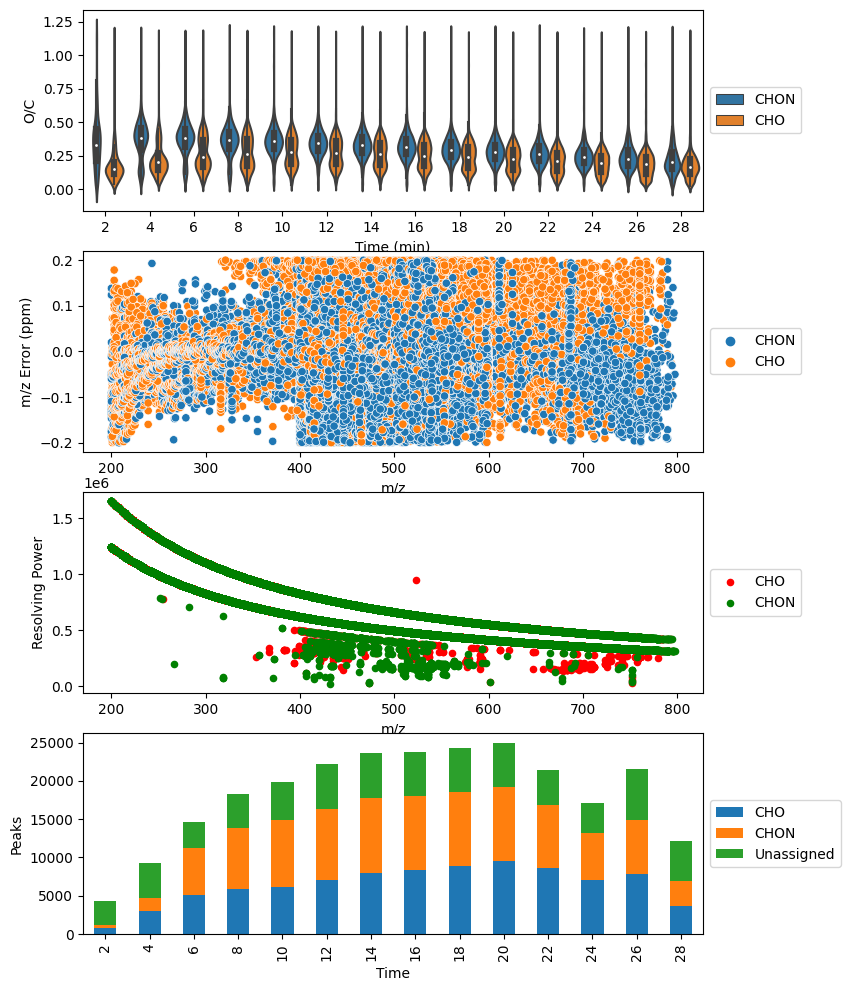

In [15]:
data.assess_all_results() ## why is it necessary to run this to get self.complete_results_df?

In [16]:
# add 'm/z window' and 'rep' columns

data_df = data.complete_results_df

data_df = add_mzwindow_col(data_df)

data_df = addRepCol(data_df)

print(data_df['m/z window'].unique())
print(data_df['Rep'].unique())
print(data_df['file'].unique())

20221103_LBA_Boiteau_Zorbax3p5_spring_fullmz_rep2.raw
20221103_LBA_Boiteau_Zorbax3p5_spring_400_500_rep2.raw
20221103_LBA_Boiteau_Zorbax3p5_spring_400_600.raw
20221103_LBA_Boiteau_Zorbax3p5_qh2o_500_600_rep2.raw
20221103_LBA_Boiteau_Zorbax3p5_spring_fullmz.raw
20221103_LBA_Boiteau_Zorbax3p5_spring_400_500.raw
20221103_LBA_Boiteau_Zorbax3p5_spring_500_600.raw
20221103_LBA_Boiteau_Zorbax3p5_qh2o_400_500_rep2.raw
20221103_LBA_Boiteau_Zorbax3p5_qh2o_400_500.raw
20221103_LBA_Boiteau_Zorbax3p5_qh2o_500_600.raw
20221103_LBA_Boiteau_Zorbax3p5_qh2o_fullmz.raw
20221103_LBA_Boiteau_Zorbax3p5_spring_400_600_rep2.raw
20221103_LBA_Boiteau_Zorbax3p5_qh2o_fullmz_rep2.raw
20221103_LBA_Boiteau_Zorbax3p5_spring_500_600_rep2.raw
[2 1]
['200-1200 m/z' '400-500 m/z' '400-600 m/z' '500-600 m/z']
[2 1]
['20221103_LBA_Boiteau_Zorbax3p5_spring_fullmz_rep2.raw'
 '20221103_LBA_Boiteau_Zorbax3p5_spring_400_500_rep2.raw'
 '20221103_LBA_Boiteau_Zorbax3p5_spring_400_600.raw'
 '20221103_LBA_Boiteau_Zorbax3p5_qh2o_500_

In [17]:
# save assignment results as pd dataframe and export as .csv 
data_df.to_csv("/Users/christiandewey/Library/CloudStorage/Box-Box/data/assignments/spring/spring-max600mz_22-11-17_Cu_S.csv")


In [18]:
#create subsets of assignments based m/z window

list100mz = []
list200mz = []
listfullzmz = [] 

for mzwindow in data_df['m/z window'].unique():

    r_df = data_df[data_df['m/z window'] == mzwindow]

    if (mzwindow == '400-600 m/z') or (mzwindow == '600-800 m/z'):
        list200mz.append(r_df)

    elif (mzwindow == '400-500 m/z') or (mzwindow == '500-600 m/z') or (mzwindow == '600-700 m/z') or (mzwindow == '700-800 m/z'):
        list100mz.append(r_df) 

    elif (mzwindow == '200-1200 m/z'):
        listfullzmz.append(r_df) 

mz100 = pd.concat(list100mz)
mz200 = pd.concat(list200mz)
mzfull = pd.concat(listfullzmz)


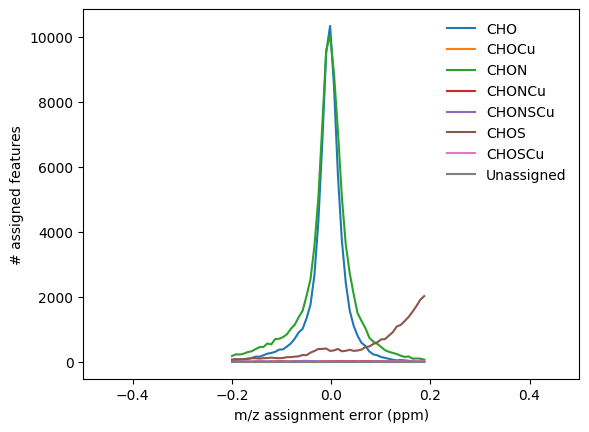

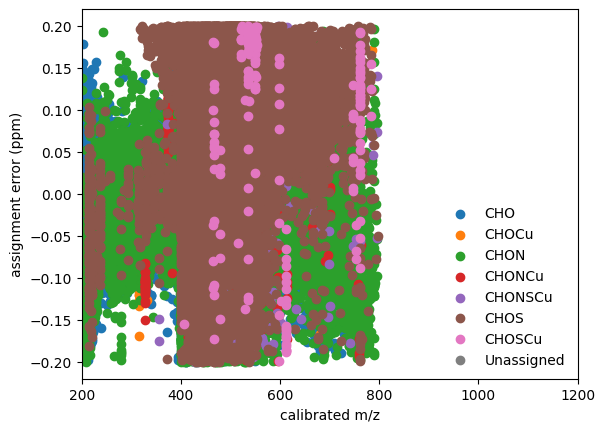

In [19]:
# plot assignment error distribution for full data set
pltMZerror(assignMolClass(data_df))

plt.show()

pltMZerror_pts(assignMolClass(data_df))

plt.show()

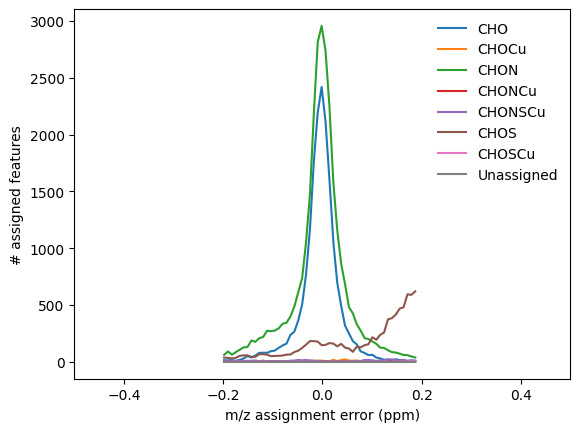

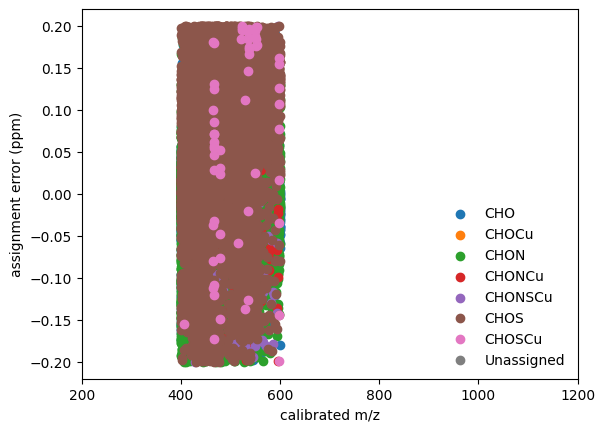

In [20]:
# plot assignment error dist for m/z 100 scans
pltMZerror(assignMolClass(mz100))

plt.show()

pltMZerror_pts(assignMolClass(mz100))

plt.show()

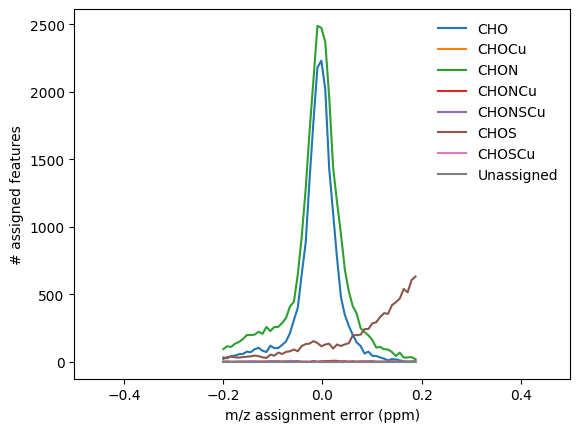

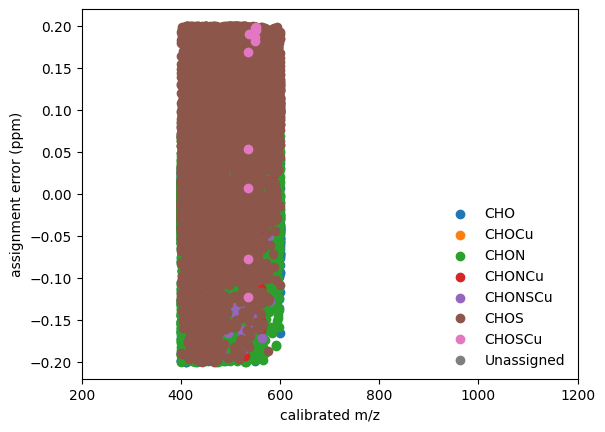

In [21]:
# plot assignment error dist for m/z 200 scans
pltMZerror(assignMolClass(mz200))

plt.show()

pltMZerror_pts(assignMolClass(mz200))

plt.show()

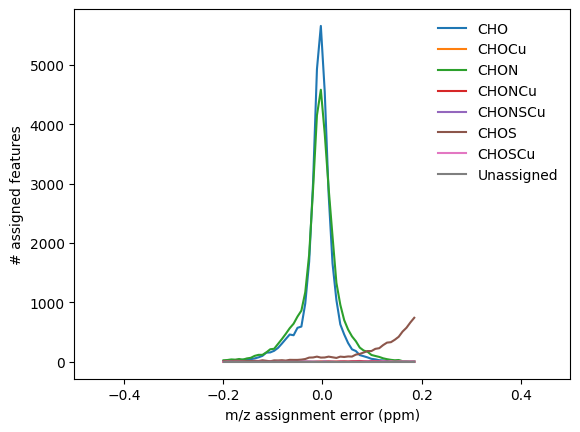

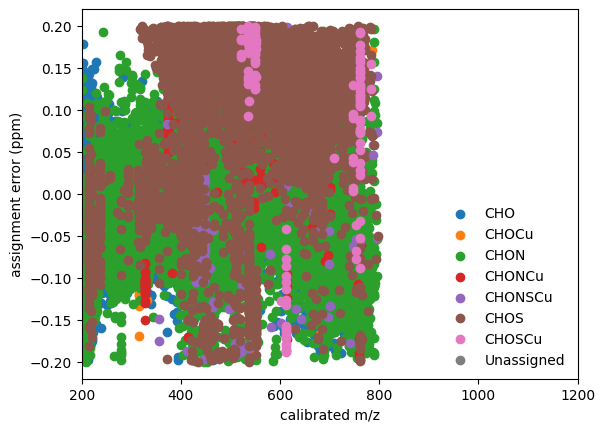

In [22]:
# plot assignment error dist for full m/z scans 
pltMZerror(assignMolClass(mzfull))

plt.show()

pltMZerror_pts(assignMolClass(mzfull))

plt.show()

In [23]:
assigned_100mz = mz100[~mz100['Molecular Formula'].isnull()]
assigned_200mz = mz200[~mz200['Molecular Formula'].isnull()]
assigned_fullmz = mzfull[~mzfull['Molecular Formula'].isnull()]

print('400-600 m/z, 100 m/z windowing: \n%s features total; %s assigned (%.1f%%)' %(np.shape(mz100)[0],  np.shape(assigned_100mz)[0], np.shape(assigned_100mz)[0] / np.shape(mz100)[0] * 100))
print('400-600 m/z, 200 m/z windowing: \n%s features total; %s assigned (%.1f%%)' %(np.shape(mz200)[0], np.shape(assigned_200mz)[0], np.shape(assigned_200mz)[0] / np.shape(mz200)[0] * 100))
print('200-800 m/z window (full scan): \n%s features total; %s assigned (%.1f%%)' %(np.shape(mzfull)[0],np.shape(assigned_fullmz)[0],  np.shape(assigned_fullmz)[0] / np.shape(mzfull)[0] * 100))

print('\n\n')

unique_100mz = getUniqueFeatures(assigned_100mz)
unique_200mz = getUniqueFeatures(assigned_200mz)
unique_fullmz = getUniqueFeatures(assigned_fullmz)


400-600 m/z, 100 m/z windowing: 
98027 features total; 64443 assigned (65.7%)
400-600 m/z, 200 m/z windowing: 
83222 features total; 62051 assigned (74.6%)
200-800 m/z window (full scan): 
123096 features total; 86557 assigned (70.3%)



total # results: 64443
# unique results: 39929
total # results: 62051
# unique results: 33724
total # results: 86557
# unique results: 45000


In [24]:
assigned_100mz_456 = assigned_100mz[(assigned_100mz['m/z']>=400)]
assigned_100mz_456 = assigned_100mz_456[(assigned_100mz_456['m/z']<=600)]

assigned_200mz_456 = assigned_200mz[(assigned_200mz['m/z']>=400)]
assigned_200mz_456 = assigned_200mz_456[(assigned_200mz_456['m/z']<=600)]

assigned_fullmz_456 = assigned_fullmz[(assigned_fullmz['m/z']>=400)]
assigned_fullmz_456 = assigned_fullmz_456[(assigned_fullmz_456['m/z']<=600)]

mz100_456 = mz100[(mz100['m/z']>=400)]
mz100_456 = mz100_456[(mz100_456['m/z']<=600)]

mz200_456 = mz200[(mz200['m/z']>=400)]
mz200_456 = mz200_456[(mz200_456['m/z']<=600)]

mzfull_456 = mzfull[(mzfull['m/z']>=400)]
mzfull_456 = mzfull_456[(mzfull_456['m/z']<=600)]

print('400-600 m/z, 100 m/z windowing: \n%s features total\n%s assigned (%.1f%%)' %(np.shape(mz100_456)[0],  np.shape(assigned_100mz_456)[0], np.shape(assigned_100mz_456)[0] / np.shape(mz100_456)[0] * 100))
print('\n400-600 m/z, 200 m/z windowing: \n%s features total\n%s assigned (%.1f%%)' %(np.shape(mz200_456)[0], np.shape(assigned_200mz_456)[0], np.shape(assigned_200mz_456)[0] / np.shape(mz200_456)[0] * 100))
print('\n400-600 m/z, full window: \n%s features total\n%s assigned (%.1f%%)' %(np.shape(mzfull_456)[0],np.shape(assigned_fullmz_456)[0],  np.shape(assigned_fullmz_456)[0] / np.shape(mzfull_456)[0] * 100))



400-600 m/z, 100 m/z windowing: 
98027 features total
64443 assigned (65.7%)

400-600 m/z, 200 m/z windowing: 
83222 features total
62051 assigned (74.6%)

400-600 m/z, full window: 
56613 features total
39919 assigned (70.5%)


In [25]:

unique_100mz_456 = getUniqueFeatures(assigned_100mz_456)
unique_200mz_456 = getUniqueFeatures(assigned_200mz_456)
unique_fullmz_456 = getUniqueFeatures(assigned_fullmz_456)

total # results: 64443
# unique results: 39929
total # results: 62051
# unique results: 33724
total # results: 39919
# unique results: 21489


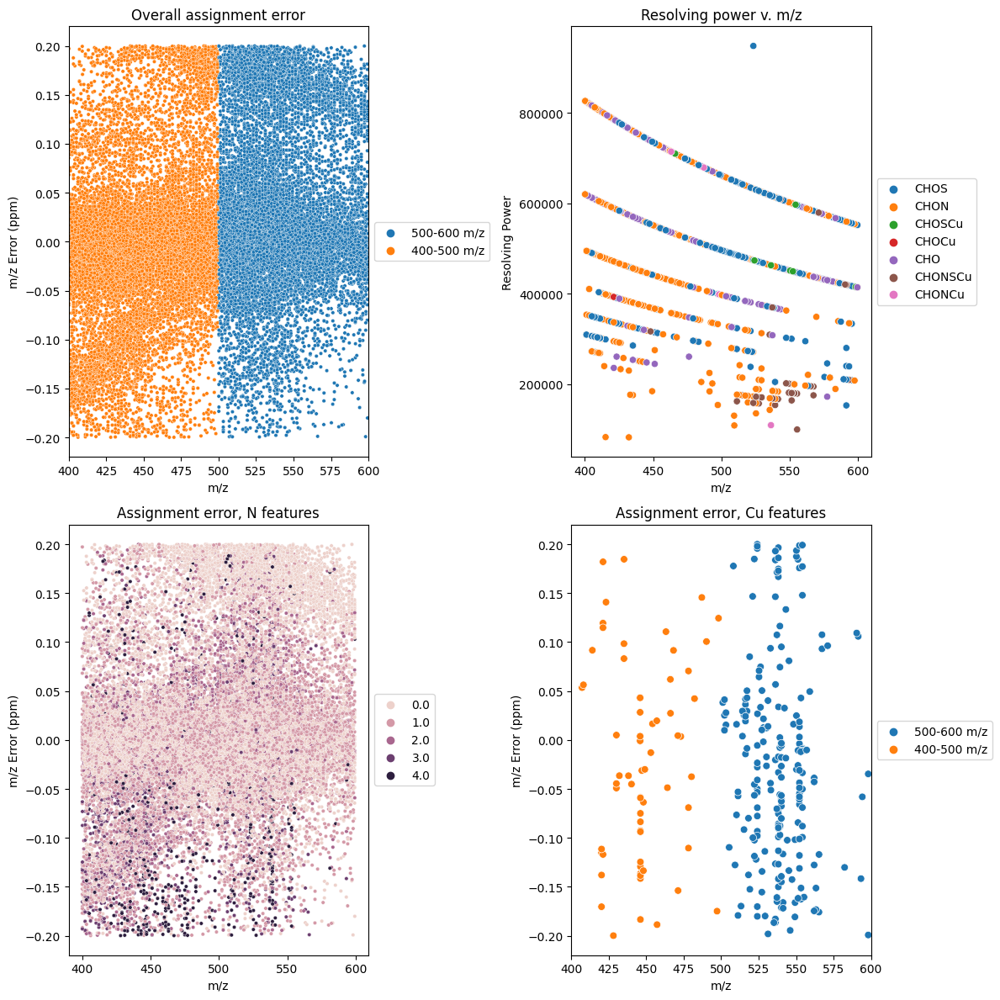

['20221103_LBA_Boiteau_Zorbax3p5_spring_500_600.raw'
 '20221103_LBA_Boiteau_Zorbax3p5_spring_400_500_rep2.raw'
 '20221103_LBA_Boiteau_Zorbax3p5_spring_400_500.raw'
 '20221103_LBA_Boiteau_Zorbax3p5_spring_500_600_rep2.raw']


In [26]:
# 100 m/z window, error plots with blanks removed 
mask = ~unique_100mz_456['file'].str.contains('qh2o', case=False, na=False)
unique_100mz_nb=unique_100mz_456[mask]
df = assignMolClass(unique_100mz_nb)

fig = plotUnique(df,ps=10)
plt.tight_layout()
plt.show()
print(unique_100mz_nb['file'].unique())

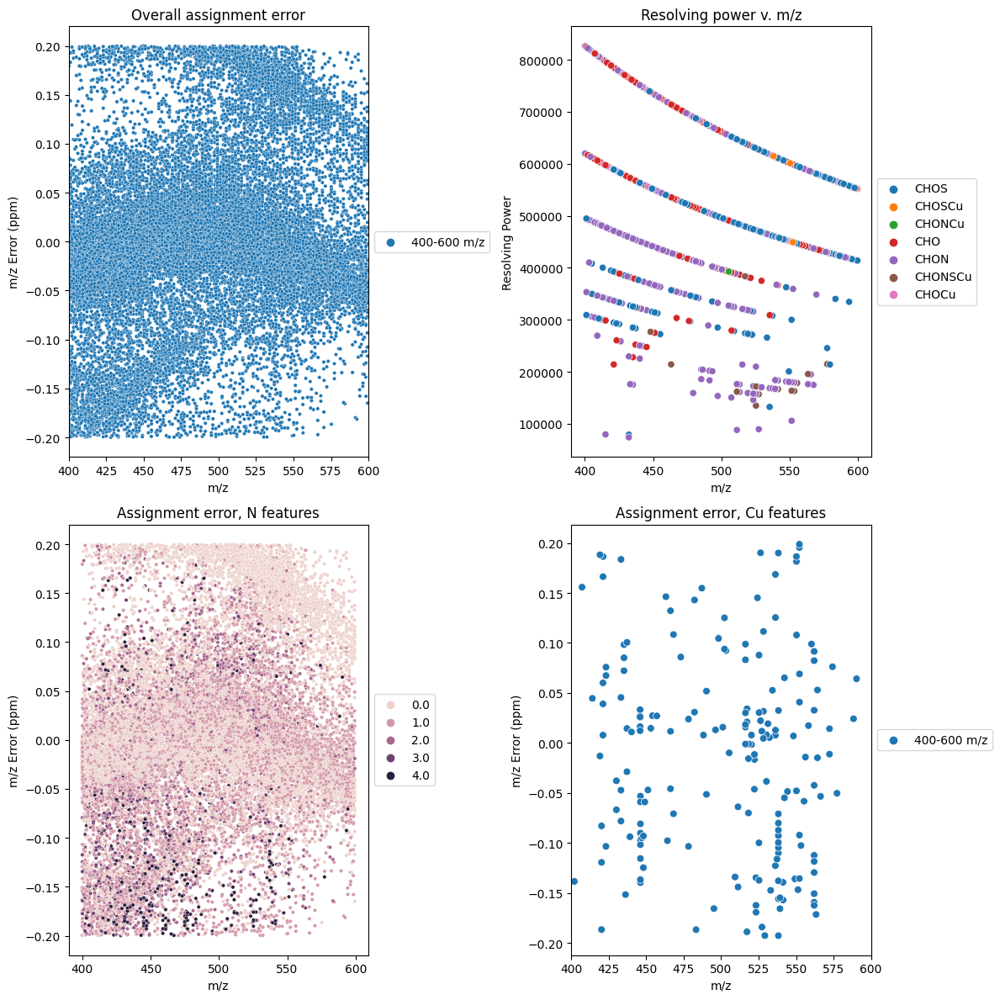

['20221103_LBA_Boiteau_Zorbax3p5_spring_400_600_rep2.raw'
 '20221103_LBA_Boiteau_Zorbax3p5_spring_400_600.raw']


In [27]:
# 200 m/z window, error plots with blanks removed 

mask = ~unique_200mz_456['file'].str.contains('qh2o', case=False, na=False)
unique_200mz_nb=unique_200mz_456[mask]


fig = plotUnique(assignMolClass(unique_200mz_nb),ps=10)
plt.tight_layout()
plt.show()
plt.close('all')

print(unique_200mz_nb['file'].unique())

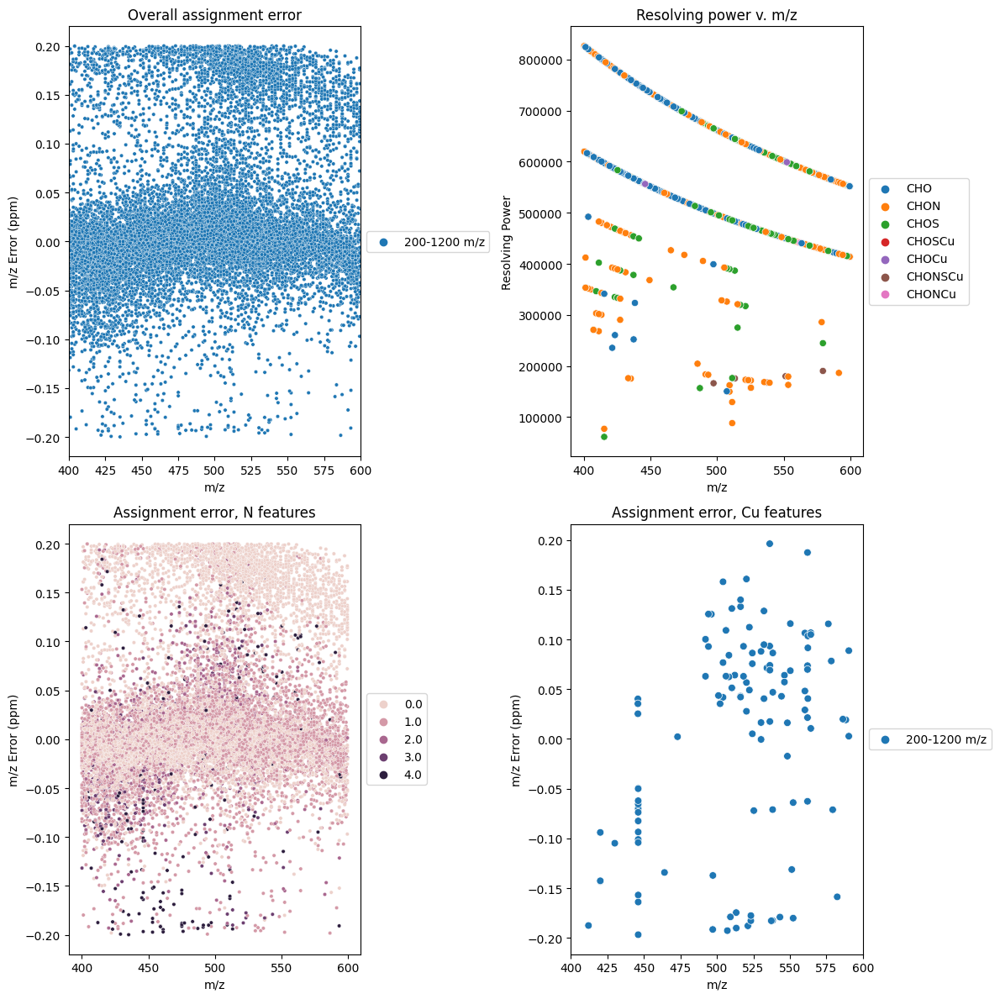

['20221103_LBA_Boiteau_Zorbax3p5_spring_fullmz.raw'
 '20221103_LBA_Boiteau_Zorbax3p5_spring_fullmz_rep2.raw']


In [28]:
# full m/z window, error plots with blanks removed 

mask = ~unique_fullmz_456['file'].str.contains('qh2o', case=False, na=False)
unique_fullmz_nb=unique_fullmz_456[mask]


fig = plotUnique(assignMolClass(unique_fullmz_nb),ps=10)
plt.tight_layout()
plt.show()
plt.close('all')

print(unique_fullmz_nb['file'].unique())

In [29]:
# create 200 m/z blank files from 100 m/z blank files (did not collect 200 m/z blank files)

blank_files = [f for f in data._raw_filelist if 'qh2o' in f]

blank_data = []

for f in blank_files:

    if 'fullmz' not in f:
        
        temp = data_df[data_df['file'] == f] 

        blank_data.append(temp)

blanks_df = pd.concat(blank_data)

rep1_temp = blanks_df[~blanks_df['file'].str.contains('rep2')]
rep1_temp = rep1_temp[rep1_temp['m/z'] <= 600]
rep1_temp['file'] = 'mz200_400_600_blnk'
rep1_temp['m/z window'] = '400-600 m/z'

blanks_df = pd.concat([blanks_df,rep1_temp])

#rep1_temp = blanks_df[~blanks_df['file'].str.contains('rep2')]
#rep1_temp = rep1_temp[rep1_temp['m/z'] >= 600]
#rep1_temp['file'] = 'mz200_600_800_blnk'
#rep1_temp['m/z window'] = '600-800 m/z'

blanks_df = pd.concat([blanks_df,rep1_temp])


rep2_temp = blanks_df[blanks_df['file'].str.contains('rep2')]
rep2_temp = rep2_temp[rep2_temp['m/z'] <= 600]
rep2_temp['file'] = 'mz200_400_600_blnk_rep2'
rep2_temp['m/z window'] = '400-600 m/z'

blanks_df = pd.concat([blanks_df,rep2_temp])

#rep2_temp = blanks_df[~blanks_df['file'].str.contains('rep2')]
#rep2_temp = rep2_temp[rep2_temp['m/z'] >= 600]
#rep2_temp['file'] = 'mz200_600_800_blnk_rep2'
#rep2_temp['m/z window'] = '600-800 m/z'

blanks_df = pd.concat([blanks_df,rep2_temp])

print(blanks_df['file'].unique())

print(blanks_df['m/z window'].unique())



['20221103_LBA_Boiteau_Zorbax3p5_qh2o_500_600_rep2.raw'
 '20221103_LBA_Boiteau_Zorbax3p5_qh2o_400_500_rep2.raw'
 '20221103_LBA_Boiteau_Zorbax3p5_qh2o_400_500.raw'
 '20221103_LBA_Boiteau_Zorbax3p5_qh2o_500_600.raw' 'mz200_400_600_blnk'
 'mz200_400_600_blnk_rep2']
['500-600 m/z' '400-500 m/z' '400-600 m/z']


In [30]:
# add 200 m/z blank data to master df

mz200_blanks = blanks_df[blanks_df['m/z window'] == '400-600 m/z']
data_df = pd.concat([data_df, mz200_blanks])

for f in data_df['file'].unique():
    print(f)




20221103_LBA_Boiteau_Zorbax3p5_spring_fullmz_rep2.raw
20221103_LBA_Boiteau_Zorbax3p5_spring_400_500_rep2.raw
20221103_LBA_Boiteau_Zorbax3p5_spring_400_600.raw
20221103_LBA_Boiteau_Zorbax3p5_qh2o_500_600_rep2.raw
20221103_LBA_Boiteau_Zorbax3p5_spring_fullmz.raw
20221103_LBA_Boiteau_Zorbax3p5_spring_400_500.raw
20221103_LBA_Boiteau_Zorbax3p5_spring_500_600.raw
20221103_LBA_Boiteau_Zorbax3p5_qh2o_400_500_rep2.raw
20221103_LBA_Boiteau_Zorbax3p5_qh2o_400_500.raw
20221103_LBA_Boiteau_Zorbax3p5_qh2o_500_600.raw
20221103_LBA_Boiteau_Zorbax3p5_qh2o_fullmz.raw
20221103_LBA_Boiteau_Zorbax3p5_spring_400_600_rep2.raw
20221103_LBA_Boiteau_Zorbax3p5_qh2o_fullmz_rep2.raw
20221103_LBA_Boiteau_Zorbax3p5_spring_500_600_rep2.raw
mz200_400_600_blnk
mz200_400_600_blnk_rep2


In [31]:
# add fullmz blanks to blanks df
blanks_df = pd.concat([blanks_df, data_df[data_df['file'] =='20221103_LBA_Boiteau_Zorbax3p5_qh2o_fullmz_rep2.raw' ]])
blanks_df = pd.concat([blanks_df, data_df[data_df['file'] =='20221103_LBA_Boiteau_Zorbax3p5_qh2o_fullmz.raw' ]])

print(blanks_df['m/z window'].unique())

['500-600 m/z' '400-500 m/z' '400-600 m/z' '200-1200 m/z']


In [32]:
# add column with blank file identity to use in blank subtraction
df_backup = data_df
df_backup.to_csv("/Users/christiandewey/Library/CloudStorage/Box-Box/data/assignments/spring/spring-max600mz_backup.csv")

data_df['blank file'] = data_df.index

for window in data_df['m/z window'].unique():

    temp1 = data_df[data_df['m/z window'] == window] # all features collected in given m/z window       
    btemp1 = blanks_df[blanks_df['m/z window'] == window] # all blank feautres collected in same m/z window

    for r in temp1['Rep'].unique():
        temp2 = temp1[temp1['Rep'] == r]
        btemp2 = btemp1[btemp1['Rep'] == r]


        temp2['blank file'] = btemp2['file'].iloc[0]

        data_df[(data_df['m/z window'] == window) & (data_df['Rep'] == r)]  = temp2


print(data_df['blank file'].unique())

['20221103_LBA_Boiteau_Zorbax3p5_qh2o_fullmz_rep2.raw'
 '20221103_LBA_Boiteau_Zorbax3p5_qh2o_400_500_rep2.raw'
 'mz200_400_600_blnk'
 '20221103_LBA_Boiteau_Zorbax3p5_qh2o_500_600_rep2.raw'
 '20221103_LBA_Boiteau_Zorbax3p5_qh2o_fullmz.raw'
 '20221103_LBA_Boiteau_Zorbax3p5_qh2o_400_500.raw'
 '20221103_LBA_Boiteau_Zorbax3p5_qh2o_500_600.raw'
 'mz200_400_600_blnk_rep2']


In [33]:
def blankSubtract(df, blnkthresh = 0.9):
    
    holder = []
    for file in df['file'].unique():
        
        #if file == 
        sub = df[df['file'] == file]

        blkf = sub['blank file'].iloc[0]


        sub[sub[file]== np.nan] = 0

        nom = sub[file]
        den = sub[blkf]

        nom = nom.replace(np.nan,0)
        den = den.replace(np.nan,1)

        if file != blkf:
            nom = nom
        elif file == blkf:
            nom = nom * (blnkthresh*0.8)

        sub['blank subtract'] = nom/den
        holder.append(sub)
    df_end = pd.concat(holder)
    df_end = df_end[df_end['blank subtract'] > blnkthresh]
    return df_end

In [34]:
df_unique = getUniqueFeatures(data_df)


total # results: 344929
# unique results: 66279


In [35]:


df_bs = blankSubtract(df_unique, blnkthresh=0.3)


(42096, 55)


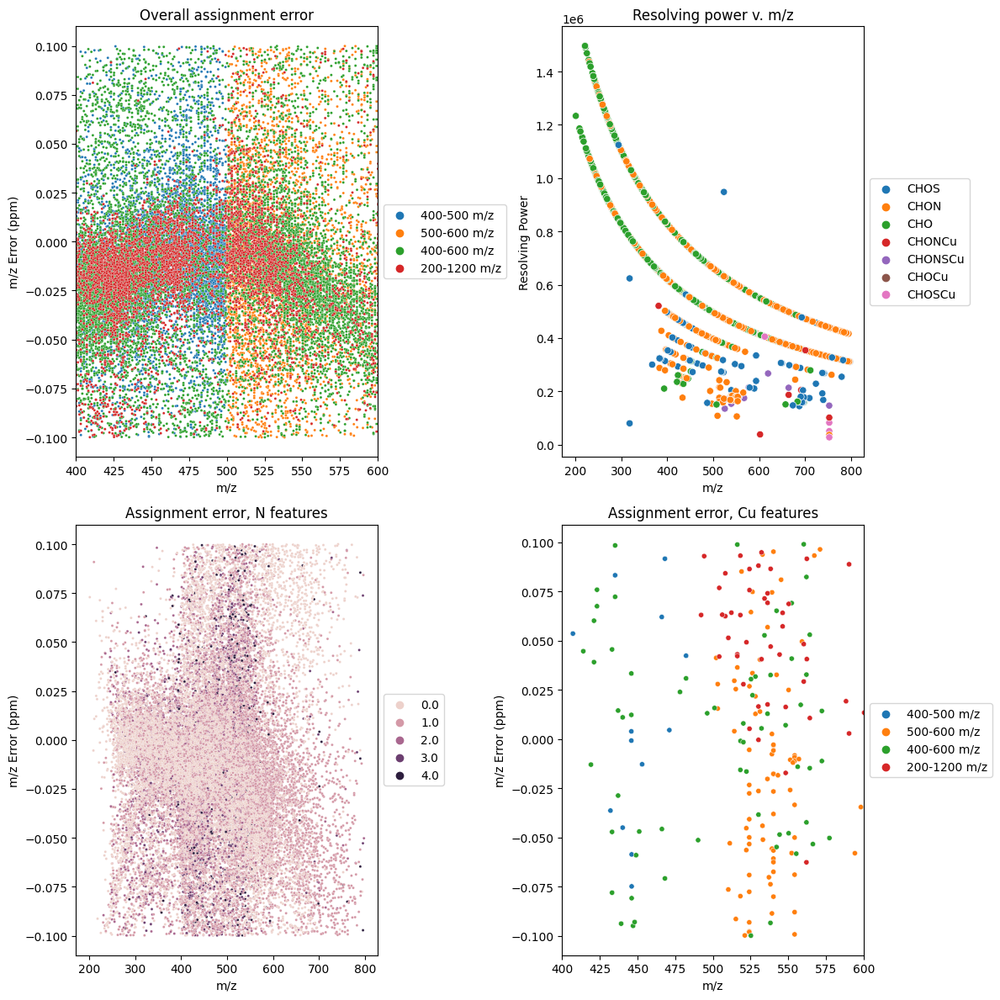

In [37]:
temp = df_bs[abs(df_bs['m/z Error (ppm)'])<0.1]
print(np.shape(temp))
fig = plotUnique(assignMolClass(pd.concat([temp[temp['m/z window']== '400-500 m/z'], temp[temp['m/z window']=='500-600 m/z'], temp[temp['m/z window']=='400-600 m/z'], temp[temp['m/z window']=='200-1200 m/z']])),ps=5)

plt.tight_layout()
plt.show()
plt.close('all')

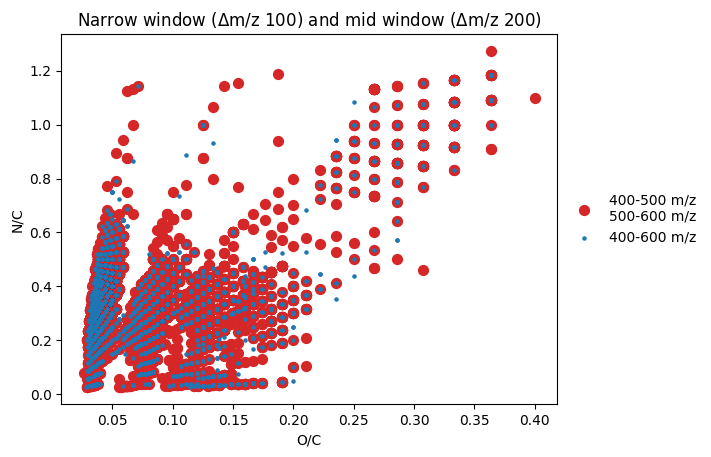

In [38]:
mz100_bs = df_bs[(df_bs['m/z window'] == '400-500 m/z') | (df_bs['m/z window'] == '500-600 m/z')]

mz200_bs = df_bs[(df_bs['m/z window'] == '400-600 m/z')]

mzfull_bs = df_bs[(df_bs['m/z window'] == '200-1200 m/z')]
mzfull_bs = mzfull_bs[(mzfull_bs['m/z']>=400) & (mzfull_bs['m/z']<= 600)]

df = mz100_bs
df2 = mz200_bs
df3 = mzfull_bs
fig, ax = plt.subplots()
ax.scatter(x=df['N/C'],y=df['O/C'],c='C3',s=50,label='400-500 m/z\n500-600 m/z')#,s=df['S/N']
#sns.scatterplot(x='N/C',y='O/C', hue='m/z', data=df, ax=ax,s=50)
ax.scatter(x=df2['N/C'],y=df2['O/C'],c='C0',s=5,label='400-600 m/z') #s=df2['S/N'],
#ax.scatter(x=df3['N/C'],y=df3['O/C'],c='C5',label='200-1200 m/z') #s=df3['S/N']
ax.set(xlabel='O/C',ylabel='N/C')
#ax.set_xlim(0,1.2)
#ax.set_ylim(0,0.5)
ax.legend(frameon=False, bbox_to_anchor=(1.0,0.5), loc='center left')
plt.title(r'Narrow window ($\Delta$m/z 100) and mid window ($\Delta$m/z 200)')
plt.show()


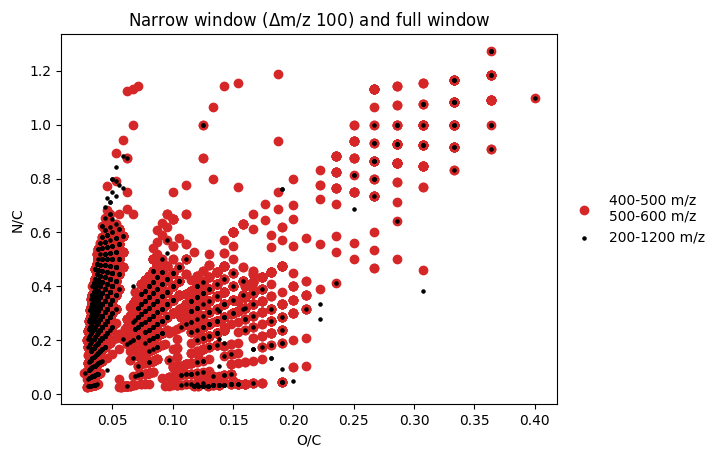

In [39]:
mz100_bs = df_bs[(df_bs['m/z window'] == '400-500 m/z') | (df_bs['m/z window'] == '500-600 m/z')]

mz200_bs = df_bs[(df_bs['m/z window'] == '400-600 m/z')]

mzfull_bs = df_bs[(df_bs['m/z window'] == '200-1200 m/z')]
mzfull_bs = mzfull_bs[(mzfull_bs['m/z']>=400) & (mzfull_bs['m/z']<= 600)]

df = mz100_bs
df2 = mz200_bs
df3 = mzfull_bs
fig, ax = plt.subplots()
ax.scatter(x=df['N/C'],y=df['O/C'],c='C3',label='400-500 m/z\n500-600 m/z')#,s=df['S/N']
#ax.scatter(x=df2['N/C'],y=df2['O/C'],c='black',s=5,label='400-600 m/z') #s=df2['S/N'],
ax.scatter(x=df3['N/C'],y=df3['O/C'],c='black',s=5,label='200-1200 m/z') #s=df3['S/N']
ax.set(xlabel='O/C',ylabel='N/C')
#ax.set_xlim(0,1.2)
#ax.set_ylim(0,0.5)
ax.legend(frameon=False, bbox_to_anchor=(1.0,0.5), loc='center left')
plt.title(r'Narrow window ($\Delta$m/z 100) and full window')
plt.show()


In [40]:
mz100_contains_cu = mz100_bs[mz100_bs['Cu'] == 1]
print(np.shape(mz100_contains_cu))
mz200_contains_cu = mz200_bs[mz200_bs['Cu'] == 1]
print(np.shape(mz200_contains_cu))
mzfull_contains_cu = mzfull_bs[mzfull_bs['Cu'] == 1]
print(np.shape(mzfull_contains_cu))

(319, 55)
(254, 55)
(137, 55)


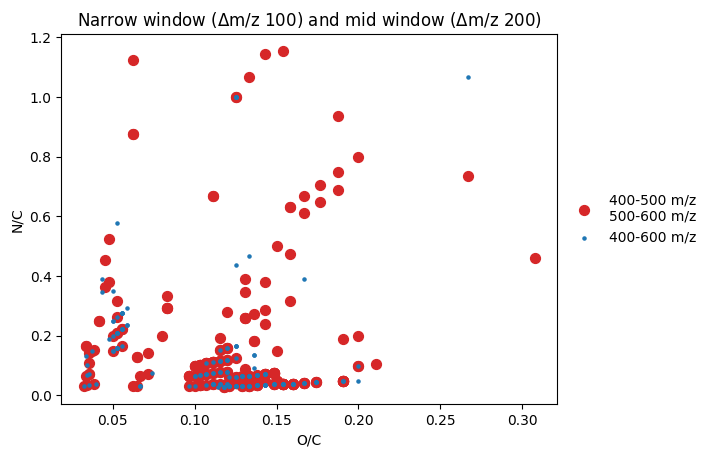

In [41]:
mz100_bs = df_bs[(df_bs['m/z window'] == '400-500 m/z') | (df_bs['m/z window'] == '500-600 m/z')]

mz200_bs = df_bs[(df_bs['m/z window'] == '400-600 m/z')]

mzfull_bs = df_bs[(df_bs['m/z window'] == '200-1200 m/z')]
mzfull_bs = mzfull_bs[(mzfull_bs['m/z']>=400) & (mzfull_bs['m/z']<= 600)]

df = mz100_bs[mz100_bs['Cu'] == 1]
df2 = mz200_bs[mz200_bs['Cu'] == 1]
fig, ax = plt.subplots()
ax.scatter(x=df['N/C'],y=df['O/C'],c='C3',s=50,label='400-500 m/z\n500-600 m/z')#,s=df['S/N']
ax.scatter(x=df2['N/C'],y=df2['O/C'],c='C0',s=5,label='400-600 m/z') #s=df2['S/N'],
#ax.scatter(x=df3['N/C'],y=df3['O/C'],c='C5',label='200-1200 m/z') #s=df3['S/N']
ax.set(xlabel='O/C',ylabel='N/C')
#ax.set_xlim(0,1.2)
#ax.set_ylim(0,0.5)
ax.legend(frameon=False, bbox_to_anchor=(1.0,0.5), loc='center left')
plt.title(r'Narrow window ($\Delta$m/z 100) and mid window ($\Delta$m/z 200)')
plt.show()


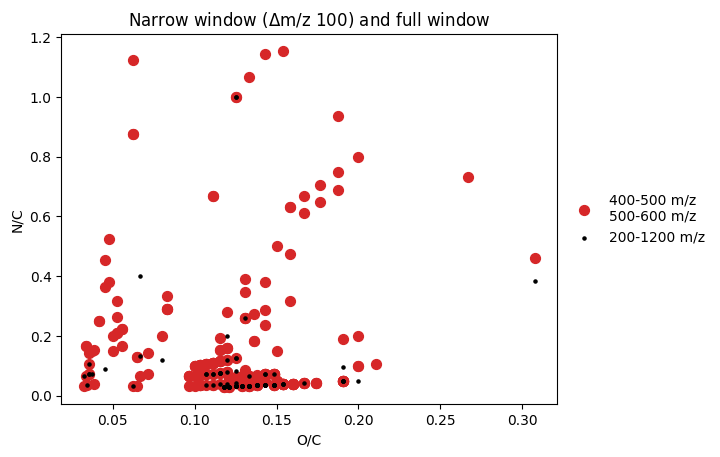

In [42]:
mz100_bs = df_bs[(df_bs['m/z window'] == '400-500 m/z') | (df_bs['m/z window'] == '500-600 m/z')]

mz200_bs = df_bs[(df_bs['m/z window'] == '400-600 m/z')]

mzfull_bs = df_bs[(df_bs['m/z window'] == '200-1200 m/z')]
mzfull_bs = mzfull_bs[(mzfull_bs['m/z']>=400) & (mzfull_bs['m/z']<= 600)]

df = mz100_bs[mz100_bs['Cu'] == 1]
df2 = mzfull_bs[mzfull_bs['Cu'] == 1]
fig, ax = plt.subplots()
ax.scatter(x=df['N/C'],y=df['O/C'],c='C3',s=50,label='400-500 m/z\n500-600 m/z')#,s=df['S/N']
ax.scatter(x=df2['N/C'],y=df2['O/C'],c='black',s=5,label='200-1200 m/z') #s=df2['S/N'],
#ax.scatter(x=df3['N/C'],y=df3['O/C'],c='C5',label='200-1200 m/z') #s=df3['S/N']
ax.set(xlabel='O/C',ylabel='N/C')
#ax.set_xlim(0,1.2)
#ax.set_ylim(0,0.5)
ax.legend(frameon=False, bbox_to_anchor=(1.0,0.5), loc='center left')
plt.title(r'Narrow window ($\Delta$m/z 100) and full window')
plt.show()

In [44]:
#data.master_data_holder['20221103_LBA_Boiteau_Zorbax3p5_spring_400_500_rep2.raw'] #[file]={'parser': parser}
mz100_cu_limited_err = mz100_contains_cu[abs(mz100_contains_cu['m/z Error (ppm)']) < 0.1]
mz100_EICdic = {}
for mz,file,mf in zip(mz100_cu_limited_err['m/z'],mz100_cu_limited_err['file'],mz100_cu_limited_err['Molecular Formula']):
    
    parser = data.master_data_holder[file]['parser']    
 
    EIC=parser.get_eics(target_mzs=[mz],tic_data={},peak_detection=False,smooth=False)
    mz100_EICdic[mf]=EIC[0][mz]
    #mz100_EICdic[mz]={'eic':EIC[0][mz],'formula':mf}



In [45]:
#data.master_data_holder['20221103_LBA_Boiteau_Zorbax3p5_spring_400_500_rep2.raw'] #[file]={'parser': parser}

mzfull_cu_limited_err = mzfull_contains_cu[abs(mzfull_contains_cu['m/z Error (ppm)']) < 0.1]
fullmz_EICdic = {}
for mz,file,mf in zip(mzfull_cu_limited_err['m/z'],mzfull_cu_limited_err['file'],mzfull_cu_limited_err['Molecular Formula']):
    
    parser = data.master_data_holder[file]['parser']
 
    EIC=parser.get_eics(target_mzs=[mz],tic_data={},peak_detection=False,smooth=False)
    fullmz_EICdic[mf]=EIC[0][mz]


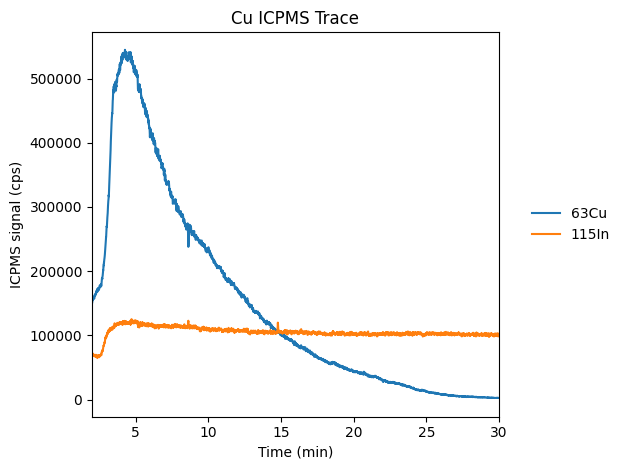

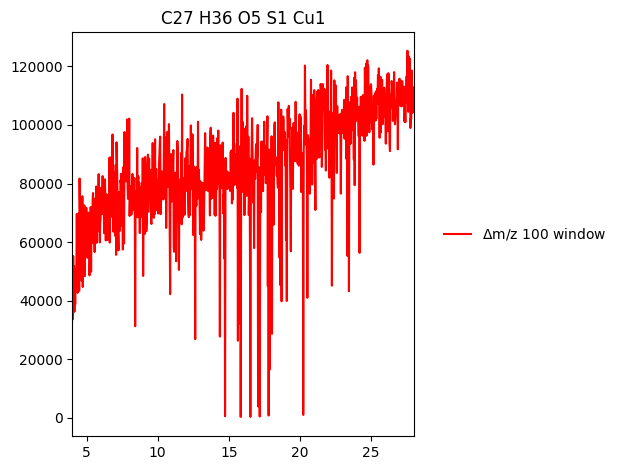

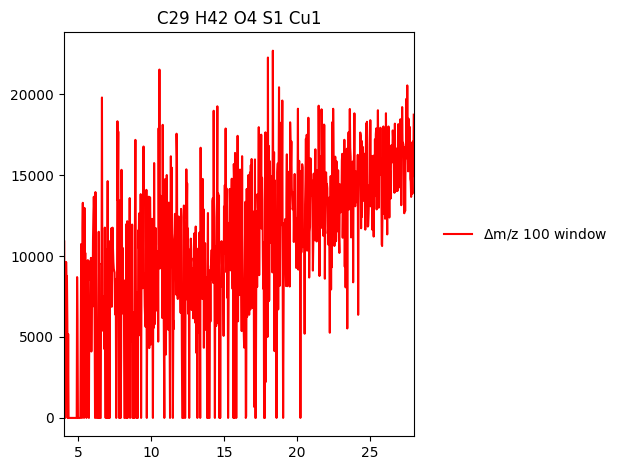

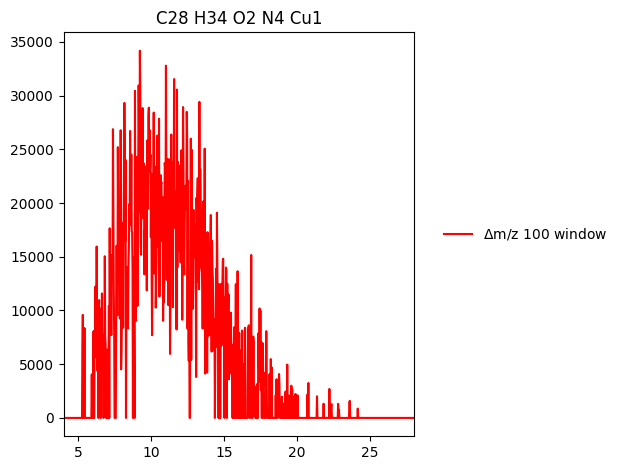

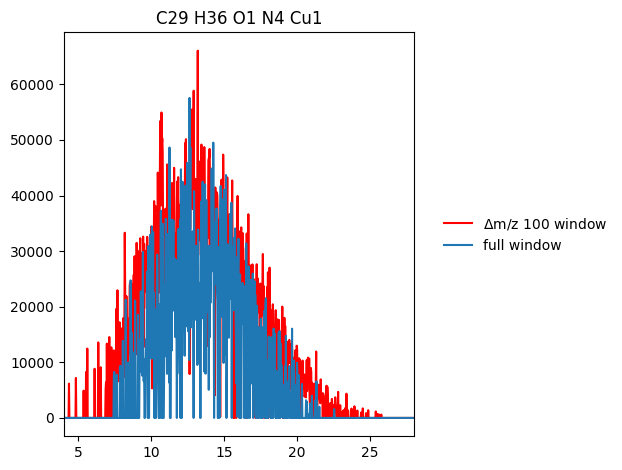

...

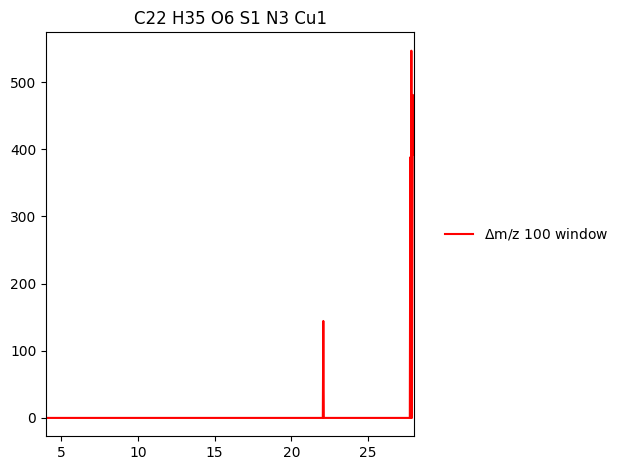

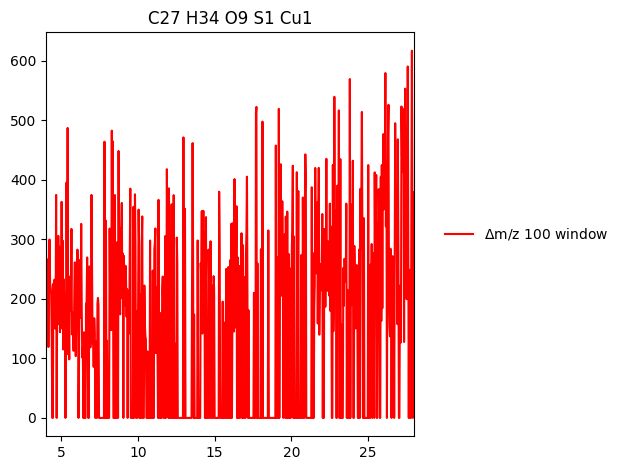

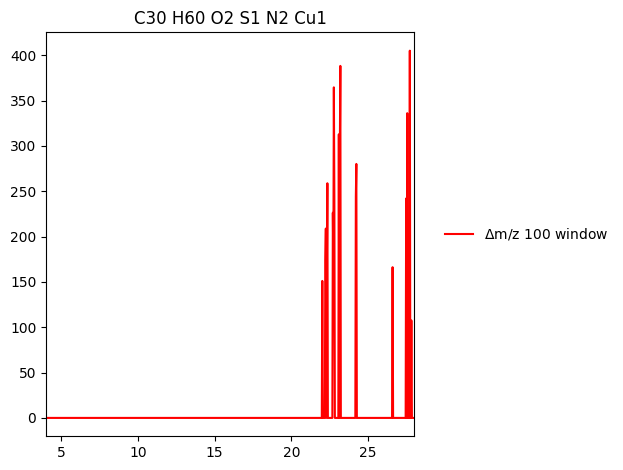

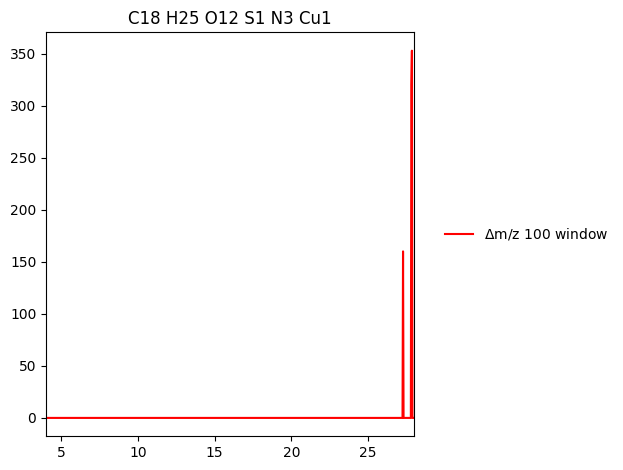

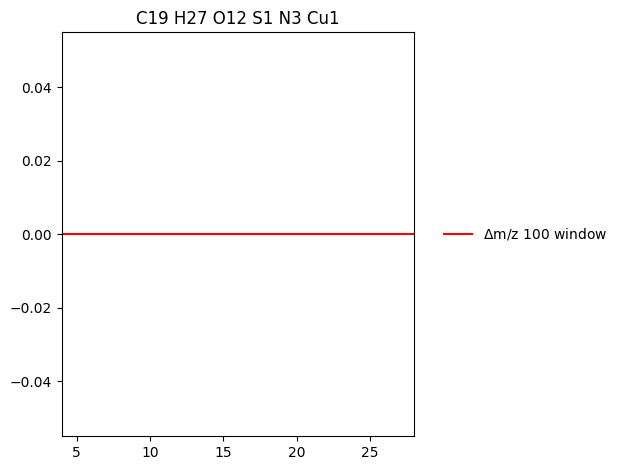

In [47]:
from matplotlib.backends.backend_pdf import PdfPages

icpms_file = '/Users/christiandewey/Library/CloudStorage/Box-Box/Boiteau Lab/Mass Spec Data/Keck iCAP Q/2022/2022-09/Tillamook, Sept 2022/spring_ENV.csv'
icpms = pd.read_csv(icpms_file, sep=';',header=1)


metals = ['63Cu', '115In']

pdf = PdfPages('/Users/christiandewey/Library/CloudStorage/Box-Box/data/assignments/spring/eics_cu_s_100mz_fullmz.pdf')

fig, ax = plt.subplots()

maxicp = 0 
for me in metals:
    me_key = 'Time %s' %me
    ax.plot(icpms[me_key]/60, icpms[me], label=me)        
    



#ax.set_ylim(0,maxicp*1.1)
ax.set_title('Cu ICPMS Trace')
ax.set_xlabel('Time (min)')
ax.set_ylabel('ICPMS signal (cps)')
ax.legend(bbox_to_anchor=(1.05,0.5),loc='center left',frameon =False)
ax.set_xlim(2,30)
fig.tight_layout()
pdf.savefig()

for mf in mz100_EICdic:   

    fig, ax = plt.subplots()
    
    eict=mz100_EICdic[mf].time
    eics=mz100_EICdic[mf].eic

    inds = np.where(np.asarray(eict)<28)

    eict = np.asarray(eict)[inds]
    eics = np.asarray(eics)[inds]

    ax.plot(eict, eics,color = 'red', label=r'$\Delta$m/z 100 window')

    if mf in fullmz_EICdic:
        eic2t = fullmz_EICdic[mf].time
        eic2s = fullmz_EICdic[mf].eic

        eic2t = np.asarray(eic2t)[inds]
        eic2s = np.asarray(eic2s)[inds]
        ax.plot(eic2t,eic2s, color ='C0', label = 'full window')
    ax.set_xlim(4,28)
    ax.set_title(mf)
    ax.legend(frameon = False,bbox_to_anchor=(1.05,0.5),loc='center left')
    fig.tight_layout()
    pdf.savefig()

pdf.close()

In [150]:
inds = np.where(np.asarray(mz100_EICdic[mf].time)<28)

np.asarray(mz100_EICdic[mf].time)[inds]

array([5.17500000e-03, 1.57000000e-02, 5.18683333e-02, 8.80150000e-02,
       1.24130000e-01, 1.60268333e-01, 1.96418333e-01, 2.32550000e-01,
       2.68705000e-01, 3.04830000e-01, 3.40980000e-01, 3.77120000e-01,
       4.13255000e-01, 4.49393333e-01, 4.85538333e-01, 5.21685000e-01,
       5.57823333e-01, 5.93956667e-01, 6.30096667e-01, 6.66235000e-01,
       7.02375000e-01, 7.38525000e-01, 7.74665000e-01, 8.10800000e-01,
       8.46935000e-01, 8.83078333e-01, 9.19225000e-01, 9.55358333e-01,
       9.91496667e-01, 1.02764833e+00, 1.06377667e+00, 1.09992500e+00,
       1.13605667e+00, 1.17219667e+00, 1.20833833e+00, 1.24448667e+00,
       1.28063667e+00, 1.31676000e+00, 1.35290333e+00, 1.38904167e+00,
       1.42518667e+00, 1.46133167e+00, 1.49747000e+00, 1.53361833e+00,
       1.56974667e+00, 1.60503833e+00, 1.64118833e+00, 1.67733167e+00,
       1.71346167e+00, 1.74960333e+00, 1.78546833e+00, 1.82161833e+00,
       1.85759833e+00, 1.89238000e+00, 1.92852000e+00, 1.96389667e+00,
      

In [45]:

def getParser(file):
    parser = rawFileReader.ImportMassSpectraThermoMSFileReader(file)
    return parser

def assign_formula(parser, interval, timerange, refmasslist=None):
    #Function to build formula assignment lists
    #Retrieve TIC for MS1 scans over the time range between 'timestart' and 'timestop' 

    tic=parser.get_tic(ms_type='MS')[0]
    tic_df=pd.DataFrame({'time': tic.time,'scan': tic.scans})

    times=list(range(timerange[0],timerange[1],interval))

    results=[]
    
    for timestart in times:

        scans=tic_df[tic_df.time.between(timestart,timestart+interval)].scan.tolist()

        mass_spectrum = parser.get_average_mass_spectrum_by_scanlist(scans)    
        mass_spectrum.molecular_search_settings.ion_charge = 1

        #mass_spectrum.mass_spectrum.settings.calib_sn_threshold
        #mass_spectrum.mass_spectrum.settings.calib_pol_order
        #mass_spectrum.recalibrate_mass_spectrum(mass_spectrum, imzmeas, mzrefs, order=2)
        #MzDomainCalibration(mass_spectrum, ref_file_location).run()

        if refmasslist:
            mass_spectrum.settings.min_calib_ppm_error = 10
            mass_spectrum.settings.max_calib_ppm_error = -10
            calfn = MzDomainCalibration(mass_spectrum, refmasslist)
            ref_mass_list_fmt = calfn.load_ref_mass_list(refmasslist)

            imzmeas, mzrefs = calfn.find_calibration_points(mass_spectrum, ref_mass_list_fmt,
                                                        calib_ppm_error_threshold=(0, 2.0),
                                                        calib_snr_threshold=3)

            calfn.recalibrate_mass_spectrum(mass_spectrum, imzmeas, mzrefs, order=2)


        SearchMolecularFormulas(mass_spectrum, first_hit=False).run_worker_mass_spectrum()

        mass_spectrum.percentile_assigned(report_error=True)

        assignments=mass_spectrum.to_dataframe()

        assignments['Time']=timestart

        results.append(assignments)
    
    results=pd.concat(results,ignore_index=True)

    return(results)    

def plot_ms(df1, start_mz, end_mz, tstart, df2=None,df3=None, assignment= None, ax_ms=None, lbls=None, norm=False, labs=False, colors=None):   
    if ax_ms == None:
        f, ax = plt.subplots()
    
    else:
        ax = ax_ms

    if colors is not None:
        cols = colors
    else:
        cols = ['C0', 'C1', 'C2']
    mzrange= end_mz - start_mz
    ms_t_int=df1[df1['Time'] == tstart]
    ms_df = ms_t_int[((ms_t_int['Calibrated m/z']-start_mz)<mzrange) & ((ms_t_int['Calibrated m/z']-start_mz)>0)]

    maxdf1 = max(ms_df['S/N'])

    if norm:
        ms_df['S/N Norm'] = ms_df['S/N'] / maxdf1
    else:
        ms_df['S/N Norm'] = ms_df['S/N'] 

    

    print(ms_df['S/N Norm'])

    if lbls is not None:
        labels = lbls
    else:
        lbls = [None, None, None]

 
    _, stemlines1, _ =ax.stem('Calibrated m/z','S/N Norm',data=ms_df,  markerfmt=' ', basefmt=' ', linefmt=cols[0], label = labels[0])
    
    if df2 is not None:
        ms_t_int2=df2[df2['Time'] == tstart]
        ms_df2 = ms_t_int2[(abs(ms_t_int2['Calibrated m/z']-start_mz)<mzrange)& ((ms_t_int2['Calibrated m/z']-start_mz)>0)]

        maxdf2 = max(ms_df2['S/N'])

        if norm:
            ms_df2['S/N Norm'] = ms_df2['S/N'] / maxdf2
        else:
            ms_df2['S/N Norm'] = ms_df2['S/N'] 
        
        _, stemlines2, _ =ax.stem('Calibrated m/z','S/N Norm',data=ms_df2,  markerfmt=' ', basefmt=' ', linefmt=cols[1], label = labels[1])

    if df3 is not None:
        ms_t_int3=df3[df3['Time'] == tstart]
        ms_df3 = ms_t_int3[(abs(ms_t_int3['Calibrated m/z']-start_mz)<mzrange)& ((ms_t_int3['Calibrated m/z']-start_mz)>0)]

        maxdf3 = max(ms_df3['S/N'])

        if norm:
            ms_df3['S/N Norm'] = ms_df3['S/N'] / maxdf3
        else:
            ms_df3['S/N Norm'] = ms_df3['S/N'] 
        
        _, stemlines3, _ =ax.stem('Calibrated m/z','S/N Norm',data=ms_df3,  markerfmt=' ', basefmt=' ', linefmt=cols[2], label = labels[2])
    
    if df3 is not None:
        ax.set_ylim(0, max([maxdf1, maxdf2, maxdf3]) * 1.1)
    elif df2 is not None:
        ax.set_ylim(0, max([maxdf1, maxdf2]) * 1.1)
    else: 
        ax.set_ylim(0, maxdf1 * 1.1)

    ax.set_xlim(left = start_mz - mzrange*0.1, right = start_mz + mzrange + mzrange*0.1) 

    if labs:
        for mzr,peakr,mf,er in zip(ms_df['Calibrated m/z'], ms_df['S/N Norm'], ms_df['Molecular Formula'],  ms_df['m/z Error (ppm)']):

            #if (mzr- target_mz)  == 0:
            #    mz_text = ' m/z\n%.4f' % (mzr)
            #else:
            #    mz_text = r'$\Delta$' + ' m/z\n%.4f' % (mzr- target_mz)

            mz_text = 'm/z %.4f\n%s\n%.3f ppm' % (mzr,mf,er)
            ax.text(mzr, peakr + 0.02 *max(ms_df['S/N Norm']), mz_text, ha = 'center', fontsize = 'xx-small', weight = 'bold', color=cols[0])

        if df2 is not None:

            for mzr,peakr,mf, er in zip(ms_df2['Calibrated m/z'], ms_df2['S/N Norm'], ms_df2['Molecular Formula'], ms_df2['m/z Error (ppm)']):

            #if (mzr- target_mz)  == 0:
            #    mz_text = ' m/z\n%.4f' % (mzr)
            #else:
            #    mz_text = r'$\Delta$' + ' m/z\n%.4f' % (mzr- target_mz)

                mz_text = 'm/z %.4f\n%s\n%.3f ppm' % (mzr,mf,er)
                ax.text(mzr, peakr + 0.02 *max(ms_df2['S/N Norm']), mz_text, ha = 'center', fontsize = 'xx-small', weight = 'bold', color = cols[1])

        if df3 is not None:

            for mzr,peakr,mf, er in zip(ms_df3['Calibrated m/z'], ms_df3['S/N Norm'], ms_df3['Molecular Formula'], ms_df3['m/z Error (ppm)']):

            #if (mzr- target_mz)  == 0:
            #    mz_text = ' m/z\n%.4f' % (mzr)
            #else:
            #    mz_text = r'$\Delta$' + ' m/z\n%.4f' % (mzr- target_mz)

                mz_text = 'm/z %.4f\n%s\n%.3f ppm' % (mzr,mf,er)
                ax.text(mzr, peakr + 0.02 *max(ms_df3['S/N Norm']), mz_text, ha = 'center', fontsize = 'xx-small', weight = 'bold', color = cols[2])

   # theor_mz=pattern.mdiff+result['mass']
   # theor_int=pattern.ratio*result['abundance']
   # ax.stem(theor_mz,theor_int, basefmt=' ',linefmt='gray')

   # for isotope in pattern.isotope[pattern.requirement=='Y']:
   #     ax.stem('mz','intense',data=result[isotope],  markerfmt=' ', basefmt=' ',linefmt='red')
    if ax == None:

        ax.legend(('other', 'target'),bbox_to_anchor=(1.05, 1.0), loc='upper left',frameon=False)

        if(assignment):

            mf = assignment[0]
            score = assignment[1]
            er = assignment[2]

            ax.text(1.05,0.7,mf,transform=ax.transAxes)
            ax.text(1.05,0.6,'Error (ppm) = %.3f ' %er ,transform=ax.transAxes)
            ax.text(1.05,0.5,'Score = %.3f' %score ,transform=ax.transAxes)

    if norm: 
        ax.set(xlabel='Calibrated m/z',ylabel='Normalized S/N')
    else: 
        ax.set(xlabel='Calibrated m/z',ylabel='S/N')
    #ax.set_title('%.2f' %timerange[0] + ' to %.2f' %timerange[1] +' min', fontsize = 'medium')
    ax.legend(bbox_to_anchor = (1.00, 0.5), frameon =False, loc = 'center left')
    ax.axhline(y=0.0, color='black')
    plt.setp(stemlines1,'color', cols[0], 'linewidth', 2)
    if df2 is not None:
        plt.setp(stemlines2, 'color', cols[1],'linewidth', 2)
    if df3 is not None:
        plt.setp(stemlines3, 'color', cols[2],'linewidth', 2)
    plt.tight_layout()
    if ax_ms == None:
        return ax


def filterMzRange(results, mz_range):

    mz_i = mz_range[0]
    mz_f = mz_range[1]

    sub = results[(results['m/z'] >= mz_i) & (results['m/z'] <= mz_f)]

    return sub


def pltMZerror(results, bins=50):
    ## assignment error distribution
    _, ax = plt.subplots()
    for mol_class in sorted(results['mol_class'].unique()):

        counts, bins = np.histogram(np.asarray(results[results['mol_class']==mol_class]['m/z Error (ppm)']),bins = bins)

        ax.plot(bins[:-1], counts, label = mol_class)

    ax.set_xlim(-0.5,0.5)
    ax.legend(frameon=False)
    ax.set_xlabel('m/z assignment error (ppm)')
    ax.set_ylabel('# assigned features')

    return ax

def pltMZerror_pts(results):
    ## assignment error distribution
    _, ax = plt.subplots()
    for mol_class in sorted(results['mol_class'].unique()):

        ax.scatter(results[results['mol_class']==mol_class]['Calibrated m/z'], results[results['mol_class']==mol_class]['m/z Error (ppm)'], label = mol_class)

    #ax.set_xlim(-0.5,0.5)
    ax.legend(frameon=False,bbox_to_anchor=(1.0, 0.5))
    ax.set_xlabel('calibrated m/z')
    ax.set_ylabel('assignment error (ppm)')

    return ax

def assignMolClass(resultsdf, mz_cutoff = 800, sn_lim = 3):

    filtered_results=resultsdf[(resultsdf['m/z']<mz_cutoff) & (resultsdf['S/N']>sn_lim)]

    filtered_results['N']=filtered_results['N'].fillna(0)
    filtered_results['O']=filtered_results['O'].fillna(0)
    #filtered_results['S']=filtered_results['S'].fillna(0)
    #filtered_results['P']=filtered_results['Fe'].fillna(0)
    filtered_results['Cu']=filtered_results['Cu'].fillna(0)

    filtered_results['mol_class']='Unassigned'
    filtered_results['mol_class'][filtered_results['C']>0]='CHO'
    filtered_results['mol_class'][(filtered_results['C']>0) & (filtered_results['N']>0.5)]='CHON'
    #filtered_results['mol_class'][(filtered_results['C']>0) & (filtered_results['S']>0.5)]='CHOS'
    #filtered_results['mol_class'][(filtered_results['C']>0) & (filtered_results['Fe']>0.5)]='CHOFe'
    filtered_results['mol_class'][(filtered_results['C']>0) & (filtered_results['Cu']>0.5)]='CHOCu'
    filtered_results['mol_class'][(filtered_results['C']>0) & (filtered_results['Cu']>0.5) & (filtered_results['N']>0.5)]='CHONCu'
    #filtered_results['mol_class'][(filtered_results['C']>0) & (filtered_results['Cu']>0.5) & (filtered_results['S']>0.5)]='CHOSCu'
    #filtered_results['mol_class'][(filtered_results['C']>0) & (filtered_results['Na']>0.5) & (filtered_results['N']>0.5)]='CHONNa'
    #filtered_results['mol_class'][(filtered_results['C']>0) & (filtered_results['P']>0.5) & (filtered_results['Na']>0.5) & (filtered_results['N']>0.5)]='CHONPNa'


    results= filtered_results #[filtered_results['mol_class'] != 'Unassigned'] #[filtered_results['Is Isotopologue']==0]
    results['N/C']=results['O']/results['C']
    results['H/C']=results['H']/results['C']
    results['N/C']=results['N']/results['C']

    return results
